# Environmental Sound Classification (UrbanSound8K dataset)

## Goal
Build RNN and Transformer model that can identify 10 types of urban sounds from UrbanSound8K dataset. 

## 0. Imports

In [1]:
!pip install soundata
!pip install torchaudio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.0/162.0 kB 4.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.7/69.7 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 41.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.4/96.4 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.8/102.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.3/141.3 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.9/412.9 kB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:000:00:010

In [2]:
import soundata
import numpy as np
import torchaudio
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import librosa
import pandas as pd
import random
from IPython.display import Audio, display, HTML
from termcolor import colored
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import os
from sklearn.metrics import f1_score, confusion_matrix,classification_report
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import LabelEncoder
import torch.nn.functional as F
from tabulate import tabulate  
import time

In [2]:
seed = 73
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

## 1. Data preparation

In [3]:
class UrbanSoundDataLoader:
    def __init__(self,config):
        self.config = config
        self.dataset = None
        self.clips = None 
        self.feature_data = {
            'train': {'features':[],'labels':[],'folds':[]},
            'val':{'features':[],'labels':[],'folds':[]},
            'test':{'features':[],'labels':[],'folds':[]}
        }

    def download_and_validate(self):
        print("Initializing dataset")
        self.dataset = soundata.initialize('urbansound8k')

        try:
            # in case it is already downloaded
            print("Validating dataset")
            self.dataset.validate()
        except Exception as e:
            print("Downloading dataset")
            self.dataset.download()

        self.clips = self.dataset.load_clips()
        print(f"Loaded {len(self.clips)} audio clips")

    def get_fold_number(self,clip_id):
        clip = self.clips[clip_id]
        if hasattr(clip, '_clip_metadata'):
            metadata = clip._clip_metadata
            if isinstance(metadata, dict) and 'fold' in metadata:
                return int(metadata['fold'])
                
    def preprocess_audio(self, audio, original):
        # 1. resample audio to standardize inputs ensuring all audio files have same sample rate for consistent processing
        if original != self.config['sample_rate']:
            # initialize pytorch resampler with original and target sample rates
            resampler = torchaudio.transforms.Resample(
                orig_freq=original,                     # original sample rate
                new_freq=self.config['sample_rate']     # target sample rate
            )

            audio = resampler(torch.tensor(audio).float()).numpy()
        
        # 2. channel normalization 
        # converting to mono if multi channel so it could train faster and it is better for sound recognition
        if audio.ndim > 1:
            audio = librosa.to_mono(audio)
        # 3. duration standarization
        # target length = duration * sample rate
        target_samples = int(self.config['max_duration'] * self.config['sample_rate'])
        
        # case1: audio is shorter than target duration
        if len(audio) < target_samples:
            # calculate padding needed (only at end of audio)
            pad_amount = target_samples - len(audio)
            # add zero padding (silence) at the end
            audio = np.pad(audio, (0, pad_amount))
        
        # case2: audio is longer than target duration
        else:
            # truncate to the target length (keep beginning portion)
            audio = audio[:target_samples]
        return audio
    
    def extract_features(self,audio):
        # mel spectrogram
        mel_spec = librosa.feature.melspectrogram(
            y=audio,  
            sr=self.config['sample_rate'], 
            n_fft=self.config['n_fft'],  
            hop_length=self.config['hop_length'],  
            n_mels=self.config['n_mels']  
        )
        # convert power spectrogram to dB scale (log transform) which matches human hearing's perception
        log_mel = librosa.power_to_db(mel_spec, ref=np.max)

        # RMS -> per frame loudness estimate
        energy = librosa.feature.rms(
            y=audio,
            frame_length=self.config['n_fft'],  
            hop_length=self.config['hop_length']
        )

        # MFCCs -> Mel Frequency Cepstral Coefficients
        # compact spectral representation
        mfcc = librosa.feature.mfcc(
            y=audio,
            sr=self.config['sample_rate'],
            n_mfcc=self.config['n_mfcc'],  
            n_fft=self.config['n_fft'],
            hop_length=self.config['hop_length']
        )
        return {
            'waveform': audio,  
            'log_mel': log_mel,
            'energy': energy,  
            'mfcc': mfcc  
        }
    def process_dataset(self):
        print("Processing dataset")
        for clip_id, clip in tqdm(self.clips.items()):
            audio, sr = clip.audio
            fold = self.get_fold_number(clip_id)
            class_name = clip.tags.labels[0]
            
            audio = self.preprocess_audio(audio, sr)
            features = self.extract_features(audio)
            
            split = self.get_split(fold)
            if split:
                self.feature_data[split]['features'].append(features)
                self.feature_data[split]['labels'].append(class_name)
                self.feature_data[split]['folds'].append(fold)

    def get_split(self, fold):
        if fold in self.config['train_folds']:
            return 'train'
        elif fold in self.config['val_folds']:
            return 'val'
        elif fold in self.config['test_folds']:
            return 'test'
        return None
    
    def get_processed_data(self):
        return {
            'train': {
                'features': np.array(self.feature_data['train']['features']),
                'labels': np.array(self.feature_data['train']['labels']),
                'folds': np.array(self.feature_data['train']['folds'])
            },
            'val': {
                'features': np.array(self.feature_data['val']['features']),
                'labels': np.array(self.feature_data['val']['labels']),
                'folds': np.array(self.feature_data['val']['folds'])
            },
            'test': {
                'features': np.array(self.feature_data['test']['features']),
                'labels': np.array(self.feature_data['test']['labels']),
                'folds': np.array(self.feature_data['test']['folds'])
            }
        }

In [4]:
config = {
    'sample_rate': 16000,
    'max_duration': 4.0,
    'n_fft': 2048,
    'hop_length': 512,
    'n_mels': 64,
    'n_mfcc': 20,
    'train_folds': list(range(1, 7)),
    'val_folds': [7, 8],
    'test_folds': [9, 10],
    'resample': True
}

data_loader = UrbanSoundDataLoader(config)
data_loader.download_and_validate()
data_loader.process_dataset()

Initializing dataset
Validating dataset


5.61GB [11:31, 8.71MB/s]                                
1.15MB [00:01, 997kB/s]                             


Loaded 8732 audio clips
Processing dataset


100%|██████████| 8732/8732 [03:51<00:00, 37.78it/s]


In [65]:
processed_data = data_loader.get_processed_data()

# training data
train_features = processed_data['train']['features']
train_labels = processed_data['train']['labels']
train_folds = processed_data['train']['folds']

# validation data
val_features = processed_data['val']['features']
val_labels = processed_data['val']['labels']
val_folds = processed_data['val']['folds']

# test data
test_features = processed_data['test']['features']
test_labels = processed_data['test']['labels']
test_folds = processed_data['test']['folds']

In [6]:
# dataset statistics
print("\nDataset statistics:")
print(f"Training set: {len(train_features)} samples")
print(f"Validation set: {len(val_features)} samples")
print(f"Test set: {len(test_features)} samples")

# sample shapes
print("\nFeature Shapes (first sample):")
print(f"Waveform: {train_features[0]['waveform'].shape}")
print(f"Log Mel: {train_features[0]['log_mel'].shape}")
print(f"MFCCs: {train_features[0]['mfcc'].shape}")
print(f"Energy: {train_features[0]['energy'].shape}")

# class distribution in each set 
print("\nClass distribution:")
print(f"Training classes: {np.unique(train_labels)}")
print(f"Validation classes: {np.unique(val_labels)}")
print(f"Test classes: {np.unique(test_labels)}")

# fold distribution
print("\nFold distribution:")
print(f"Training folds: {np.unique(train_folds)}")
print(f"Validation folds: {np.unique(val_folds)}")
print(f"Test folds: {np.unique(test_folds)}")


Dataset statistics:
Training set: 5435 samples
Validation set: 1644 samples
Test set: 1653 samples

Feature Shapes (first sample):
Waveform: (64000,)
Log Mel: (64, 126)
MFCCs: (20, 126)
Energy: (1, 126)

Class distribution:
Training classes: ['air_conditioner' 'car_horn' 'children_playing' 'dog_bark' 'drilling'
 'engine_idling' 'gun_shot' 'jackhammer' 'siren' 'street_music']
Validation classes: ['air_conditioner' 'car_horn' 'children_playing' 'dog_bark' 'drilling'
 'engine_idling' 'gun_shot' 'jackhammer' 'siren' 'street_music']
Test classes: ['air_conditioner' 'car_horn' 'children_playing' 'dog_bark' 'drilling'
 'engine_idling' 'gun_shot' 'jackhammer' 'siren' 'street_music']

Fold distribution:
Training folds: [1 2 3 4 5 6]
Validation folds: [7 8]
Test folds: [ 9 10]


## 1.2 Visualizations and Analysis

In [7]:
# helper functions
def class_palette(labels):
    classes = sorted(np.unique(labels).tolist())
    class_palette = sns.color_palette("husl", len(classes))
    return dict(zip(classes, class_palette))

def plot_class_distribution(labels, title, ax=None, color_dict=None):
    if ax is None:
        _,ax = plt.subplots(figsize=(12,6))

    class_counts = Counter(labels)
    classes = sorted(class_counts.keys())
    counts = [class_counts[c] for c in classes]
    if color_dict is None:
        color_dict = class_palette(labels)
    colors = [color_dict[c] for c in classes]

    # bar plots 
    sns.barplot(x=classes,y=counts,ax=ax,palette=colors,hue=classes,legend=False,dodge=False)
    ax.set_title(title, fontsize=16, pad=20)
    ax.set_xlabel('Class', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(axis='y', alpha=0.3)

    # count labels 
    for i,p in enumerate(ax.patches):
        ax.annotate(f'{counts[i]}', (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='center', 
            xytext=(0, 7), 
            textcoords='offset points',
            fontsize=9)

### 1.2.1 Playing Samples

In [8]:
def play_audio(features_list, labels, sample_rate, seed=42):
    random.seed(seed)
    np.random.seed(seed)

    classes = np.unique(labels)
    print(colored("\nCLASS AUDIO EXAMPLES", "blue", attrs=["bold", "underline"]))
    for c in classes:
        classes_indices = np.where(labels == c)[0]
        i = random.choice(classes_indices)
        waveform = features_list[i]['waveform']
        class_header = colored(f"   Class: {c}","magenta", attrs=["bold"])
        sample_info = colored(f" (Sample {i})","green")
        print(f"{class_header}{sample_info}")
        display(Audio(data=waveform,rate=sample_rate))


In [9]:
play_audio(features_list=train_features,labels=train_labels,sample_rate=config['sample_rate'],seed=42)


CLASS AUDIO EXAMPLES
   Class: air_conditioner (Sample 1009)


   Class: car_horn (Sample 472)


   Class: children_playing (Sample 2502)


   Class: dog_bark (Sample 2292)


   Class: drilling (Sample 1924)


   Class: engine_idling (Sample 1475)


   Class: gun_shot (Sample 4673)


   Class: jackhammer (Sample 737)


   Class: siren (Sample 4756)


   Class: street_music (Sample 795)


### 1.2.2 Dataset Statistics

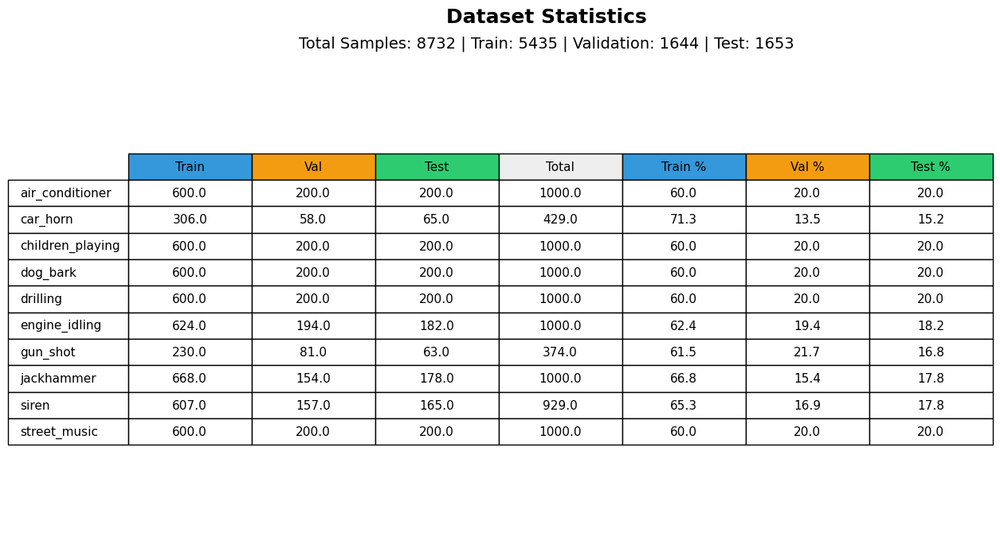

In [10]:
all_labels = np.concatenate([train_labels, val_labels, test_labels])
unique_labels = sorted(np.unique(all_labels).tolist())
stats_data = []
for i in unique_labels:
    stats_data.append([np.sum(train_labels==i),np.sum(val_labels==i),np.sum(test_labels==i),np.sum(all_labels == i)])

stats_df = pd.DataFrame(stats_data, index=unique_labels,columns=['Train', 'Validation', 'Test', 'Total'])

stats_df['Train %'] = (stats_df['Train'] / stats_df['Total'] * 100).round(1)
stats_df['Val %'] = (stats_df['Validation'] / stats_df['Total'] * 100).round(1)
stats_df['Test %'] = (stats_df['Test'] / stats_df['Total'] * 100).round(1)

plt.figure(figsize=(14, 8))
ax = plt.gca()
ax.axis('off')
table = plt.table(
    cellText=stats_df.values,
    rowLabels=stats_df.index,
    colLabels=['Train', 'Val', 'Test', 'Total', 'Train %', 'Val %', 'Test %'],
    cellLoc='center',
    loc='center',
    colColours=['#3498db', '#f39c12', '#2ecc71', '#eeeeee', '#3498db', '#f39c12', '#2ecc71']
)

table.set_fontsize(11)
table.scale(1,2)
plt.figtext(0.5, 0.93, 'Dataset Statistics', ha='center', fontsize=18, weight='bold')
plt.figtext(0.5, 0.89, f"Total Samples: {len(all_labels)} | "
                      f"Train: {len(train_labels)} | "
                      f"Validation: {len(val_labels)} | "
                      f"Test: {len(test_labels)}", 
           ha='center', fontsize=14)

plt.show()

### 1.2.3 Class Distribution Analysis

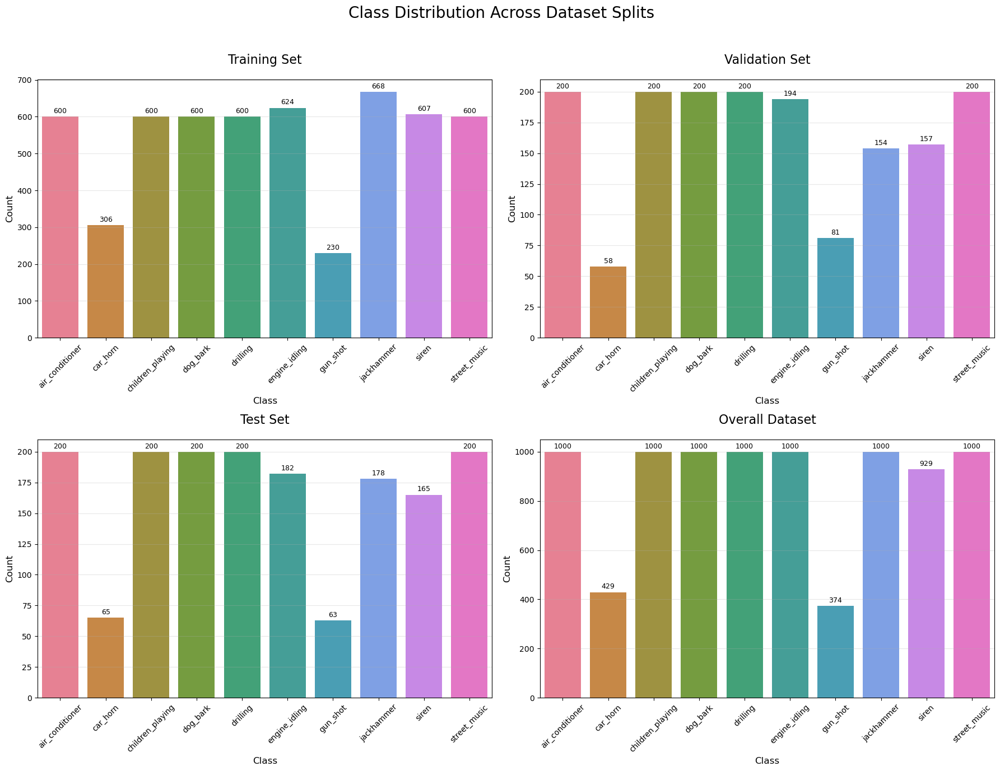

In [11]:
all_labels = np.concatenate([train_labels, val_labels, test_labels])
fig1, axs1 = plt.subplots(2, 2, figsize=(18, 14))
fig1.suptitle('Class Distribution Across Dataset Splits', fontsize=20, y=0.98)

plot_class_distribution(labels=train_labels, 
                       title='Training Set', 
                       ax=axs1[0, 0])

plot_class_distribution(labels=val_labels, 
                       title='Validation Set', 
                       ax=axs1[0, 1])

plot_class_distribution(labels=test_labels, 
                       title='Test Set', 
                       ax=axs1[1, 0])

plot_class_distribution(labels=all_labels, 
                       title='Overall Dataset', 
                       ax=axs1[1, 1])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 1.2.4 Waveform & Spectrogram Plots

In [12]:
def plot_waveform(audio,sample_rate,title="Waveform",ax=None):
    if ax is None:
        fig,ax = plt.subplots(figsize=(10,3))

    time = np.linspace(0,len(audio)/sample_rate,len(audio))
    ax.plot(time,audio)
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Time (s)",fontsize=10)
    ax.set_ylabel("Amplitude",fontsize=10)
    ax.set_xlim(0, time[-1])
    ax.grid(alpha=0.3)
    return ax

def plot_mel_spectrogram(log_mel,sample_rate,hop_length,title="Mel Spectrogram",ax=None):
    if ax is None:
        fig,ax = plt.subplots(figsize=(10,4))
    else:
        fig = ax.figure

    img = librosa.display.specshow(log_mel, sr=sample_rate,hop_length=hop_length,x_axis='time',y_axis='mel',ax=ax)
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Time (s)",fontsize=10)
    ax.set_ylabel("Frequency (Hz)",fontsize=10)
    fig.colorbar(img,ax=ax,format="%+2.0f dB")
    return ax

def plot_energy(energy,sample_rate,hop_length,title="Energy (RMS)",ax=None):
    if ax is None:
        _, ax = plt.subplots(figsize=(10, 3))
    times = librosa.times_like(energy,sr=sample_rate,hop_length=hop_length)
    ax.plot(times, energy.flatten(),color='r',linewidth=1.5)
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Time (s)",fontsize=10)
    ax.set_ylabel("Energy",fontsize=10)
    ax.set_xlim(0, times[-1])
    ax.grid(alpha=0.3)
    return ax

def plot_mfcc(mfcc,sample_rate,hop_length,title="MFCCs",ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 4))
    else:
        fig = ax.figure
    
    img = librosa.display.specshow(mfcc,sr=sample_rate,hop_length=hop_length,x_axis='time',ax=ax,cmap='coolwarm')
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Time (s)",fontsize=10)
    ax.set_ylabel("MFCC Coefficients",fontsize=10)
    fig.colorbar(img, ax=ax)
    return ax

def plot_all(feature_dict,sample_rate,hop_length,class_name=""):
    fig,axs = plt.subplots(4,1,figsize=(12,10),sharex=True)
    fig.suptitle(f"{class_name}",fontsize=16,y=0.98)

    plot_waveform(feature_dict['waveform'], sample_rate, title="Waveform", ax=axs[0])
    plot_mel_spectrogram(feature_dict['log_mel'], sample_rate, hop_length, title="Mel Spectrogram", ax=axs[1])
    plot_energy(feature_dict['energy'], sample_rate, hop_length, title="Energy (RMS)", ax=axs[2])
    plot_mfcc(feature_dict['mfcc'], sample_rate, hop_length, title="MFCCs", ax=axs[3])
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    return fig

def plot_classes(features_list,labels,sample_rate,hop_length,n_classes=5):
    classes = np.unique(labels)[:n_classes]
    fig, axs = plt.subplots(n_classes,4,figsize=(16,3*n_classes))
    fig.suptitle("Classes Feature Analysis",fontsize=20,y=0.98)
    
    for i, c in enumerate(classes):
        idx = np.where(labels == c)[0][0]
        features = features_list[idx]
        plot_waveform(features['waveform'], sample_rate, f"{c} Waveform", ax=axs[i, 0])
        plot_mel_spectrogram(features['log_mel'], sample_rate, hop_length, f"{c} Mel Spectrogram", ax=axs[i, 1])
        plot_energy(features['energy'], sample_rate, hop_length, f"{c} Energy", ax=axs[i, 2])
        plot_mfcc(features['mfcc'], sample_rate, hop_length, f"{c} MFCCs", ax=axs[i, 3])
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    return fig

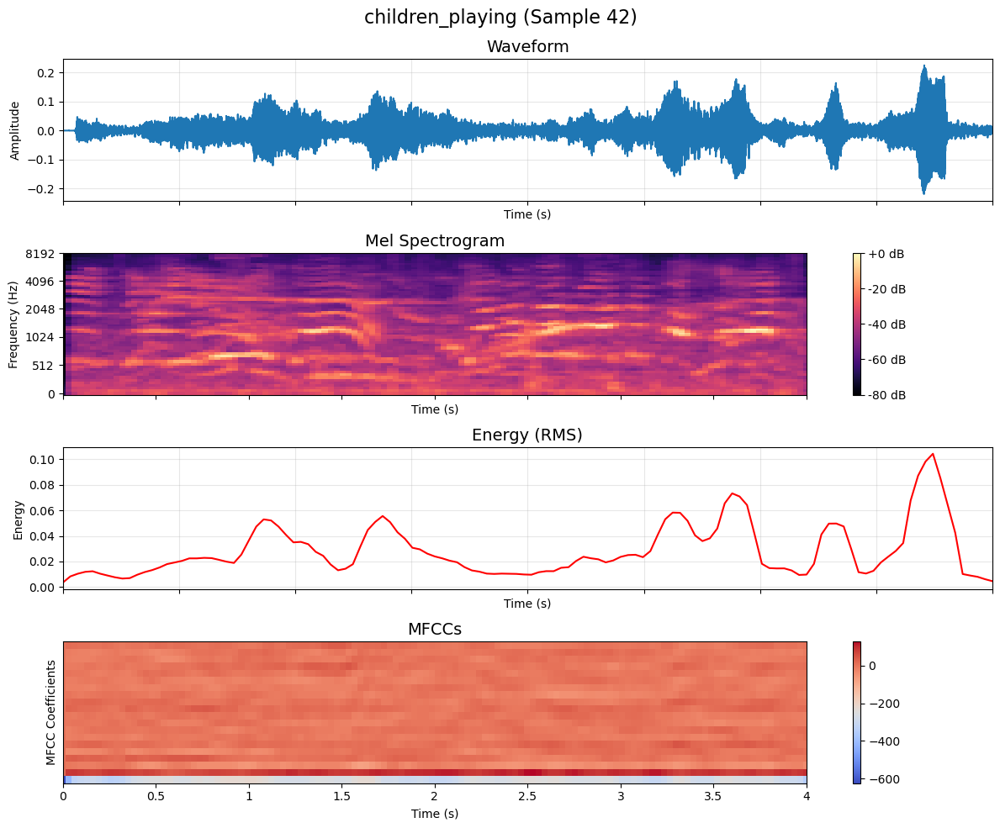

In [13]:
sample = 42
features = train_features[sample]
class_name = train_labels[sample]

plot_all(features,sample_rate=config['sample_rate'],hop_length=config['hop_length'],class_name=f"{class_name} (Sample {sample})")
plt.show()

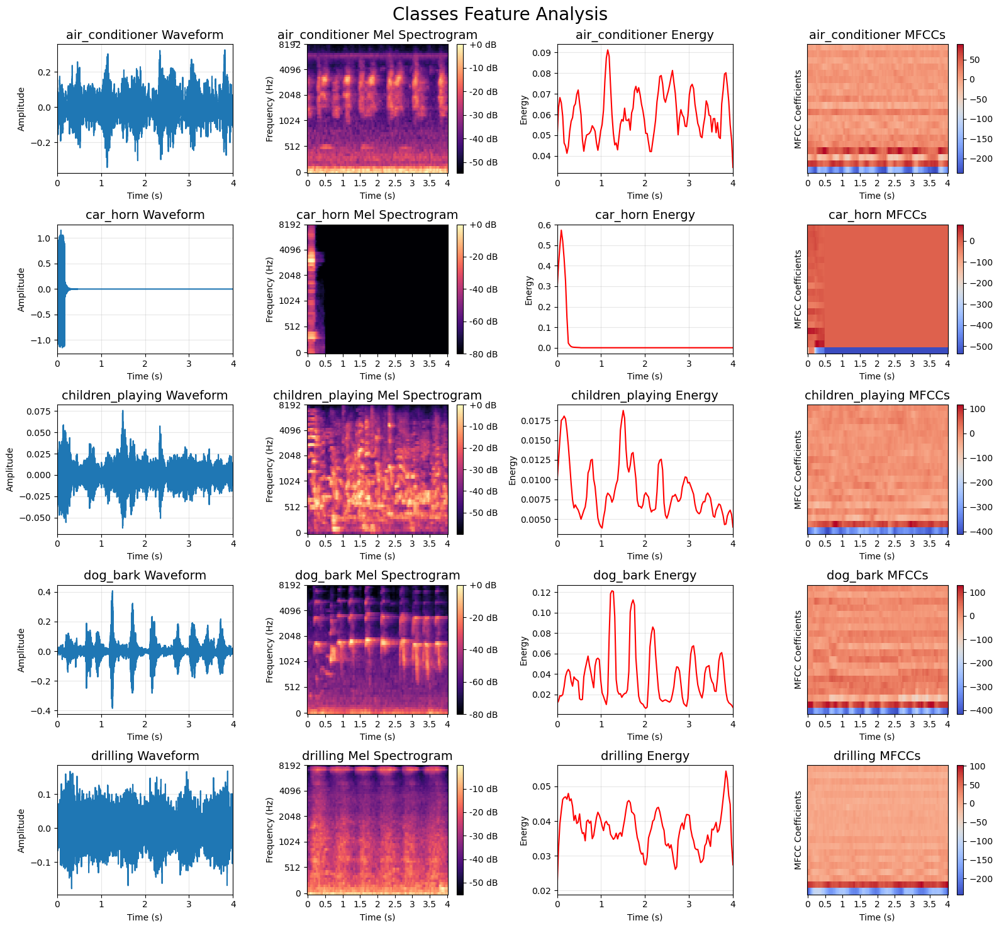

In [14]:
plot_classes(
    features_list=train_features,
    labels=train_labels,
    sample_rate=config['sample_rate'],
    hop_length=config['hop_length'],
    n_classes=5
)
plt.show()

## 2. Building the Model

### 2.1 RNN Model

In [ ]:
class SoundClassifierRNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, bidirectional = True, num_classes = 10):
        super(SoundClassifierRNN, self).__init__()
        self.rnn = nn.RNN(input_size = input_size,
                          hidden_size = hidden_size,
                          num_layers = num_layers,
                          bidirectional = bidirectional,
                          batch_first = True)
        
        self.fc = nn.Linear(hidden_size * (2 if bidirectional else 1), num_classes)
        self.dropout = nn.Dropout(p = 0.6)
        
    def forward(self, x):
        # x: [batch_size, time_steps, input_size]
        out, _ = self.rnn(x)           # out: [batch_size, time_steps, hidden_size]
        out, _ = out.max(dim=1)        # use element_wise max for all hidden states (e.g. like what happem in sentiment classification)
        out = self.dropout(out)
        out = self.fc(out)             # out: [batch_size, num_classes]
        return out

In [ ]:
num_layers_list = [1, 2, 3, 4]
hidden_sizes_list = [32, 64, 128, 256]
features = [
    "log_mel",
    "mfcc",
    "energy"
]
num_epochs = 100
batch_size = 60

In [24]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [25]:
classes = np.unique(train_labels)
class_to_index = {name: idx for idx, name in enumerate(classes)}
train_labels_idx = np.array([class_to_index[name] for name in train_labels])
val_labels_idx   = np.array([class_to_index[name] for name in val_labels])
test_labels_idx  = np.array([class_to_index[name] for name in test_labels])

print(train_labels_idx)
print(val_labels_idx)
print(test_labels_idx)

[2 6 0 ... 3 4 8]
[5 5 5 ... 0 0 7]
[7 0 3 ... 8 4 2]


In [157]:
from torch.utils.data import TensorDataset, DataLoader
results_rnn = []

os.makedirs("saved_models", exist_ok=True)
for feature_name in features:
    print(f"\n=== Feature: {feature_name} ===")
    
    X_train_np = np.stack([x[feature_name] for x in train_features])
    X_train_np = np.transpose(X_train_np, (0, 2, 1))
    X_val_np = np.stack([x[feature_name] for x in val_features])
    X_val_np = np.transpose(X_val_np, (0, 2, 1))
    
    X_train = torch.tensor(X_train_np, dtype=torch.float32)
    y_train = torch.tensor(train_labels_idx, dtype=torch.long)

    X_val = torch.tensor(X_val_np, dtype=torch.float32)
    y_val = torch.tensor(val_labels_idx, dtype=torch.long)

    train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size = batch_size, shuffle = True)
    val_loader = DataLoader(TensorDataset(X_val, y_val), batch_size = batch_size, shuffle = False)

    for num_layers in num_layers_list:
        for hidden_size in hidden_sizes_list:
            print(f"\n>> Layers: {num_layers}, Hidden size: {hidden_size}")
            best_val_acc = 0.0
            model_filename = f"saved_models/model_{feature_name}_L{num_layers}_H{hidden_size}.pth"

            model = SoundClassifierRNN(
                input_size = X_train.shape[2],
                hidden_size = hidden_size,
                num_layers = num_layers
            ).to(device)

            criterion = nn.CrossEntropyLoss()
            optimizer = optim.Adam(model.parameters(), lr=0.00016667)  # lr = 0.01/60            
            for epoch in range(num_epochs):
                model.train()
                train_loss = 0
                correct = 0
                total = 0
                for inputs, labels in train_loader:
                    inputs = inputs.to(device)
                    labels = labels.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()

                    train_loss += loss.item() * inputs.size(0)
                    _, predicted = outputs.max(1)
                    total += labels.size(0)
                    correct += predicted.eq(labels).sum().item()

                avg_train_loss = train_loss / total
                train_acc = 100. * correct / total

                # === Validation ===
                model.eval()
                val_loss = 0
                correct = 0
                total = 0

                with torch.no_grad():
                    for inputs, labels in val_loader:
                        inputs = inputs.to(device)
                        labels = labels.to(device)
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                        val_loss += loss.item() * inputs.size(0)
                        _, predicted = outputs.max(1)
                        total += labels.size(0)
                        correct += predicted.eq(labels).sum().item()

                avg_val_loss = val_loss / total
                val_acc = 100. * correct / total

                print(f"Epoch [{epoch+1}/{num_epochs}] "
                      f"Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.2f}% | "
                      f"Val Loss: {avg_val_loss:.4f}, Val Acc: {val_acc:.2f}%")

                if val_acc > best_val_acc:
                    best_val_acc = val_acc
                    torch.save(model.state_dict(), model_filename)

                results_rnn.append({
                     'Epoch': epoch,
                     'Feature': feature_name,
                     'Num_Layers': num_layers,
                     'Hidden_Size': hidden_size,
                     'Train_Acc': train_acc,
                     'Val_Acc': val_acc,
                     'Train_Loss': avg_train_loss,
                     'Val_Loss': avg_val_loss
                 })


=== Feature: log_mel ===

>> Layers: 1, Hidden size: 32
Epoch [1/100] Train Loss: 2.4446, Train Acc: 13.56% | Val Loss: 2.1736, Val Acc: 23.18%
Epoch [2/100] Train Loss: 2.3772, Train Acc: 13.56% | Val Loss: 2.1289, Val Acc: 27.74%
Epoch [3/100] Train Loss: 2.2781, Train Acc: 17.63% | Val Loss: 2.0853, Val Acc: 27.31%
Epoch [4/100] Train Loss: 2.2162, Train Acc: 19.54% | Val Loss: 2.0413, Val Acc: 26.58%
Epoch [5/100] Train Loss: 2.1677, Train Acc: 21.36% | Val Loss: 1.9847, Val Acc: 33.70%
Epoch [6/100] Train Loss: 2.1302, Train Acc: 22.04% | Val Loss: 1.9445, Val Acc: 33.52%
Epoch [7/100] Train Loss: 2.0770, Train Acc: 24.21% | Val Loss: 1.9291, Val Acc: 31.93%
Epoch [8/100] Train Loss: 2.0525, Train Acc: 24.32% | Val Loss: 1.8983, Val Acc: 34.67%
Epoch [9/100] Train Loss: 2.0298, Train Acc: 25.74% | Val Loss: 1.8791, Val Acc: 36.19%
Epoch [10/100] Train Loss: 1.9815, Train Acc: 28.04% | Val Loss: 1.8477, Val Acc: 39.11%
Epoch [11/100] Train Loss: 1.9767, Train Acc: 28.37% | Val Los

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

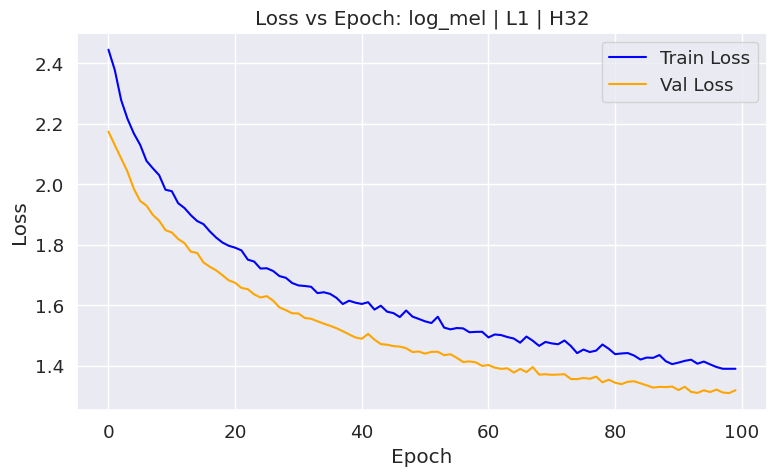

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

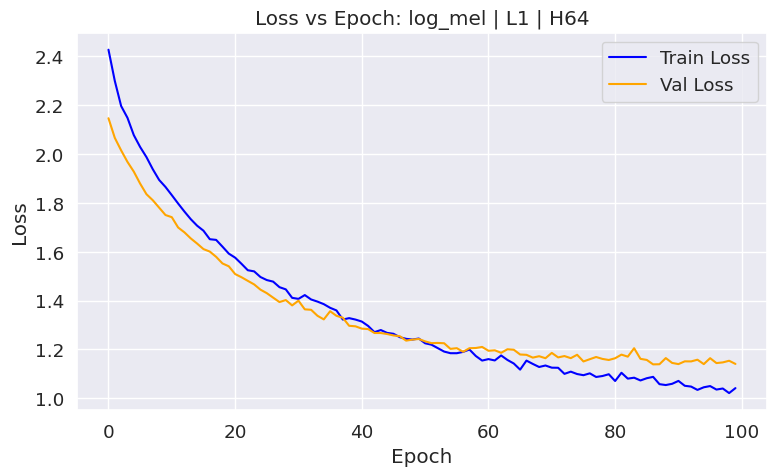

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

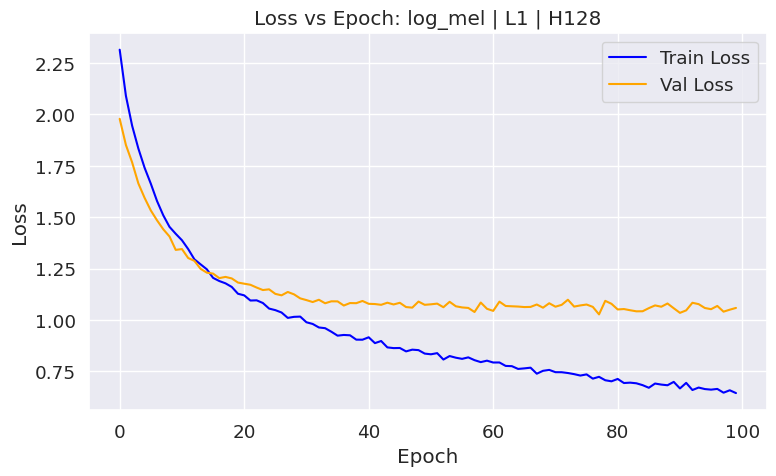

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

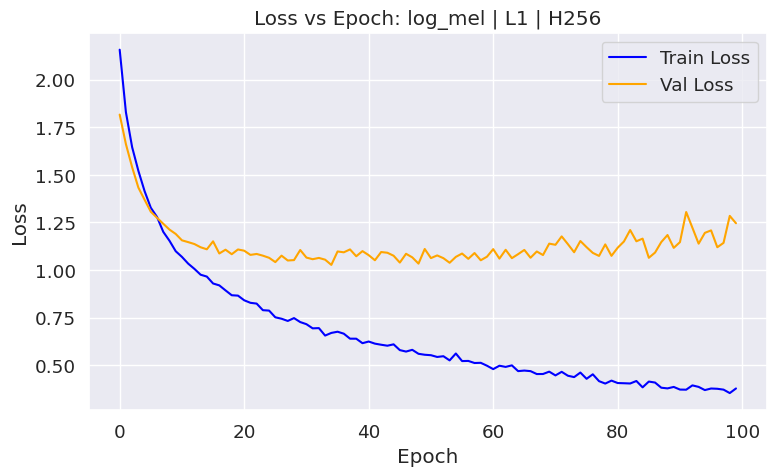

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

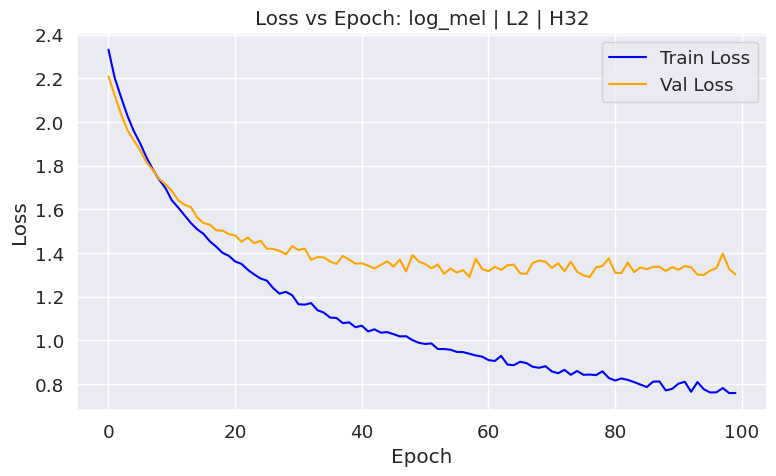

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

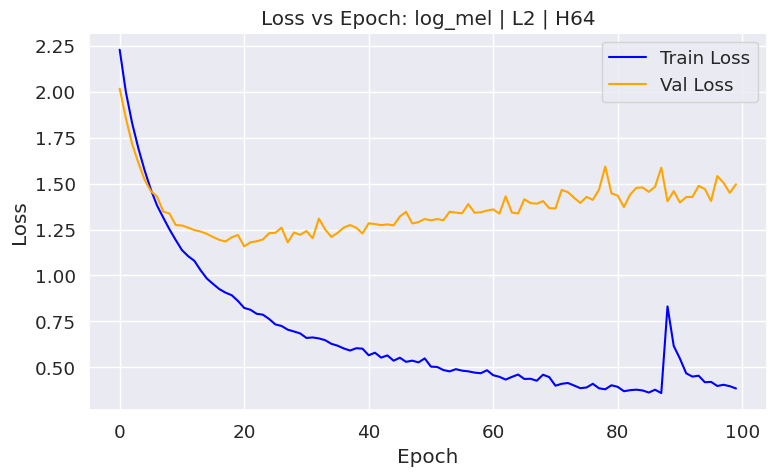

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

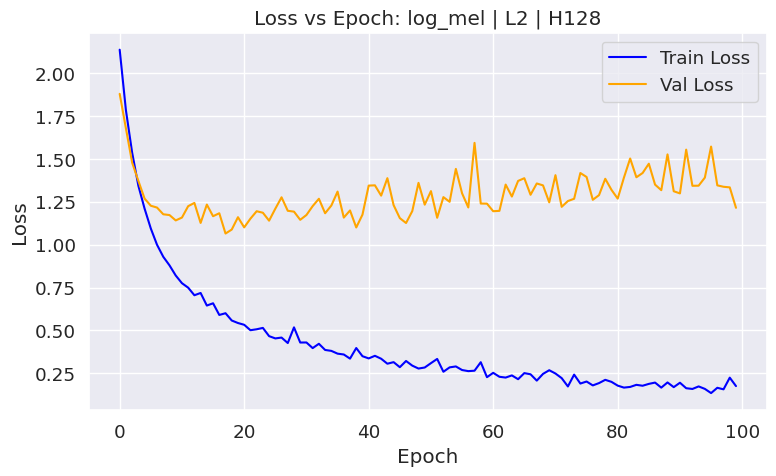

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

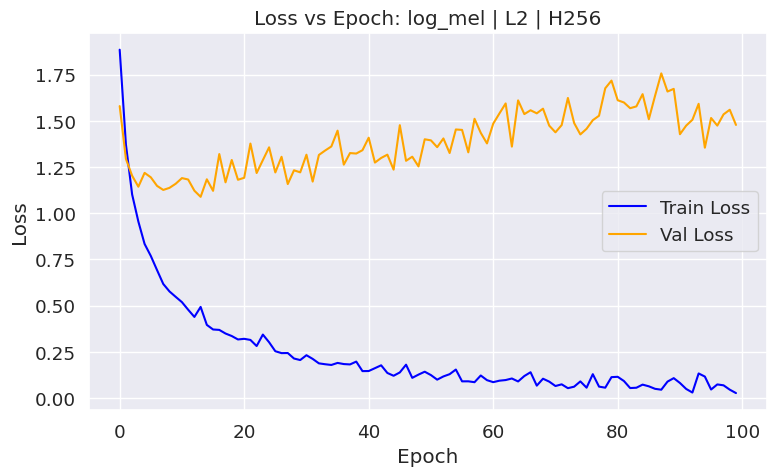

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

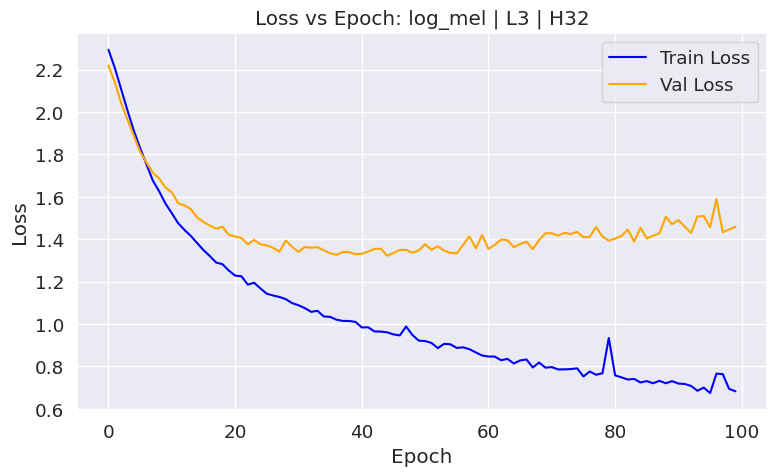

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

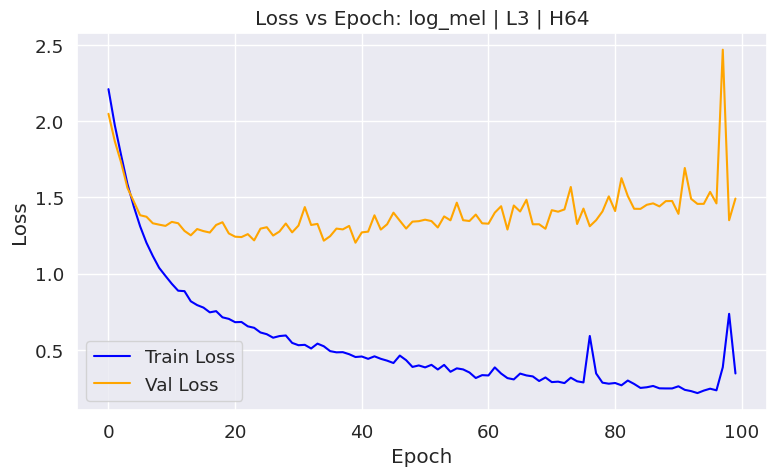

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

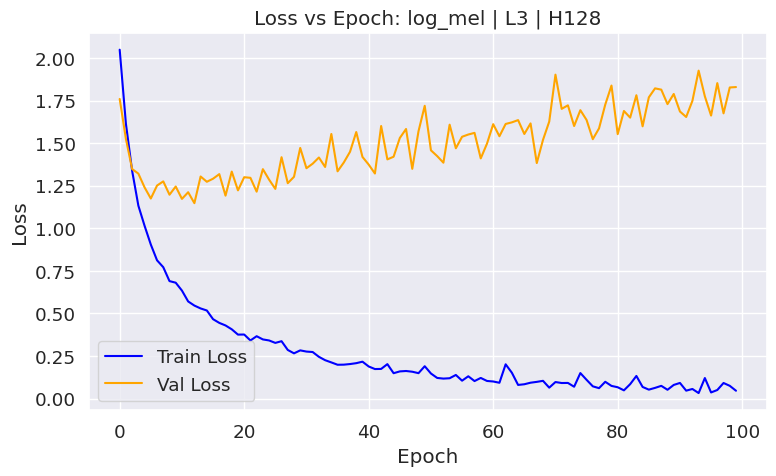

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

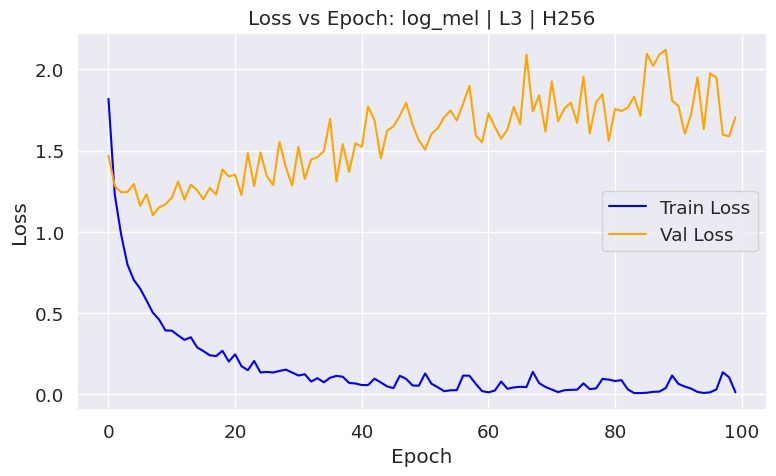

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

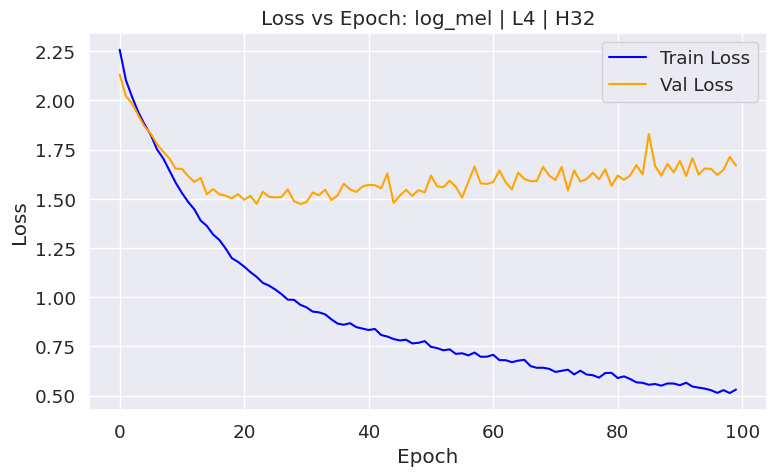

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

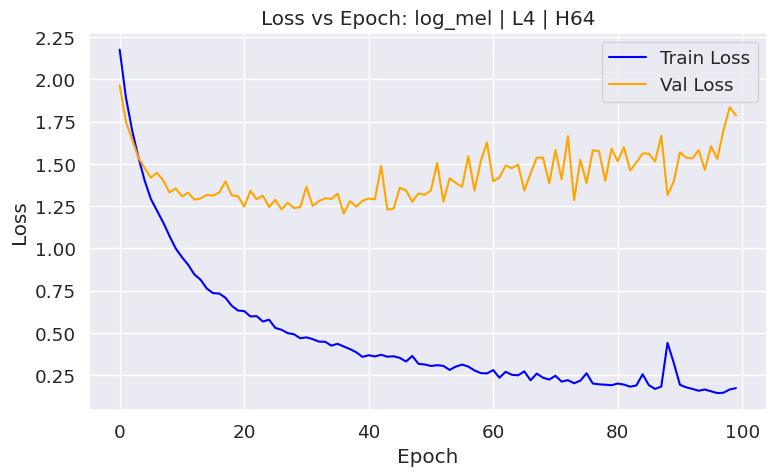

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

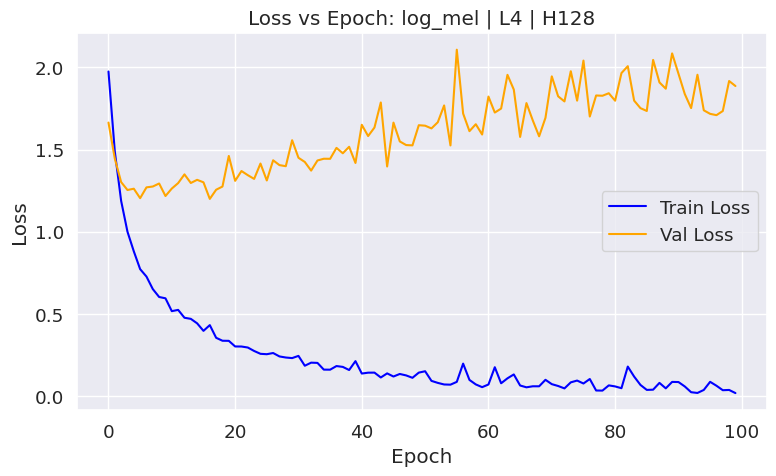

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

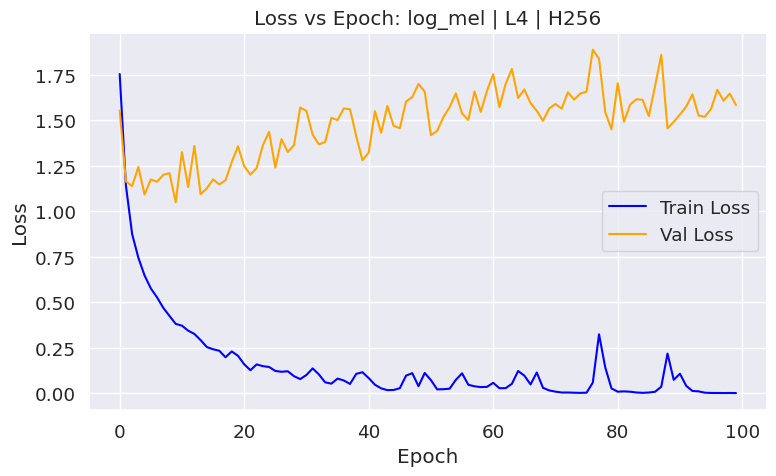

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

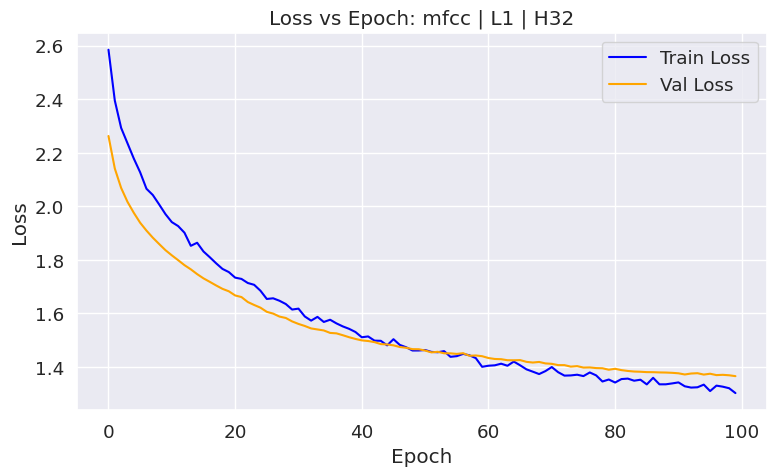

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

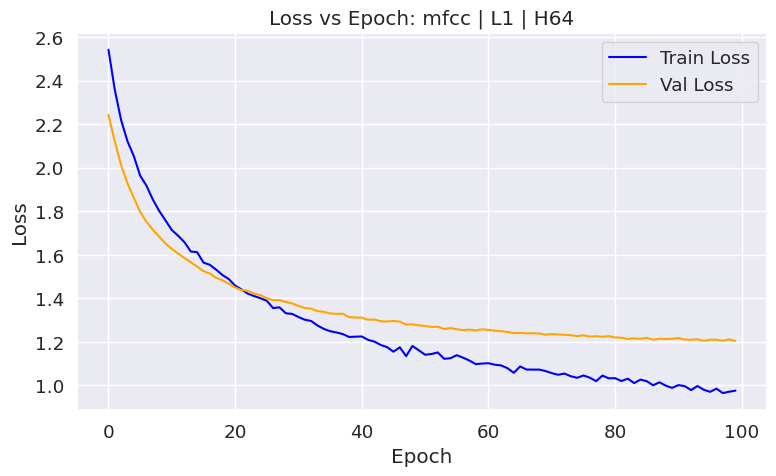

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

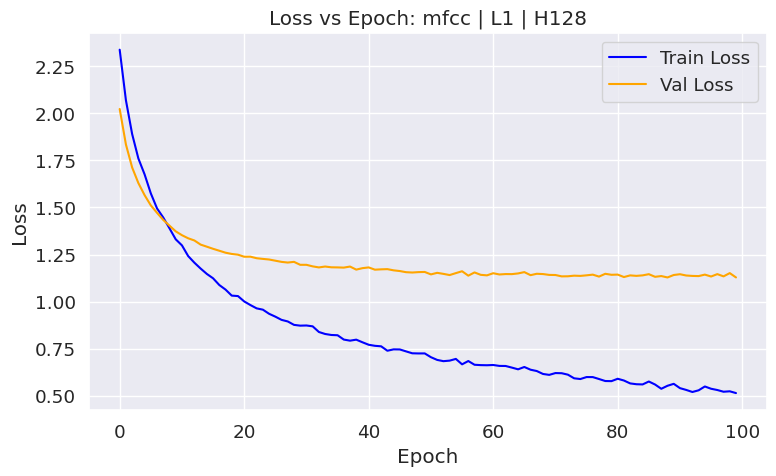

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

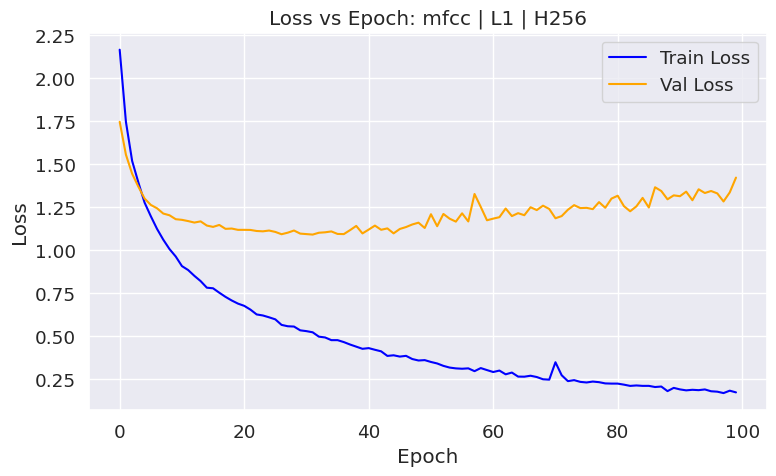

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

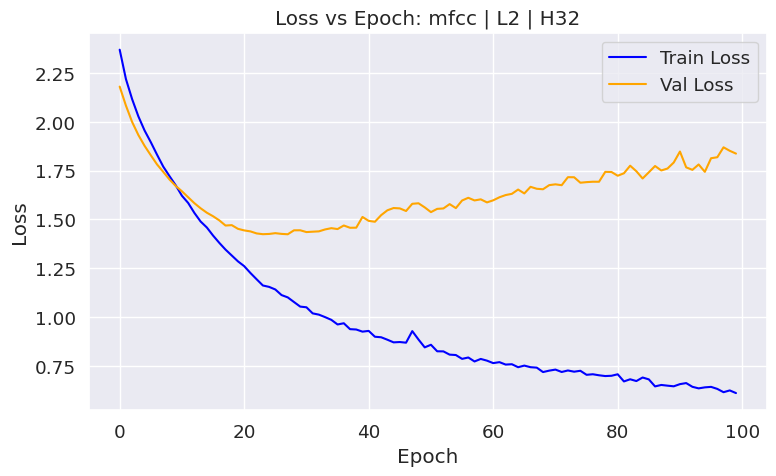

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

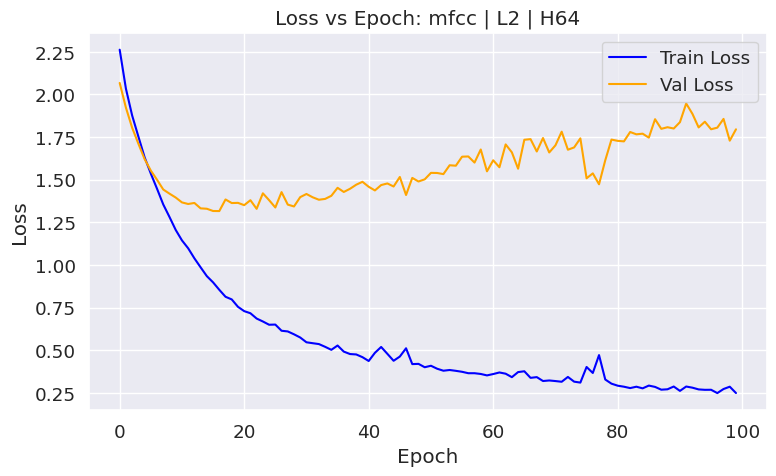

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

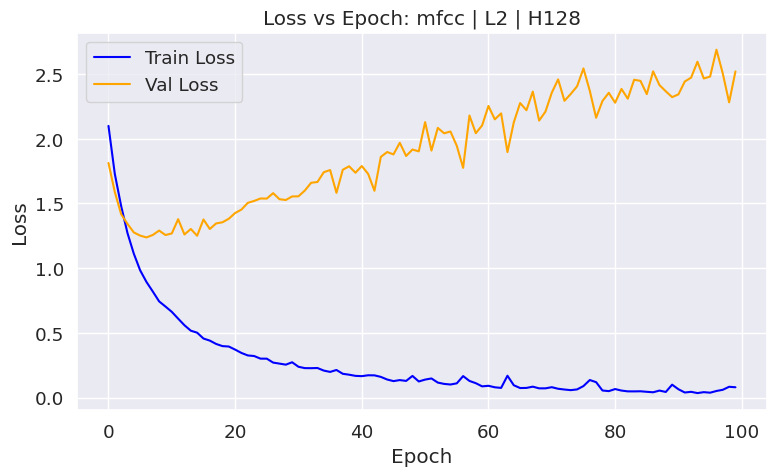

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

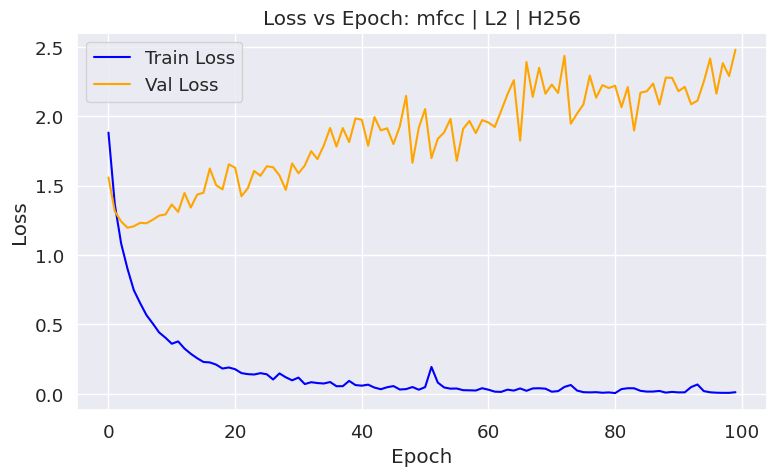

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

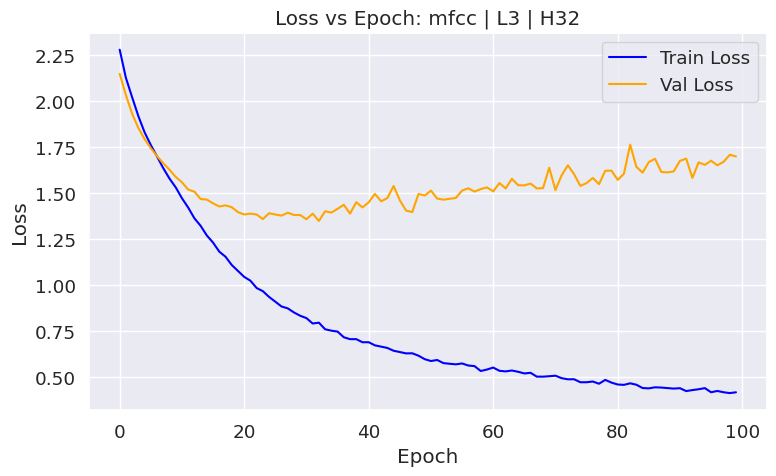

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

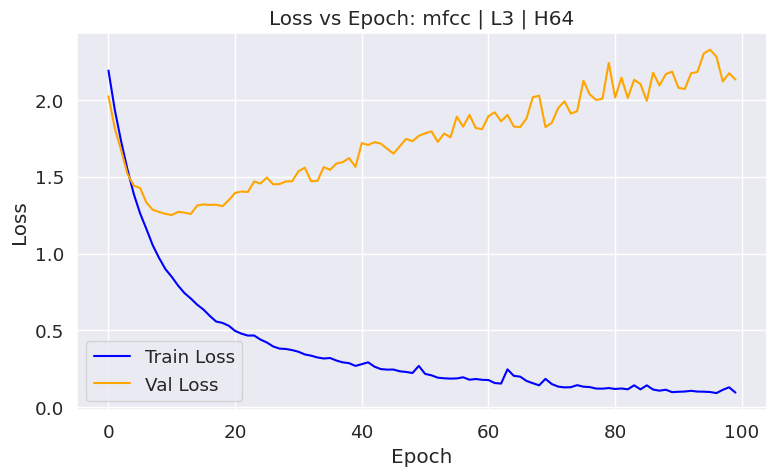

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

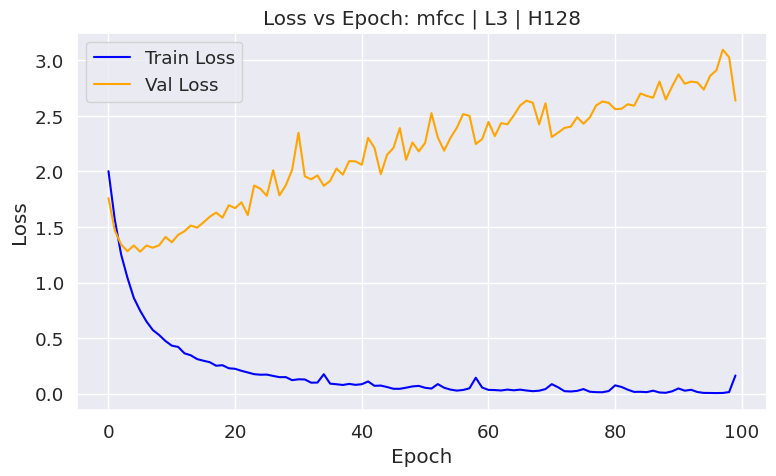

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

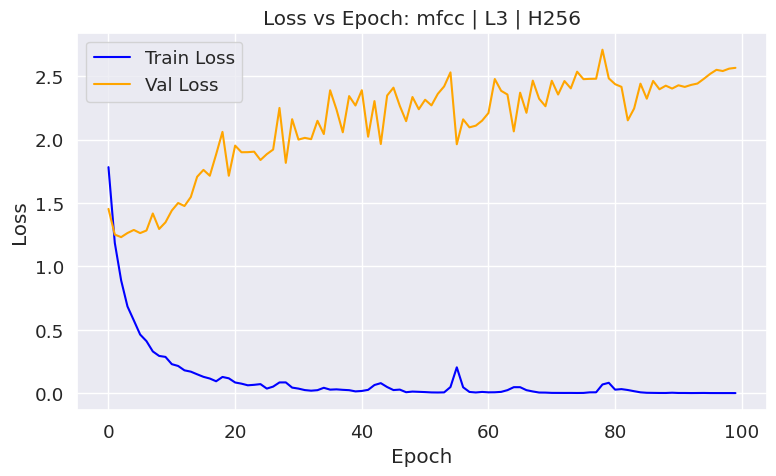

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

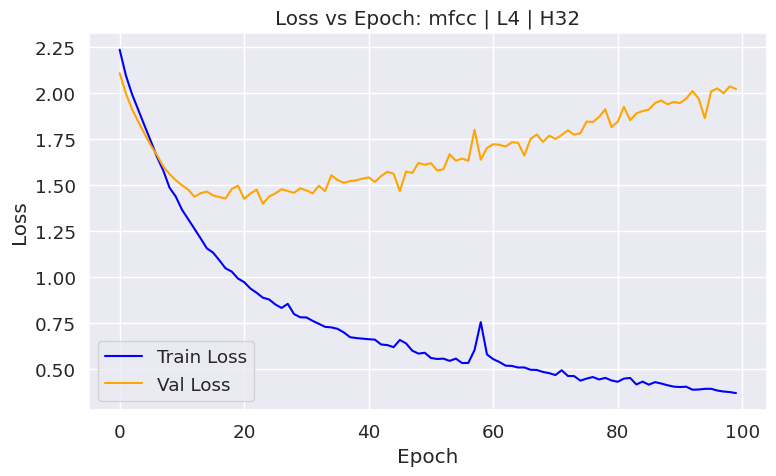

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

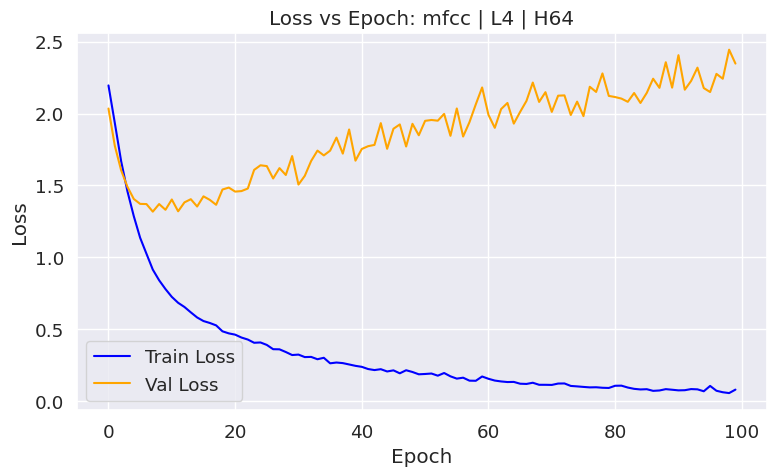

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

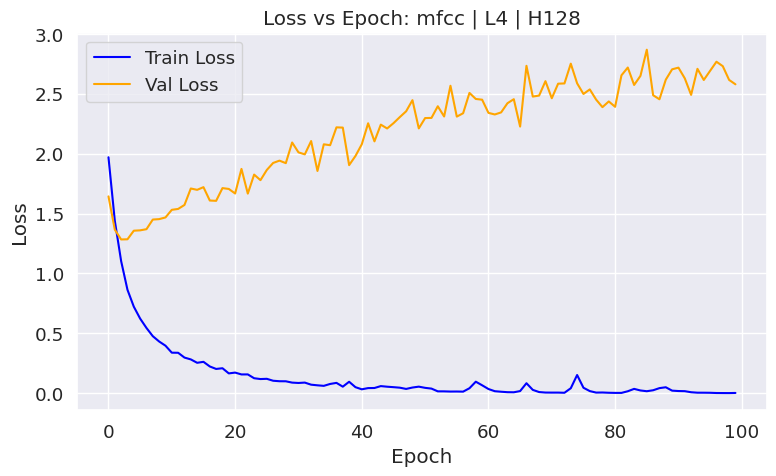

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

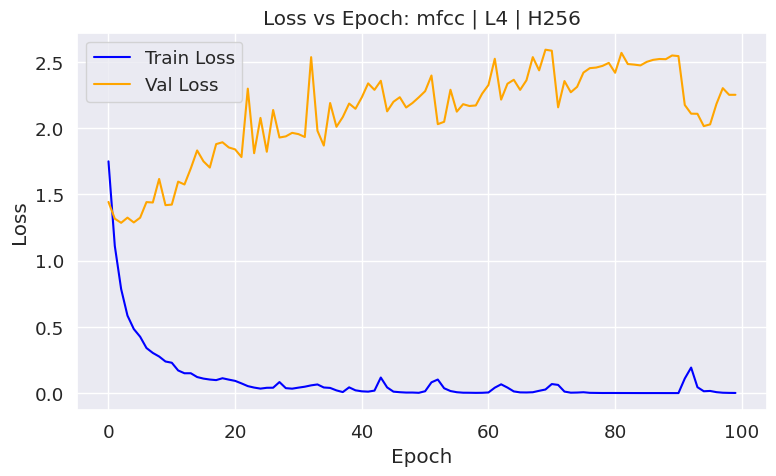

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

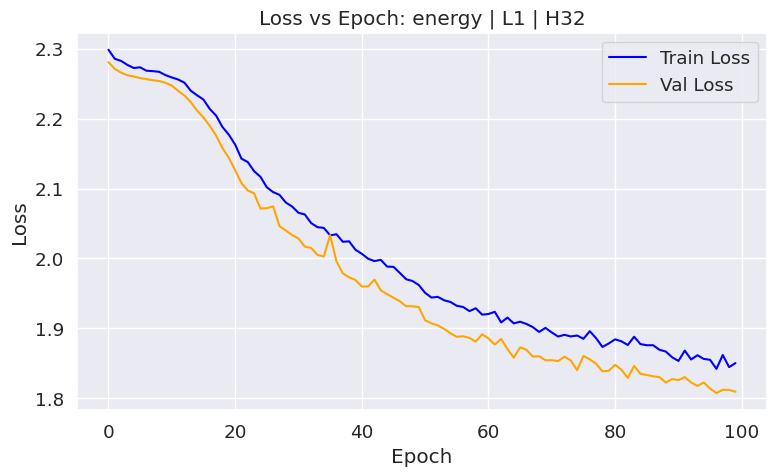

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

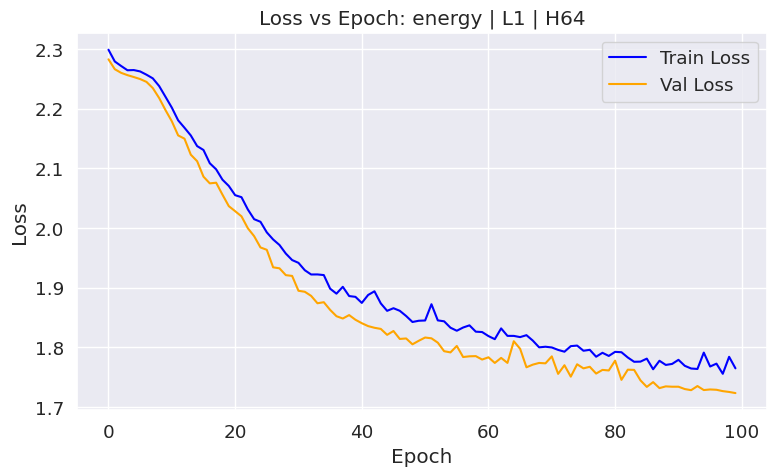

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

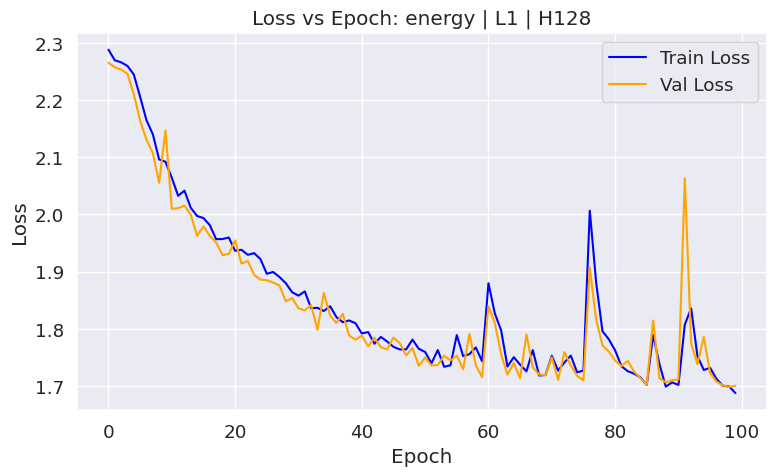

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

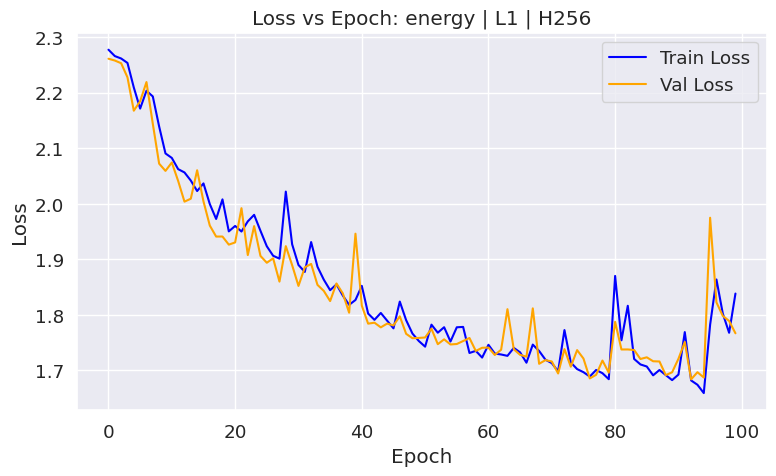

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

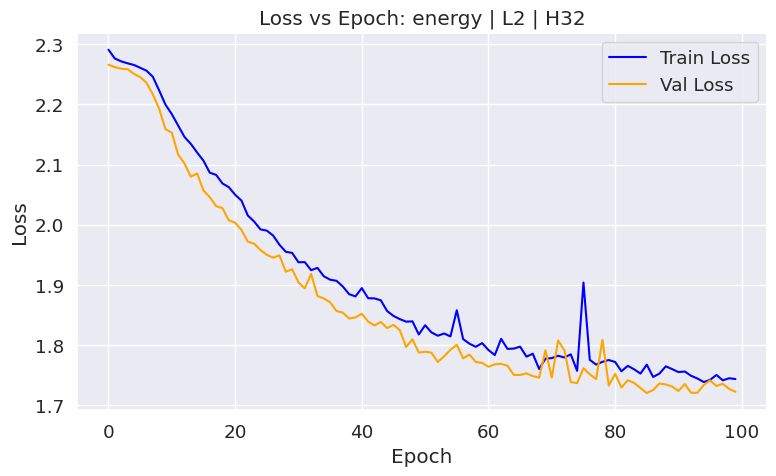

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

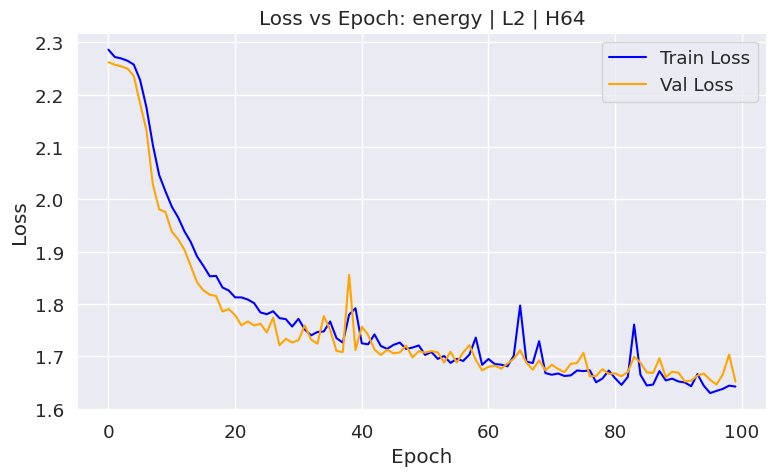

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

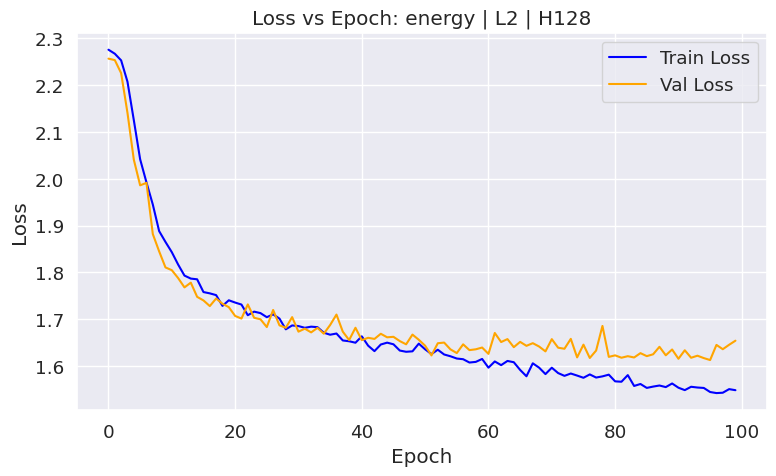

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

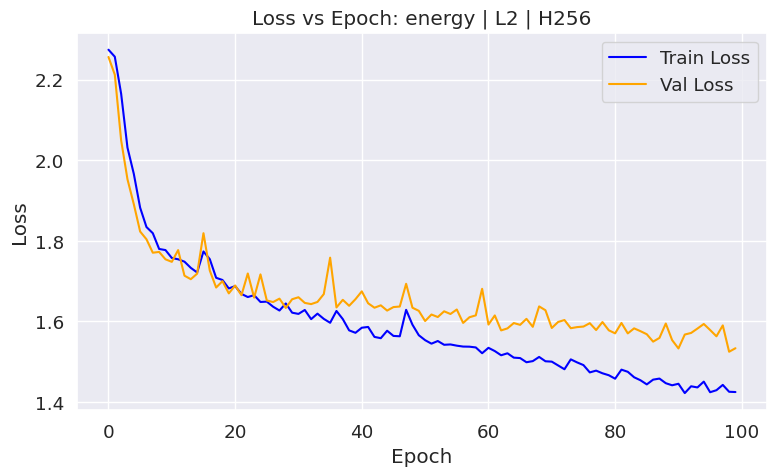

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

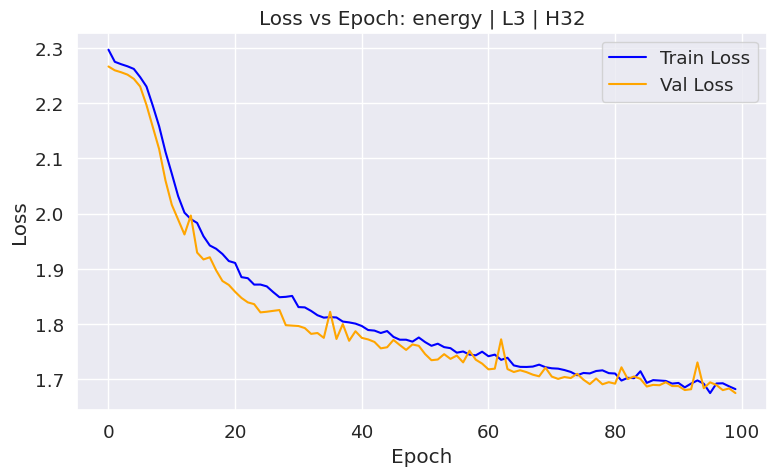

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

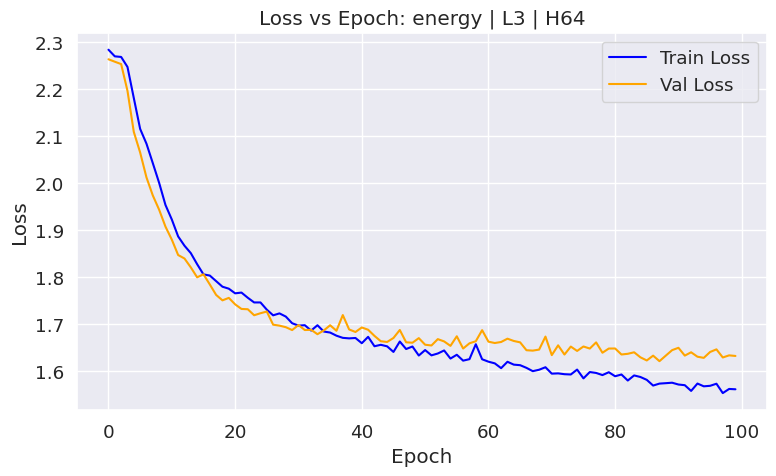

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

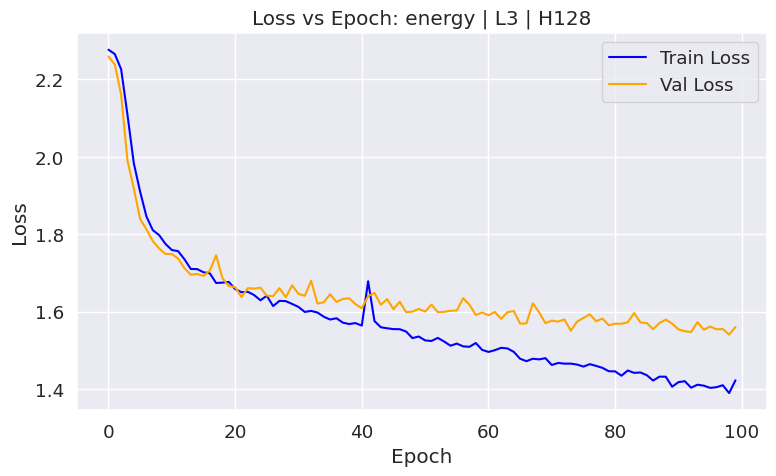

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

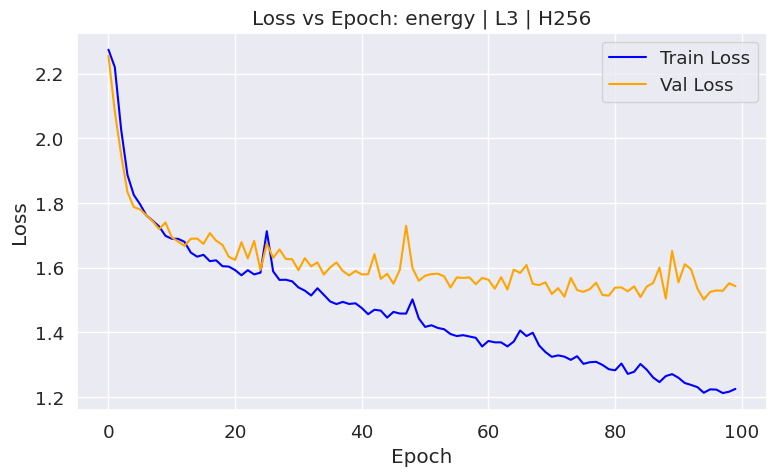

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

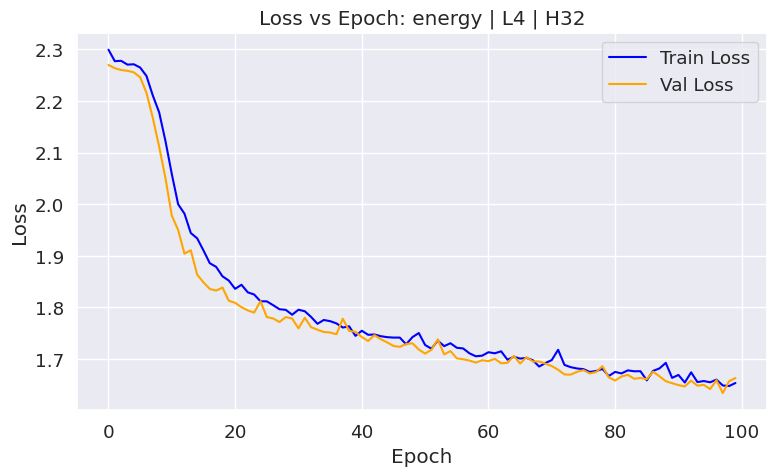

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

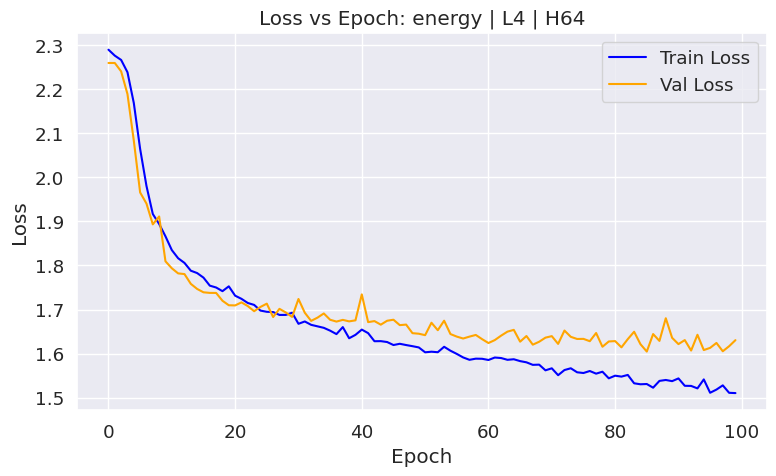

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

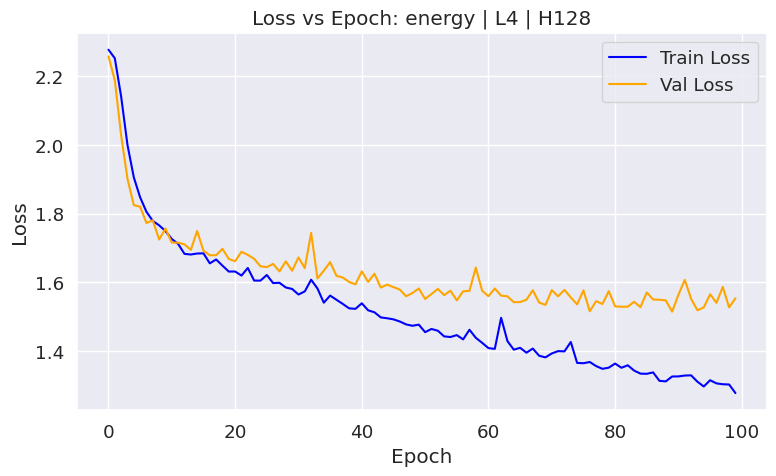

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

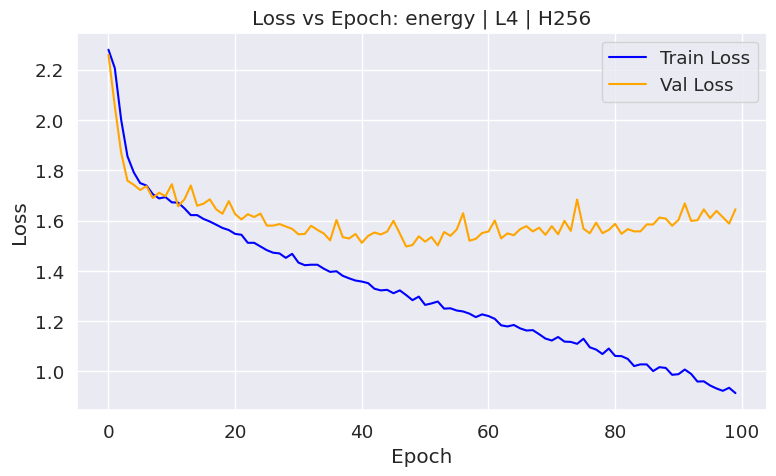

In [159]:
df = pd.DataFrame(results_rnn)
df['Config'] = df.apply(lambda row: f"{row['Feature']} | L{row['Num_Layers']} | H{row['Hidden_Size']}", axis=1)

unique_configs = df['Config'].unique()

for config in unique_configs:
    df_config = df[df['Config'] == config]

    plt.figure(figsize=(8, 5))
    sns.lineplot(data=df_config, x='Epoch', y='Train_Loss', label='Train Loss', color='blue')
    sns.lineplot(data=df_config, x='Epoch', y='Val_Loss', label='Val Loss', color='orange')

    plt.title(f"Loss vs Epoch: {config}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.tight_layout()
    plt.grid(True)
    plt.show()


=== Feature: log_mel, Layers: 1, Hidden size: 256 ===

Test Loss: 1.2421
Test Accuracy: 66.00%
F1 Score: 0.6964


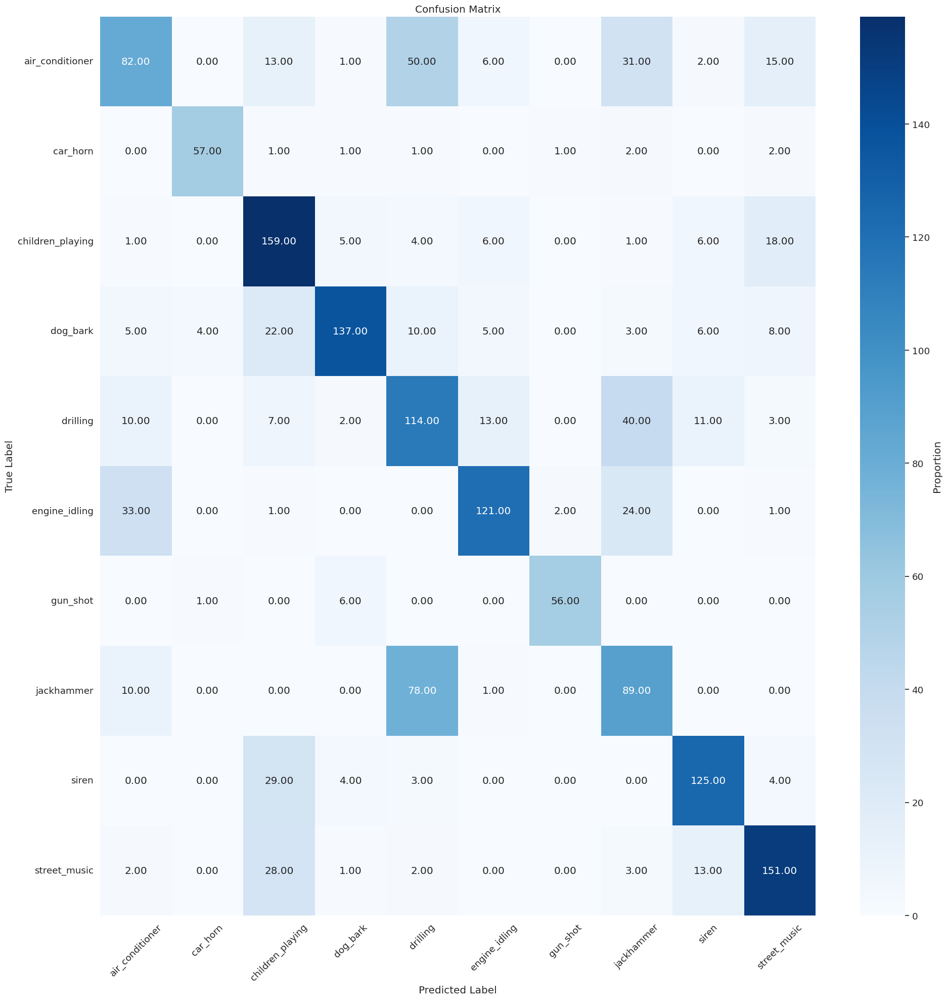

In [164]:
from torch.utils.data import TensorDataset, DataLoader

print(f"\n=== Feature: log_mel, Layers: 1, Hidden size: 256 ===")
X_test_np = np.stack([x['log_mel'] for x in test_features])
X_test_np = np.transpose(X_test_np, (0, 2, 1))
X_test = torch.tensor(X_test_np, dtype=torch.float32)

y_test = torch.tensor(test_labels_idx, dtype=torch.long)
test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size = 60, shuffle = False)  

model = SoundClassifierRNN(
        input_size = X_test.shape[2],
        hidden_size = 256,
        num_layers = 1
        ).to(device)
model_filename = f"saved_models/model_log_mel_L1_H256.pth"
model.load_state_dict(torch.load(model_filename))

model.eval()
test_loss = 0
correct = 0
total = 0
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
avg_test_loss = test_loss / total
test_accuracy = 100. * correct / total
print(f"\nTest Loss: {avg_test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.2f}%")       
f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1 Score: {f1:.4f}")

cm = confusion_matrix(y_true, y_pred)
labels = list(class_to_index.keys())
plt.figure(figsize=(20, 20))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=labels, yticklabels=labels,
            cbar_kws={'label': 'Proportion'})

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


=== Feature: mfcc, Layers: 1, Hidden size: 128 ===

Test Loss: 1.3631
Test Accuracy: 59.41%
F1 Score: 0.6002


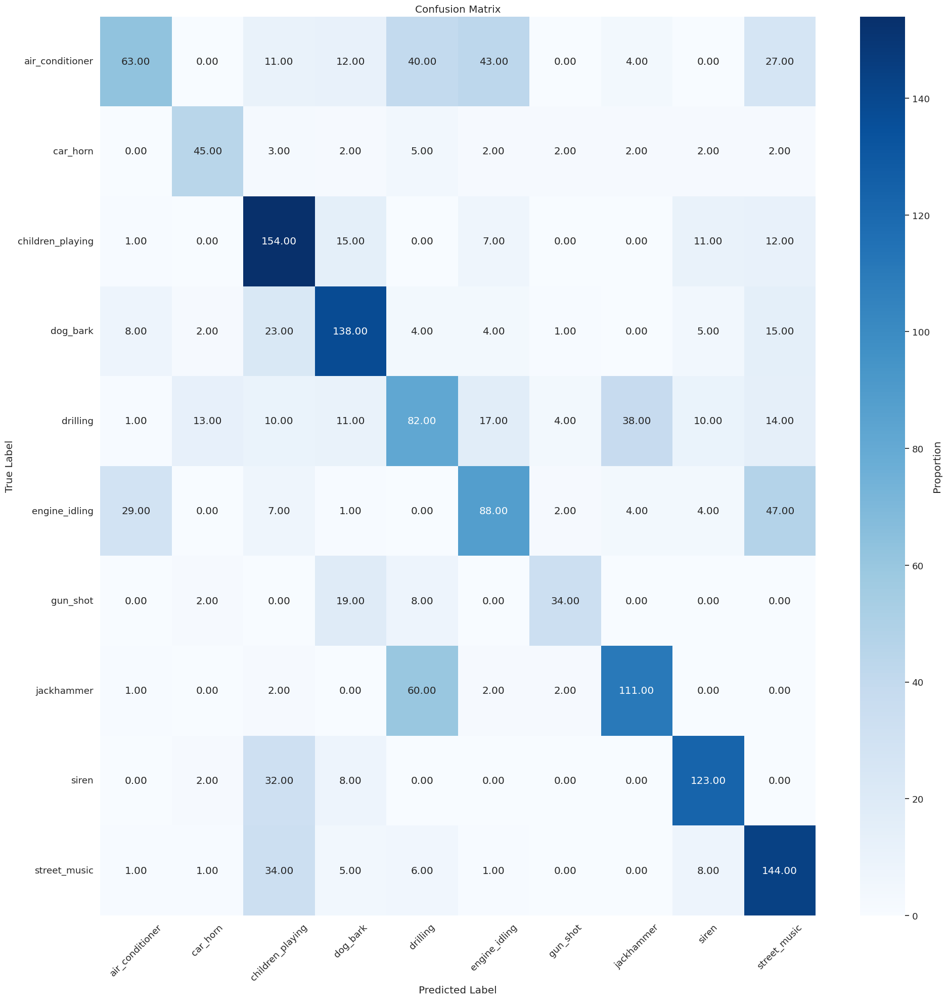

In [169]:
from torch.utils.data import TensorDataset, DataLoader

print(f"\n=== Feature: mfcc, Layers: 1, Hidden size: 128 ===")
X_test_np = np.stack([x['mfcc'] for x in test_features])
X_test_np = np.transpose(X_test_np, (0, 2, 1))
X_test = torch.tensor(X_test_np, dtype=torch.float32)

y_test = torch.tensor(test_labels_idx, dtype=torch.long)
test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size = 60, shuffle = False)  

model = SoundClassifierRNN(
        input_size = X_test.shape[2],
        hidden_size = 128,
        num_layers = 1
        ).to(device)
model_filename = f"saved_models/model_mfcc_L1_H128.pth"
model.load_state_dict(torch.load(model_filename))

model.eval()
test_loss = 0
correct = 0
total = 0
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
avg_test_loss = test_loss / total
test_accuracy = 100. * correct / total
print(f"\nTest Loss: {avg_test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.2f}%")       
f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1 Score: {f1:.4f}")

cm = confusion_matrix(y_true, y_pred)
labels = list(class_to_index.keys())
plt.figure(figsize=(20, 20))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=labels, yticklabels=labels,
            cbar_kws={'label': 'Proportion'})

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


=== Feature: energy, Layers: 2, Hidden size: 256 ===

Test Loss: 1.5555
Test Accuracy: 49.43%
F1 Score: 0.5071


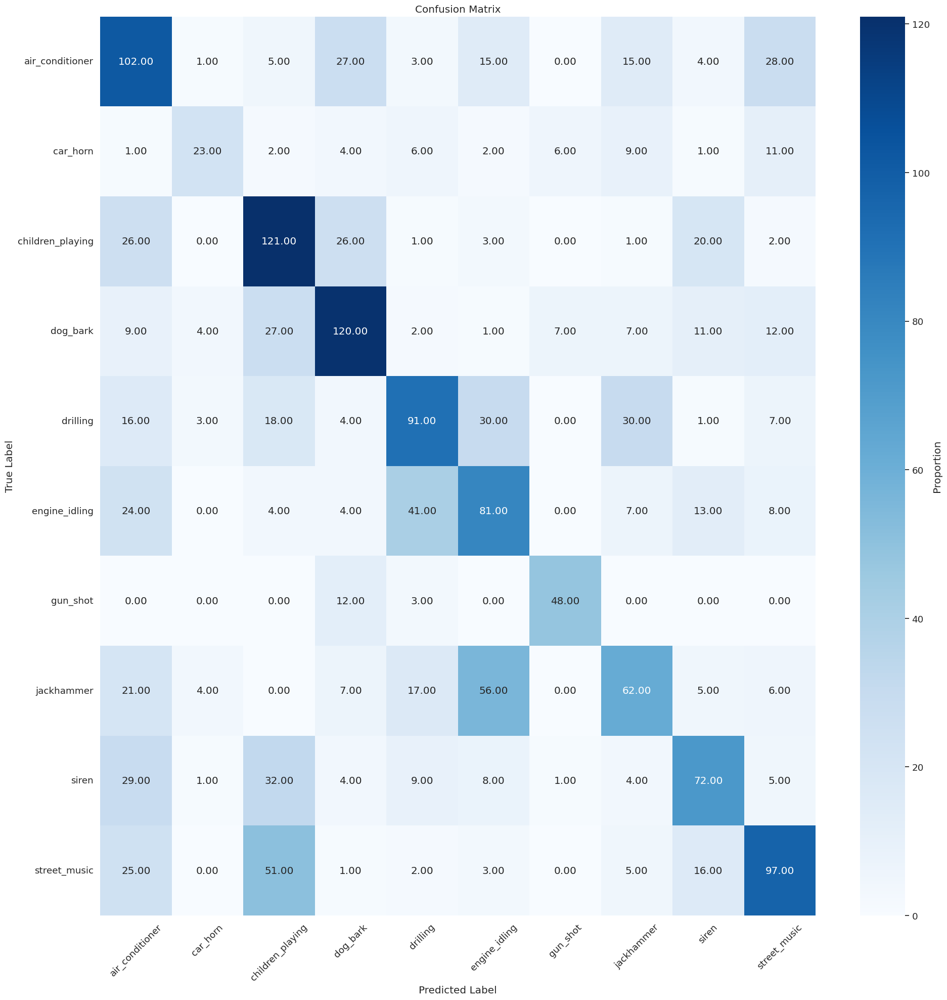

In [166]:
from torch.utils.data import TensorDataset, DataLoader

print(f"\n=== Feature: energy, Layers: 3, Hidden size: 128 ===")
X_test_np = np.stack([x['energy'] for x in test_features])
X_test_np = np.transpose(X_test_np, (0, 2, 1))
X_test = torch.tensor(X_test_np, dtype=torch.float32)

y_test = torch.tensor(test_labels_idx, dtype=torch.long)
test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size = 60, shuffle = False)  

model = SoundClassifierRNN(
        input_size = X_test.shape[2],
        hidden_size = 128,
        num_layers = 3
        ).to(device)
model_filename = f"saved_models/model_energy_L3_H128.pth"
model.load_state_dict(torch.load(model_filename))

model.eval()
test_loss = 0
correct = 0
total = 0
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
avg_test_loss = test_loss / total
test_accuracy = 100. * correct / total
print(f"\nTest Loss: {avg_test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.2f}%")       
f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1 Score: {f1:.4f}")

cm = confusion_matrix(y_true, y_pred)
labels = list(class_to_index.keys())
plt.figure(figsize=(20, 20))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=labels, yticklabels=labels,
            cbar_kws={'label': 'Proportion'})

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [27]:
class SoundClassifierLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, bidirectional = True, num_classes = 10):
        super(SoundClassifierLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size = input_size,
                          hidden_size = hidden_size,
                          num_layers = num_layers,
                          bidirectional = bidirectional,
                          batch_first = True)
        
        self.fc = nn.Linear(hidden_size * (2 if bidirectional else 1), num_classes)
        self.dropout = nn.Dropout(p = 0.6)
        
    def forward(self, x):
        # x: [batch_size, time_steps, input_size]
        out, _ = self.lstm(x)           # out: [batch_size, time_steps, hidden_size]
        out, _ = out.max(dim=1)        # use element_wise max for all hidden states (e.g. like what happem in sentiment classification)
        out = self.dropout(out)
        out = self.fc(out)             # out: [batch_size, num_classes]
        return out

In [28]:
num_layers_list = [1, 2, 3, 4]
hidden_sizes_list = [32, 64, 128, 256]
features = [
    "log_mel",
    "mfcc",
    "energy"
]
num_epochs = 20
batch_size = 60

In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [30]:
classes = np.unique(train_labels)
class_to_index = {name: idx for idx, name in enumerate(classes)}
train_labels_idx = np.array([class_to_index[name] for name in train_labels])
val_labels_idx   = np.array([class_to_index[name] for name in val_labels])
test_labels_idx  = np.array([class_to_index[name] for name in test_labels])

print(train_labels_idx)
print(val_labels_idx)
print(test_labels_idx)

[2 6 0 ... 3 4 8]
[5 5 5 ... 0 0 7]
[7 0 3 ... 8 4 2]


In [31]:
from torch.utils.data import TensorDataset, DataLoader
results_lstm = []
os.makedirs("saved_models", exist_ok=True)
for feature_name in features:
    print(f"\n=== Feature: {feature_name} ===")
    
    X_train_np = np.stack([x[feature_name] for x in train_features])
    X_train_np = np.transpose(X_train_np, (0, 2, 1))
    X_val_np = np.stack([x[feature_name] for x in val_features])
    X_val_np = np.transpose(X_val_np, (0, 2, 1))
    
    X_train = torch.tensor(X_train_np, dtype=torch.float32)
    y_train = torch.tensor(train_labels_idx, dtype=torch.long)

    X_val = torch.tensor(X_val_np, dtype=torch.float32)
    y_val = torch.tensor(val_labels_idx, dtype=torch.long)

    train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size = batch_size, shuffle = True)
    val_loader = DataLoader(TensorDataset(X_val, y_val), batch_size = batch_size, shuffle = False)

    for num_layers in num_layers_list:
        for hidden_size in hidden_sizes_list:
            print(f"\n>> Layers: {num_layers}, Hidden size: {hidden_size}")

            best_val_acc = 0.0
            model_filename = f"saved_models/lstm_model_{feature_name}_L{num_layers}_H{hidden_size}.pth"
            model = SoundClassifierLSTM(
                input_size = X_train.shape[2],
                hidden_size = hidden_size,
                num_layers = num_layers
            ).to(device)

            criterion = nn.CrossEntropyLoss()
            optimizer = optim.Adam(model.parameters(), lr=0.00016667)  # lr = 0.01/60            
            for epoch in range(num_epochs):
                model.train()
                train_loss = 0
                correct = 0
                total = 0
                for inputs, labels in train_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()

                    train_loss += loss.item() * inputs.size(0)
                    _, predicted = outputs.max(1)
                    total += labels.size(0)
                    correct += predicted.eq(labels).sum().item()

                avg_train_loss = train_loss / total
                train_acc = 100. * correct / total

                # === Validation ===
                model.eval()
                val_loss = 0
                correct = 0
                total = 0

                with torch.no_grad():
                    for inputs, labels in val_loader:
                        inputs, labels = inputs.to(device), labels.to(device)
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                        val_loss += loss.item() * inputs.size(0)
                        _, predicted = outputs.max(1)
                        total += labels.size(0)
                        correct += predicted.eq(labels).sum().item()

                avg_val_loss = val_loss / total
                val_acc = 100. * correct / total

                print(f"Epoch [{epoch+1}/{num_epochs}] "
                      f"Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.2f}% | "
                      f"Val Loss: {avg_val_loss:.4f}, Val Acc: {val_acc:.2f}%")
                if val_acc > best_val_acc:
                    best_val_acc = val_acc
                    torch.save(model.state_dict(), model_filename)
                                    
                results_lstm.append({
                     'Epoch': epoch,
                     'Feature': feature_name,
                     'Num_Layers': num_layers,
                     'Hidden_Size': hidden_size,
                     'Train_Acc': train_acc,
                     'Val_Acc': val_acc,
                     'Train_Loss': avg_train_loss,
                     'Val_Loss': avg_val_loss
                })


=== Feature: log_mel ===

>> Layers: 1, Hidden size: 32
Epoch [1/20] Train Loss: 2.2899, Train Acc: 14.35% | Val Loss: 2.2298, Val Acc: 25.91%
Epoch [2/20] Train Loss: 2.2244, Train Acc: 18.29% | Val Loss: 2.1782, Val Acc: 28.22%
Epoch [3/20] Train Loss: 2.1798, Train Acc: 20.13% | Val Loss: 2.1344, Val Acc: 28.04%
Epoch [4/20] Train Loss: 2.1362, Train Acc: 23.94% | Val Loss: 2.0966, Val Acc: 30.35%
Epoch [5/20] Train Loss: 2.1004, Train Acc: 24.86% | Val Loss: 2.0572, Val Acc: 29.74%
Epoch [6/20] Train Loss: 2.0644, Train Acc: 26.00% | Val Loss: 2.0276, Val Acc: 30.23%
Epoch [7/20] Train Loss: 2.0321, Train Acc: 27.60% | Val Loss: 1.9910, Val Acc: 32.85%
Epoch [8/20] Train Loss: 1.9940, Train Acc: 28.96% | Val Loss: 1.9597, Val Acc: 34.12%
Epoch [9/20] Train Loss: 1.9835, Train Acc: 29.59% | Val Loss: 1.9386, Val Acc: 34.85%
Epoch [10/20] Train Loss: 1.9498, Train Acc: 31.85% | Val Loss: 1.9029, Val Acc: 35.22%
Epoch [11/20] Train Loss: 1.9176, Train Acc: 32.70% | Val Loss: 1.8802, 

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

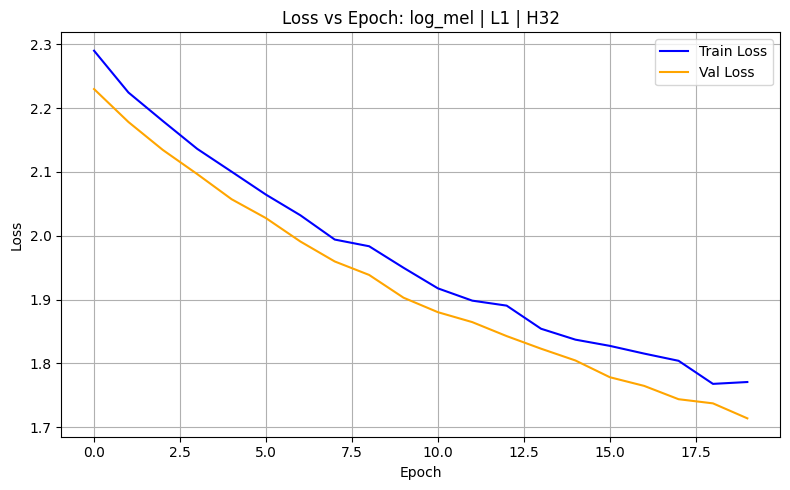

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

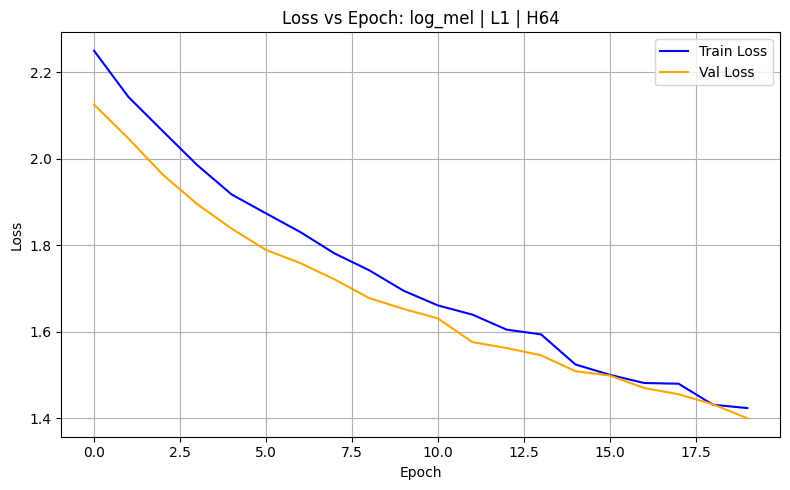

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

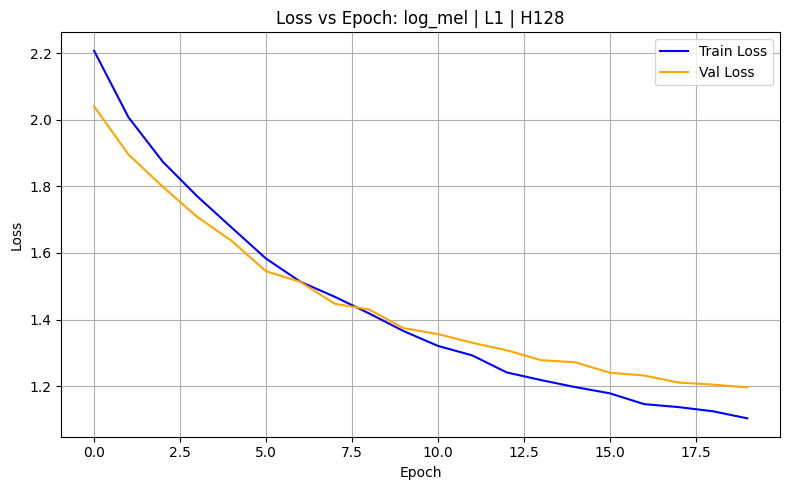

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

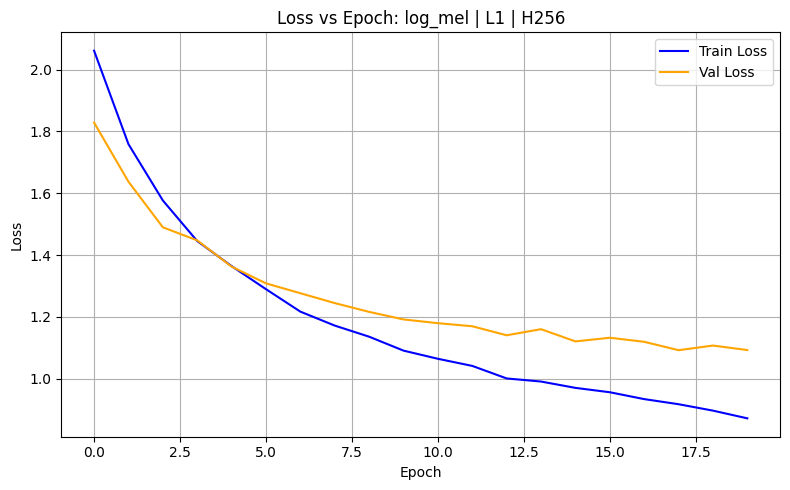

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

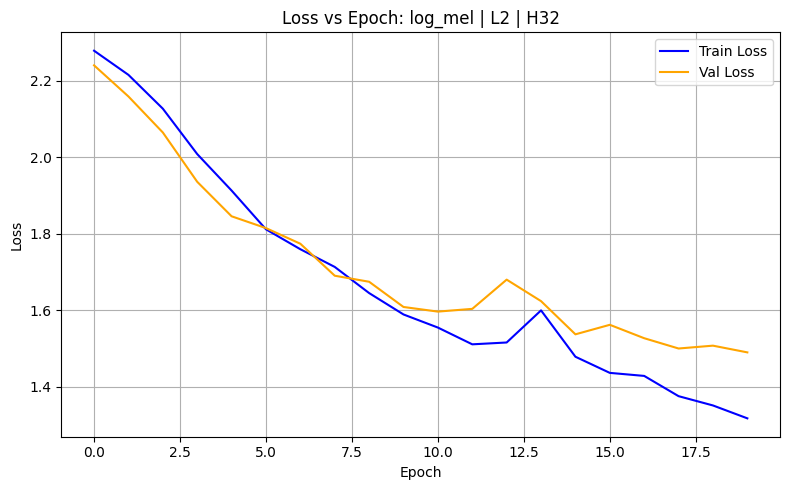

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

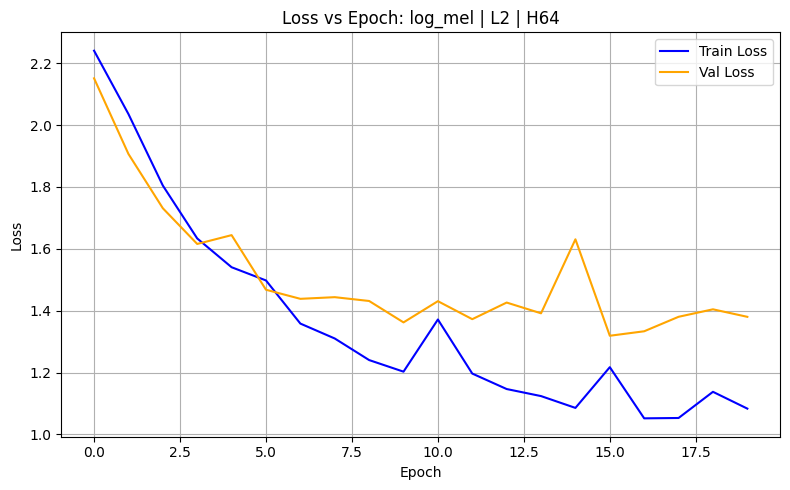

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

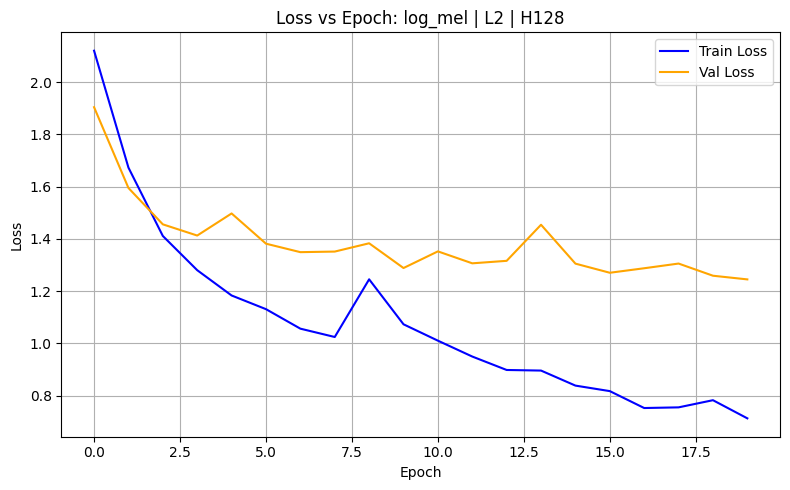

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

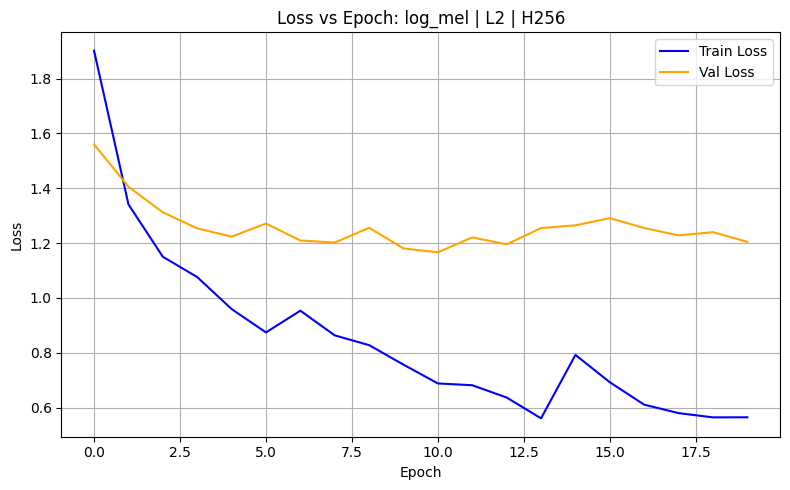

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

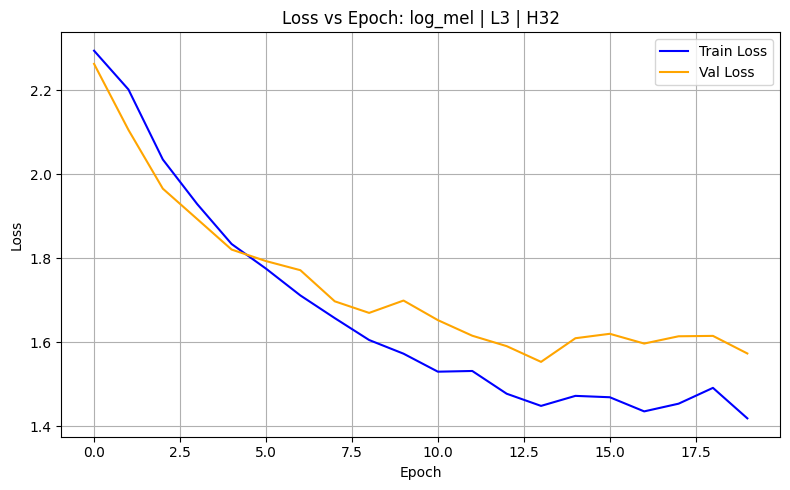

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

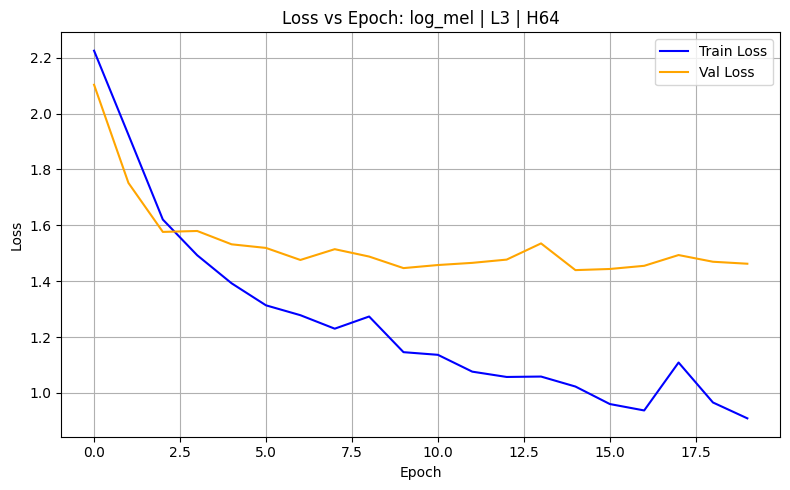

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

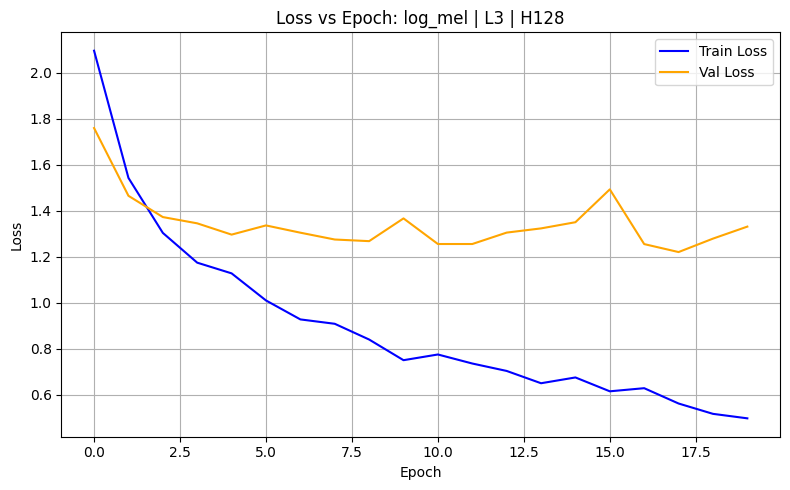

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

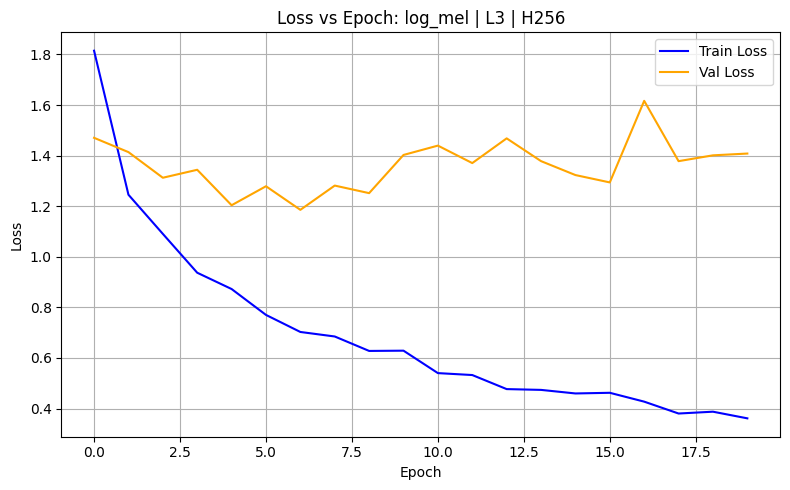

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

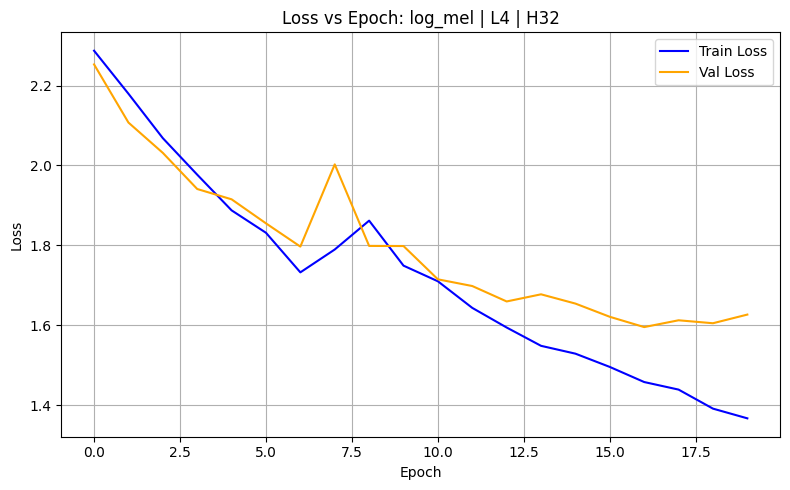

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

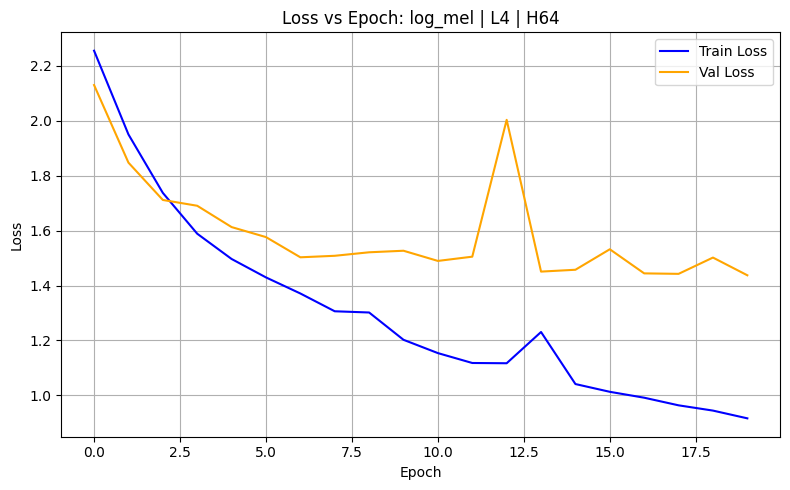

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

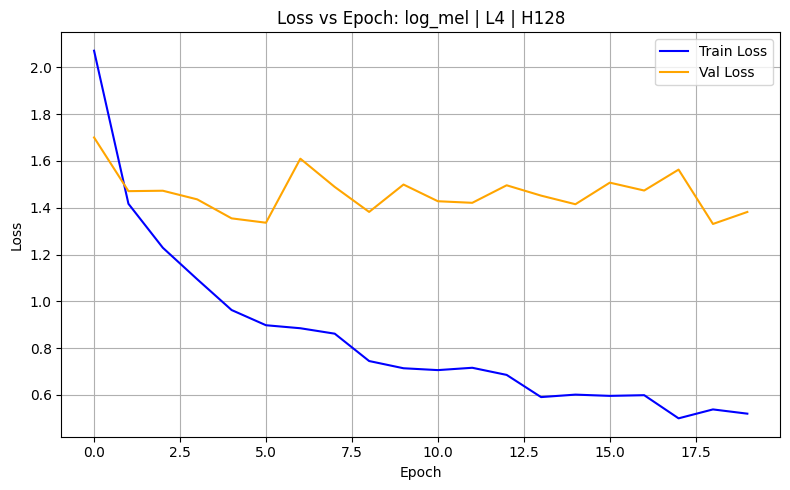

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

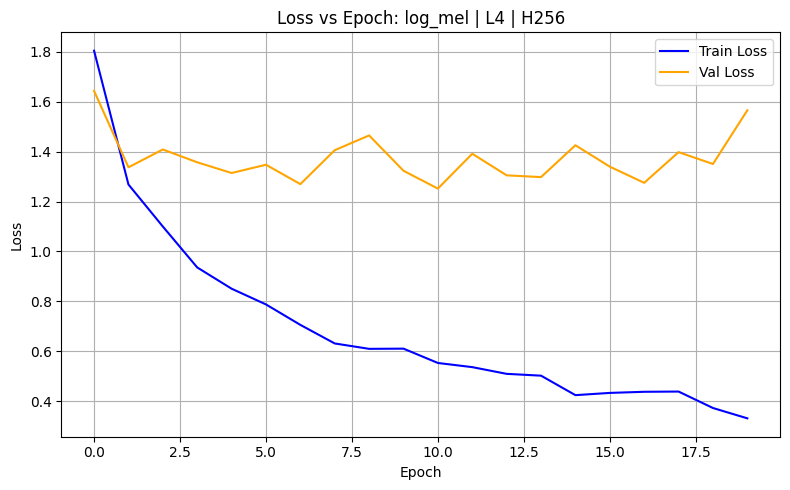

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

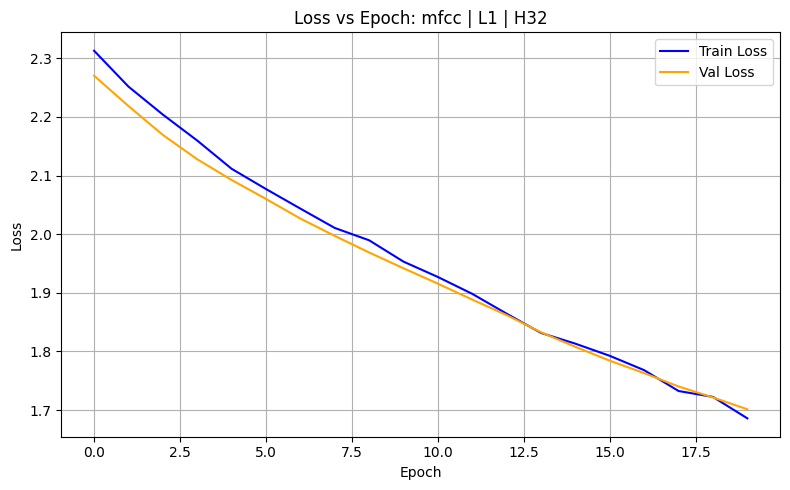

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

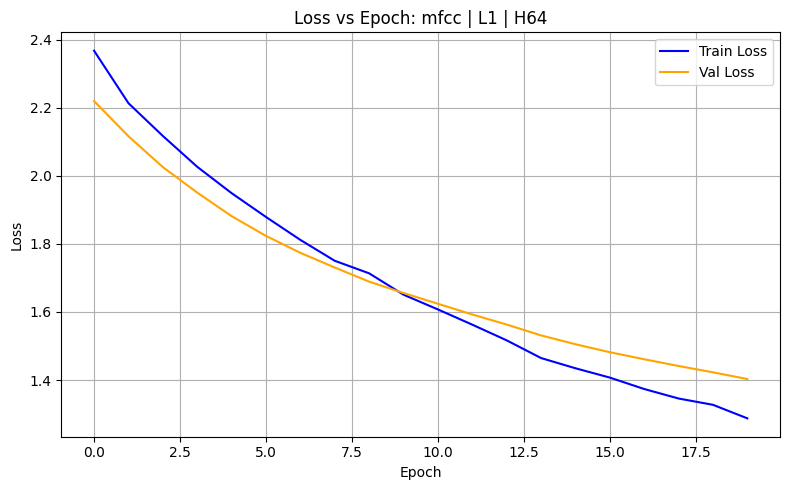

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

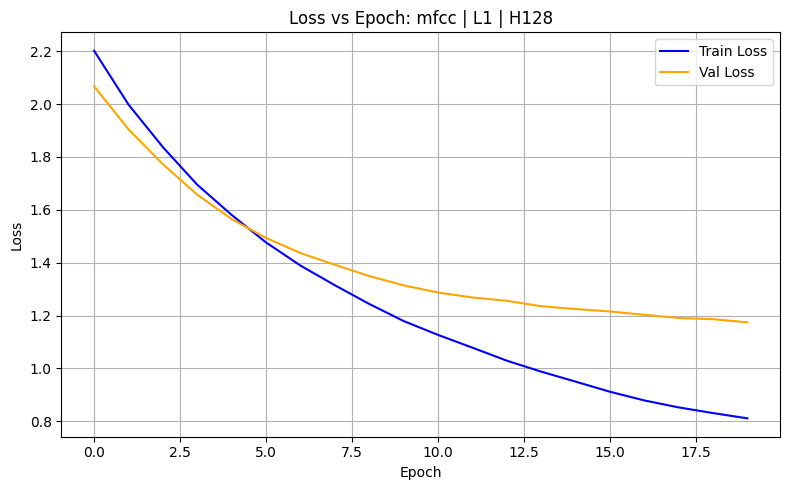

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

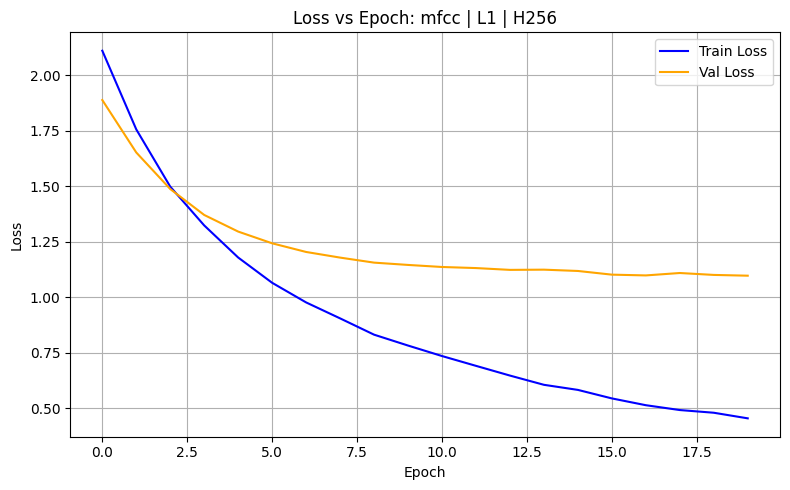

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

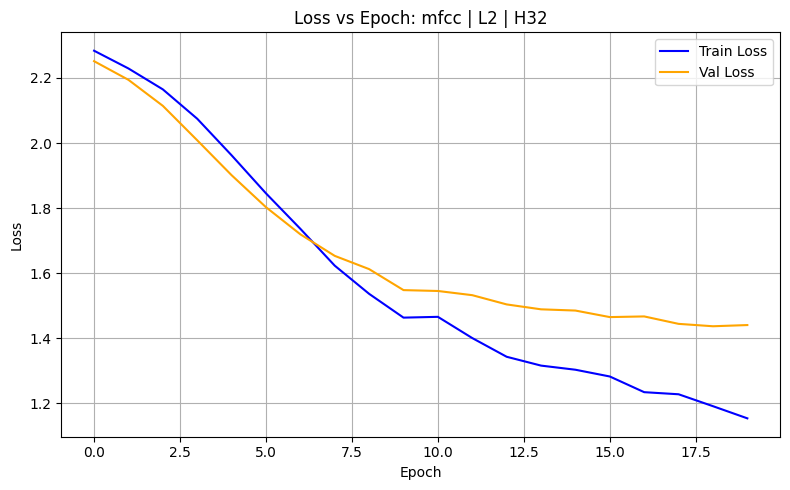

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

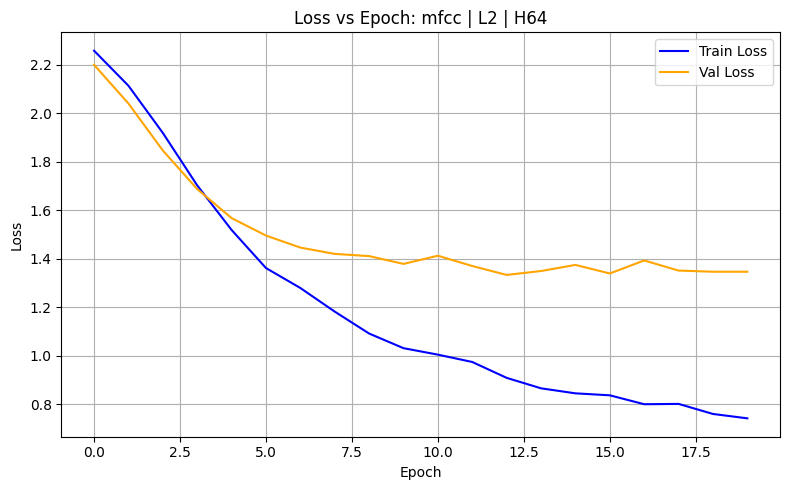

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

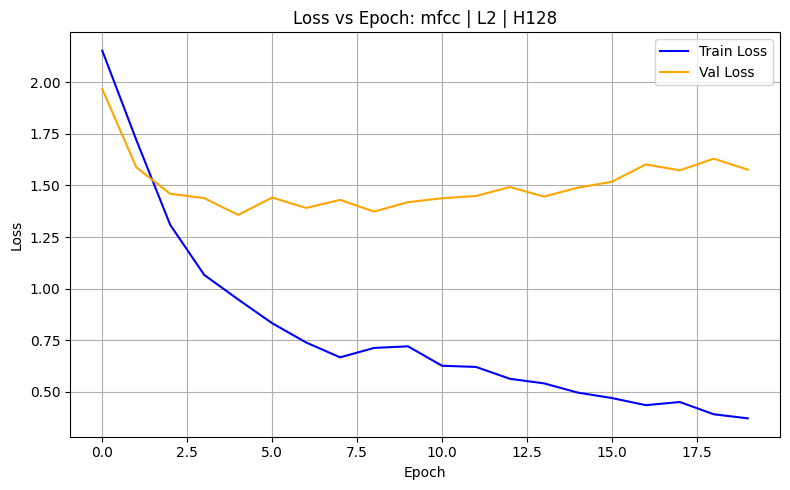

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

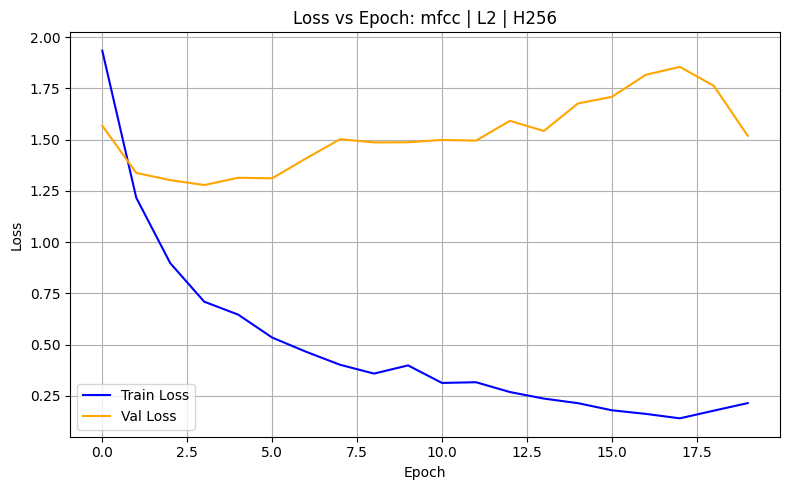

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

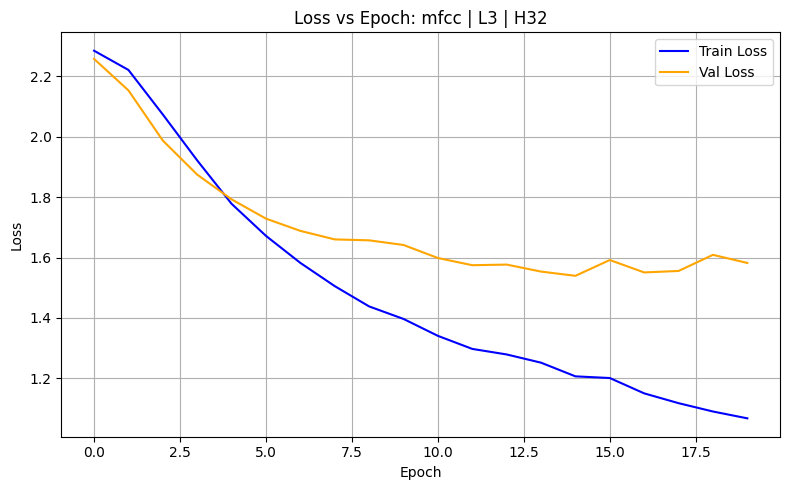

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

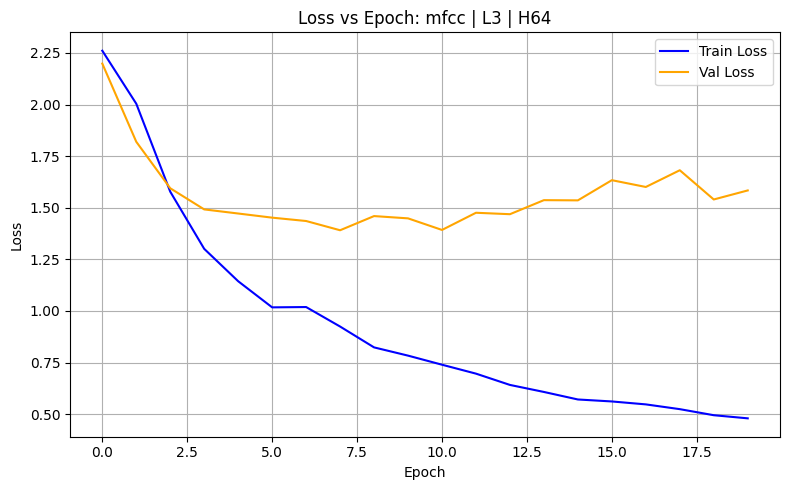

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

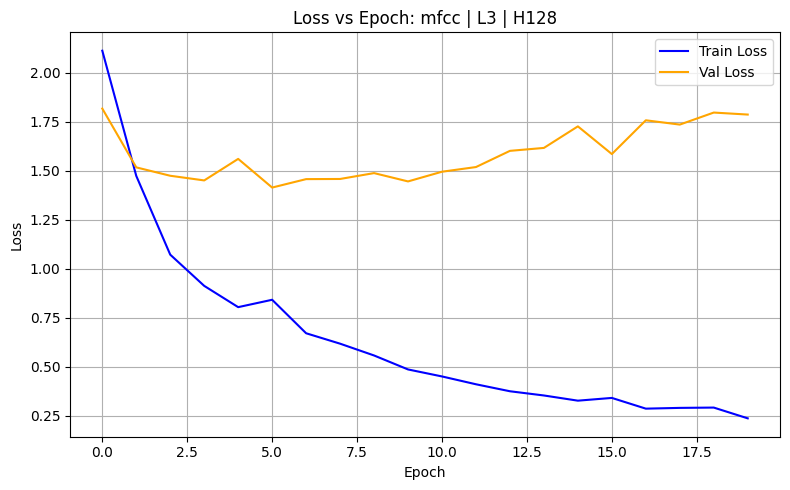

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

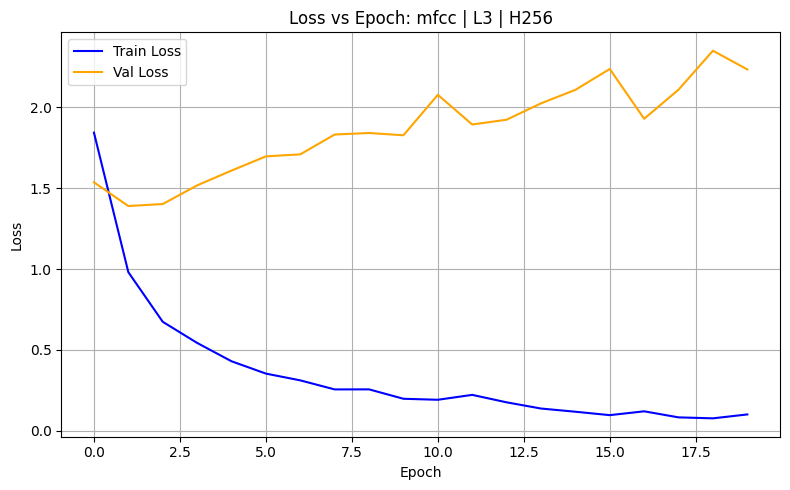

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

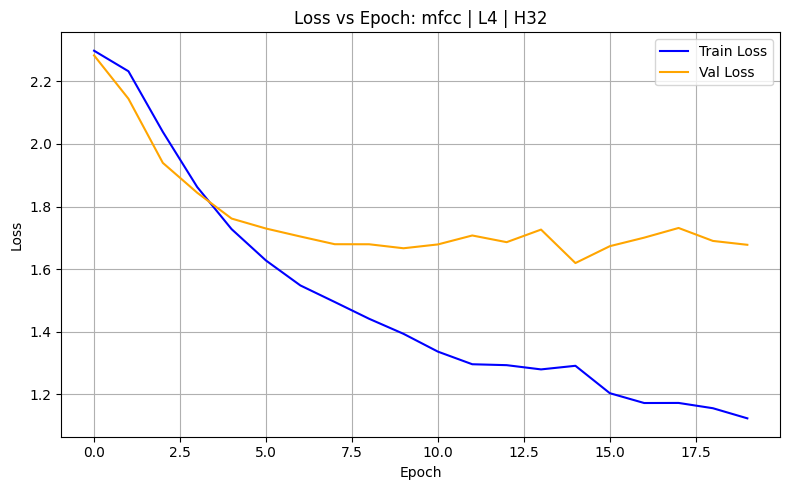

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

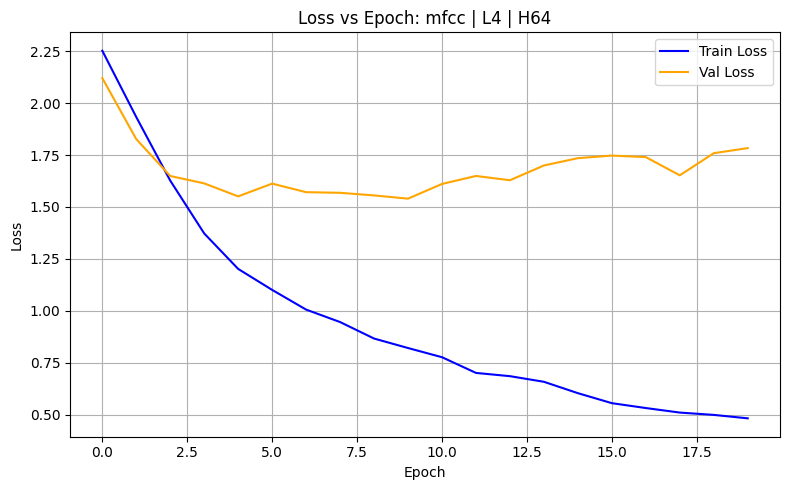

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

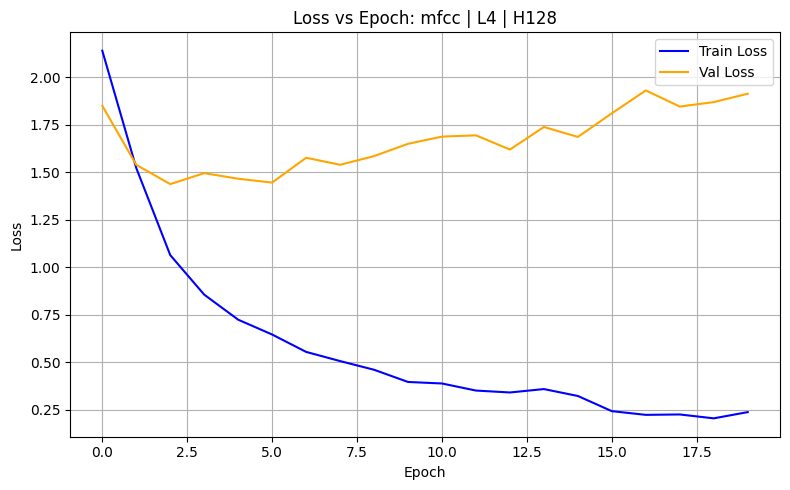

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

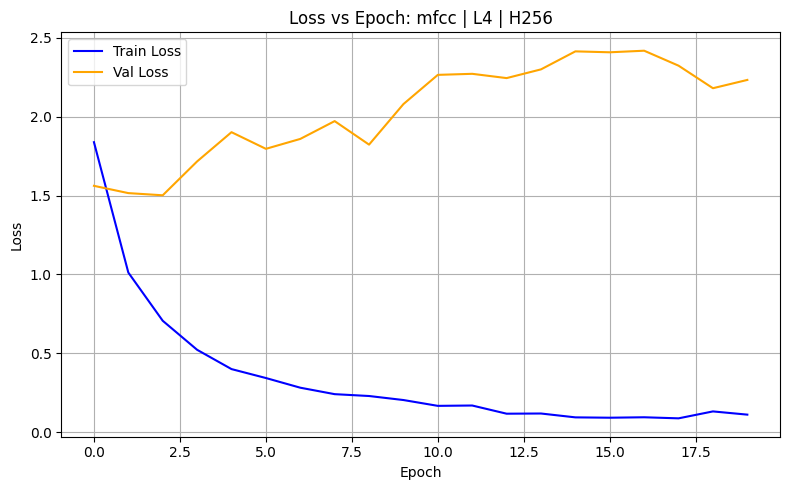

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

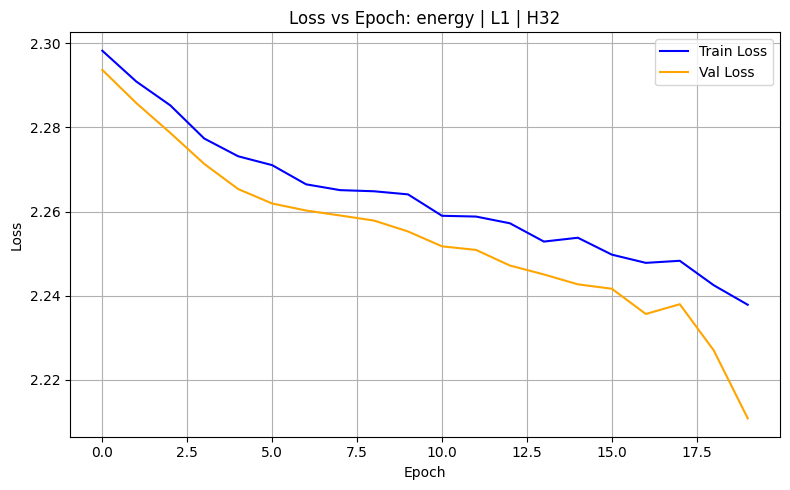

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

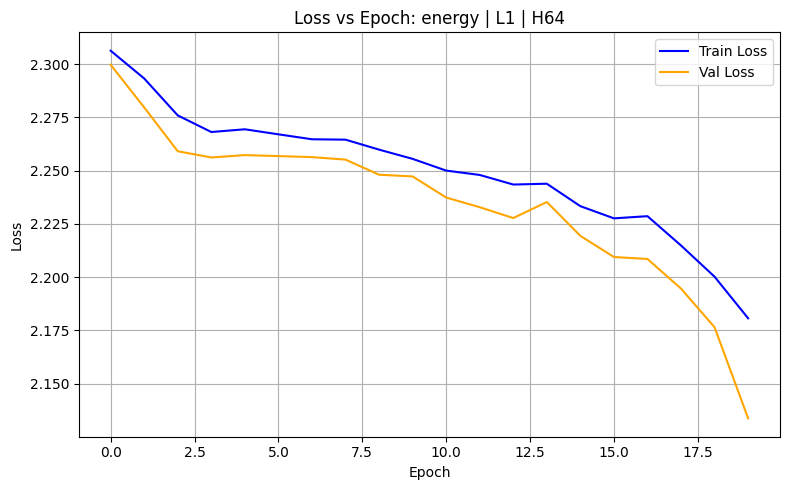

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

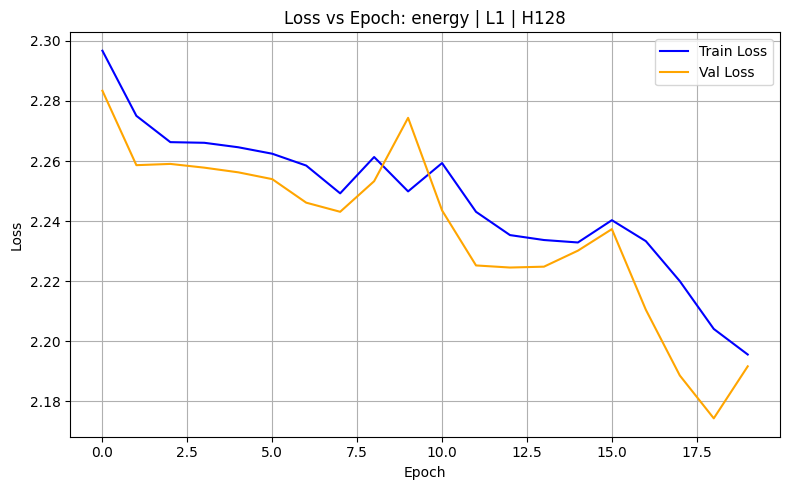

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

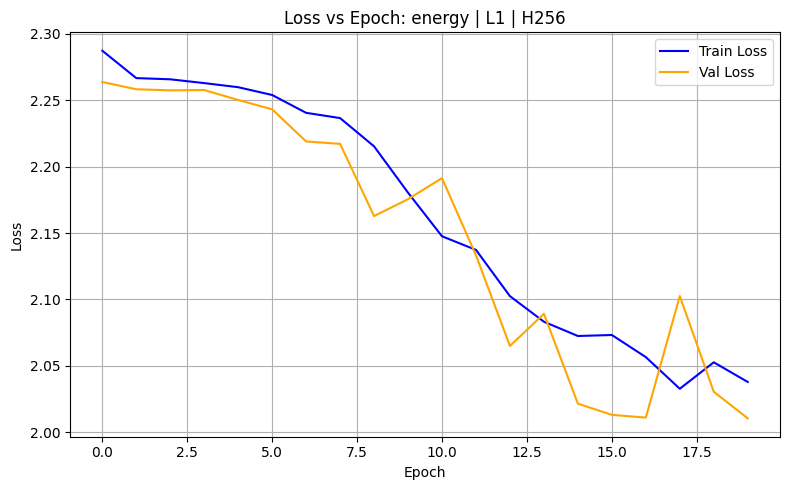

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

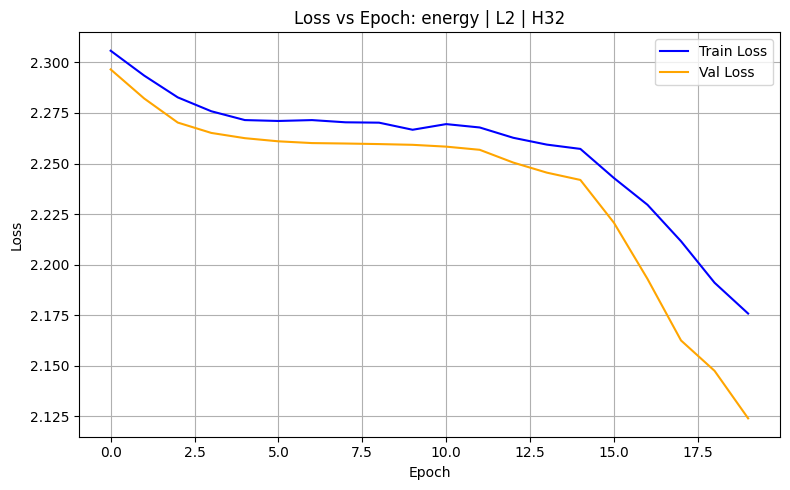

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

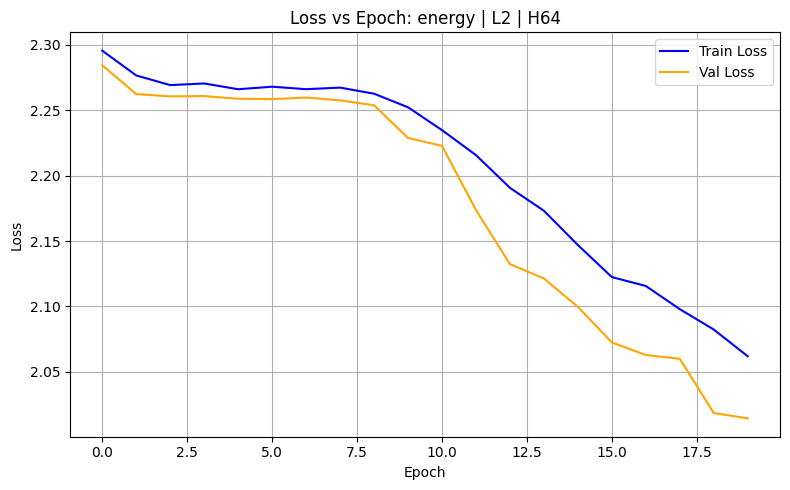

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

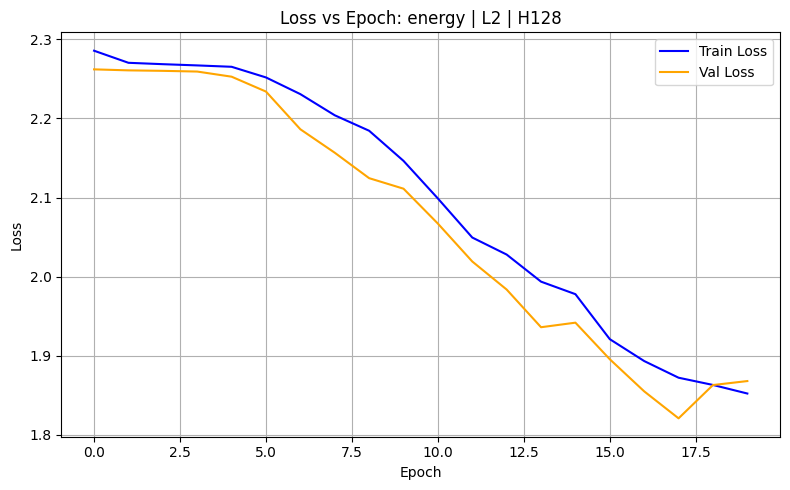

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

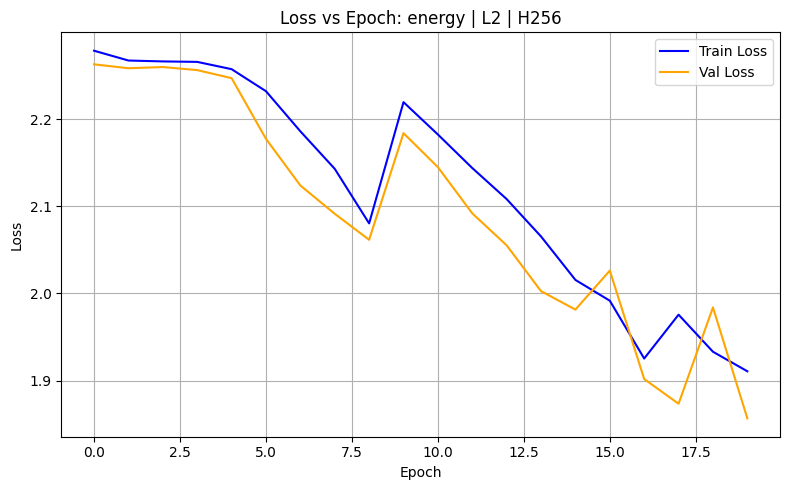

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

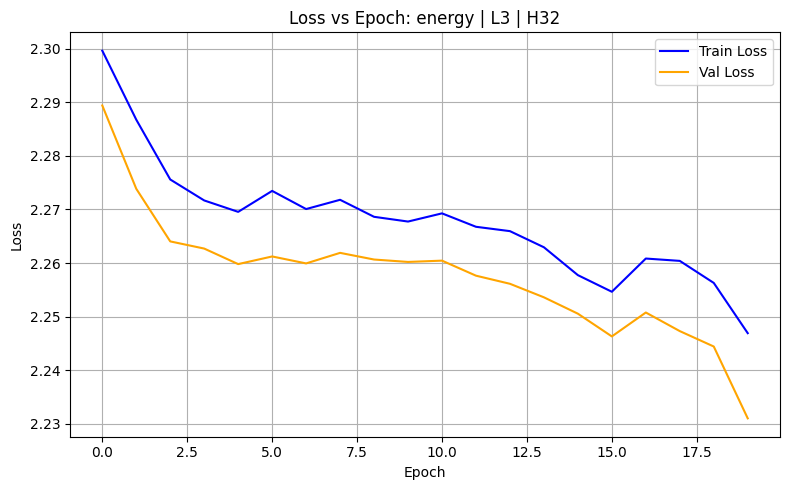

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

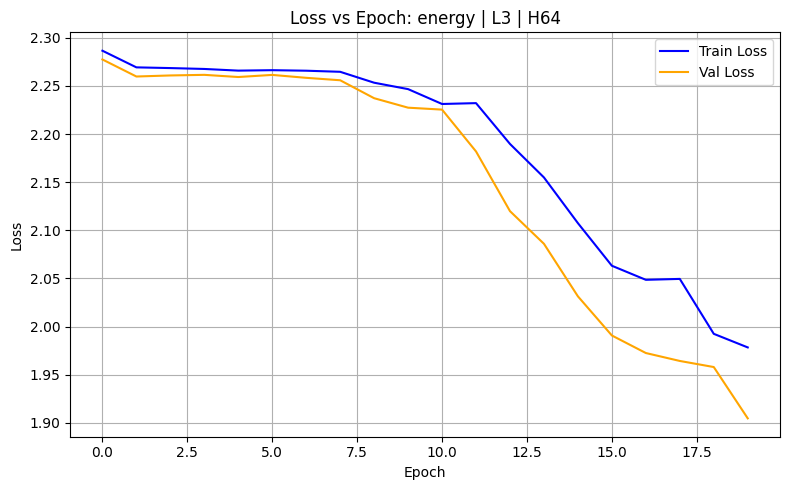

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

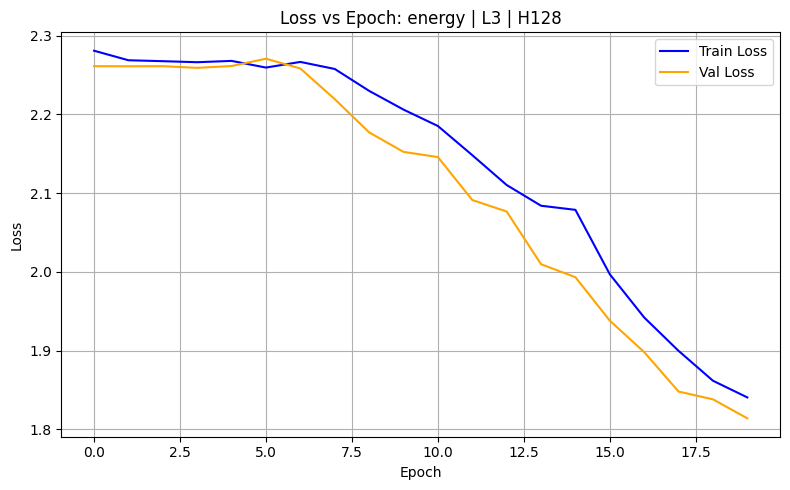

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

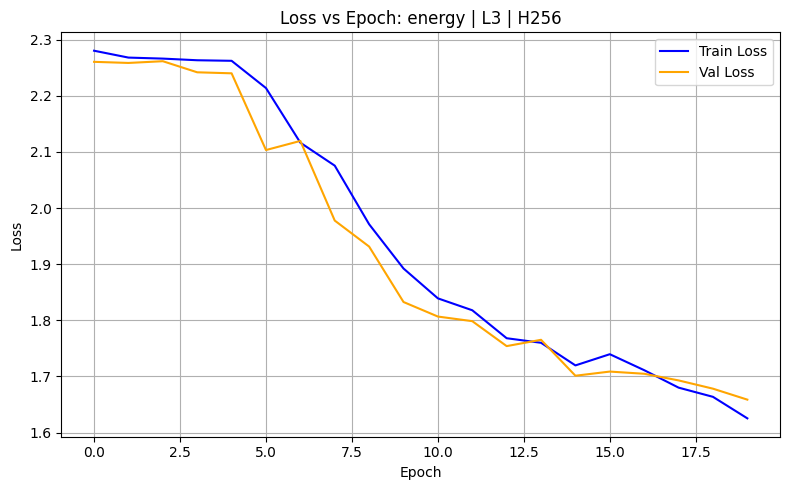

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

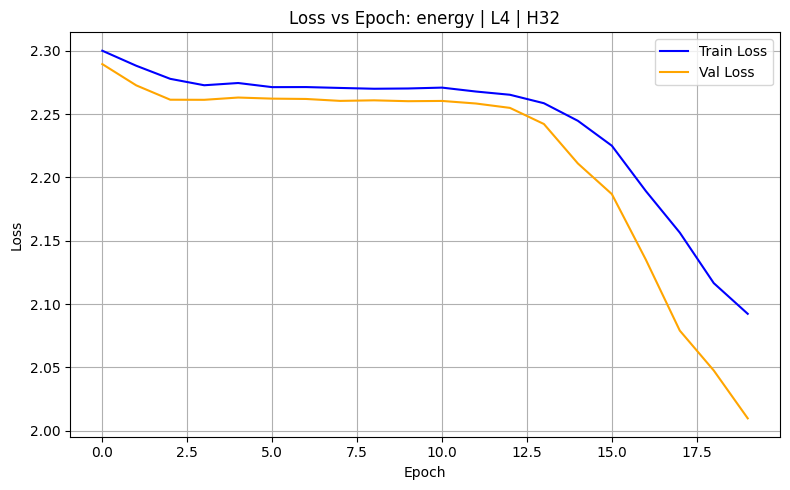

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

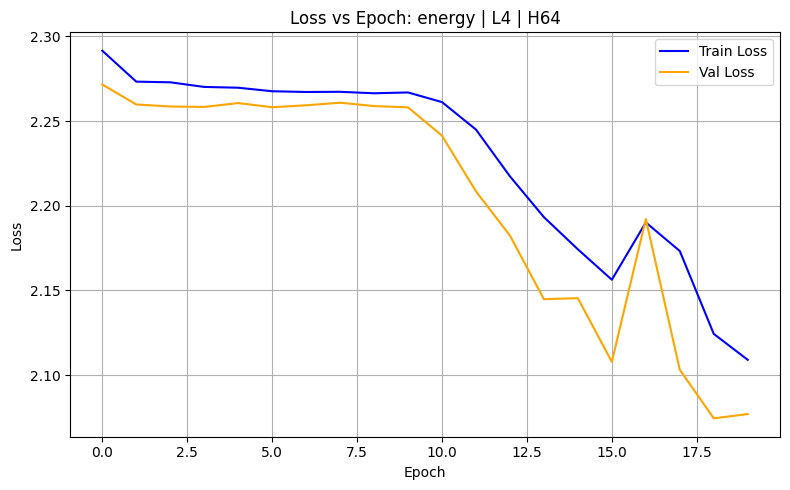

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

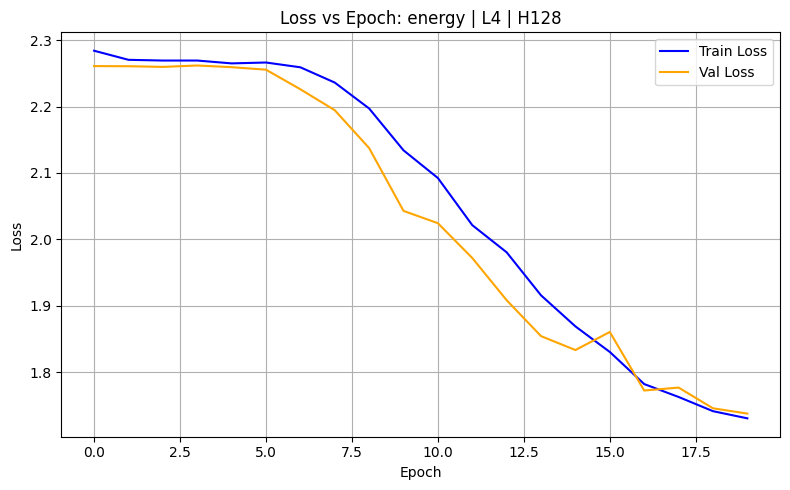

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

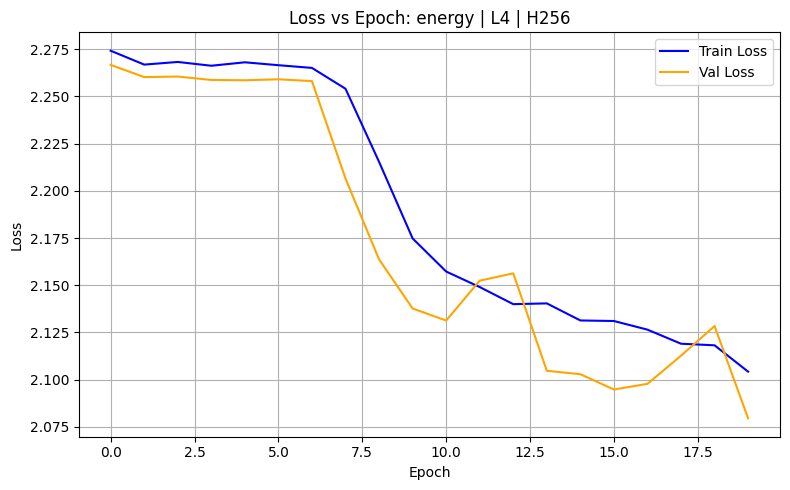

In [32]:
df = pd.DataFrame(results_lstm)
df['Config'] = df.apply(lambda row: f"{row['Feature']} | L{row['Num_Layers']} | H{row['Hidden_Size']}", axis=1)

unique_configs = df['Config'].unique()

for config in unique_configs:
    df_config = df[df['Config'] == config]

    plt.figure(figsize=(8, 5))
    sns.lineplot(data=df_config, x='Epoch', y='Train_Loss', label='Train Loss', color='blue')
    sns.lineplot(data=df_config, x='Epoch', y='Val_Loss', label='Val Loss', color='orange')

    plt.title(f"Loss vs Epoch: {config}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.tight_layout()
    plt.grid(True)
    plt.show()


=== Feature: log_mel, Layers: 1, Hidden size: 256 ===

Test Loss: 1.1663
Test Accuracy: 64.37%
F1 Score: 0.6736


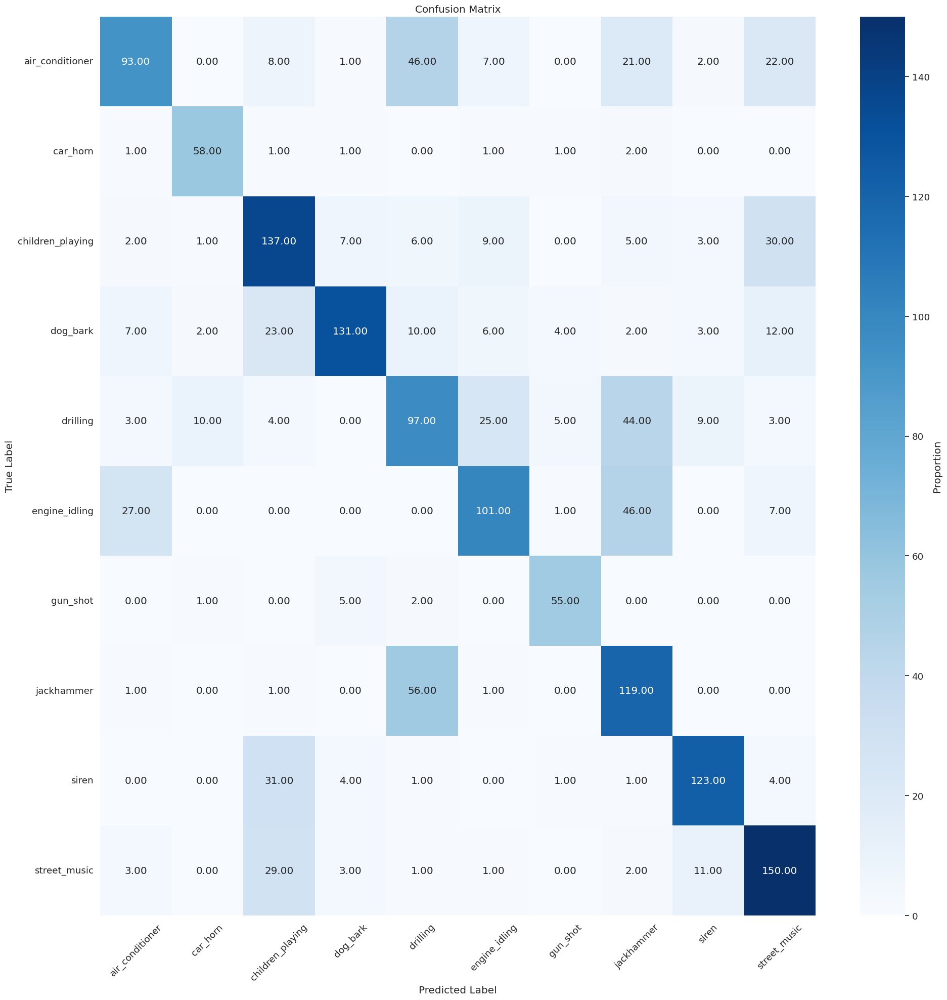

In [35]:
from torch.utils.data import TensorDataset, DataLoader

print(f"\n=== Feature: log_mel, Layers: 1, Hidden size: 256 ===")
X_test_np = np.stack([x['log_mel'] for x in test_features])
X_test_np = np.transpose(X_test_np, (0, 2, 1))
X_test = torch.tensor(X_test_np, dtype=torch.float32)

y_test = torch.tensor(test_labels_idx, dtype=torch.long)
test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size = 60, shuffle = False)  

model = SoundClassifierLSTM(
        input_size = X_test.shape[2],
        hidden_size = 256,
        num_layers = 1
        ).to(device)
model_filename = f"saved_models/lstm_model_log_mel_L1_H256.pth"
model.load_state_dict(torch.load(model_filename))

model.eval()
test_loss = 0
correct = 0
total = 0
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
avg_test_loss = test_loss / total
test_accuracy = 100. * correct / total
print(f"\nTest Loss: {avg_test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.2f}%")       
f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1 Score: {f1:.4f}")

cm = confusion_matrix(y_true, y_pred)
labels = list(class_to_index.keys())
plt.figure(figsize=(20, 20))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=labels, yticklabels=labels,
            cbar_kws={'label': 'Proportion'})

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


=== Feature: mfcc, Layers: 1, Hidden size: 256 ===

Test Loss: 1.2823
Test Accuracy: 59.17%
F1 Score: 0.5854


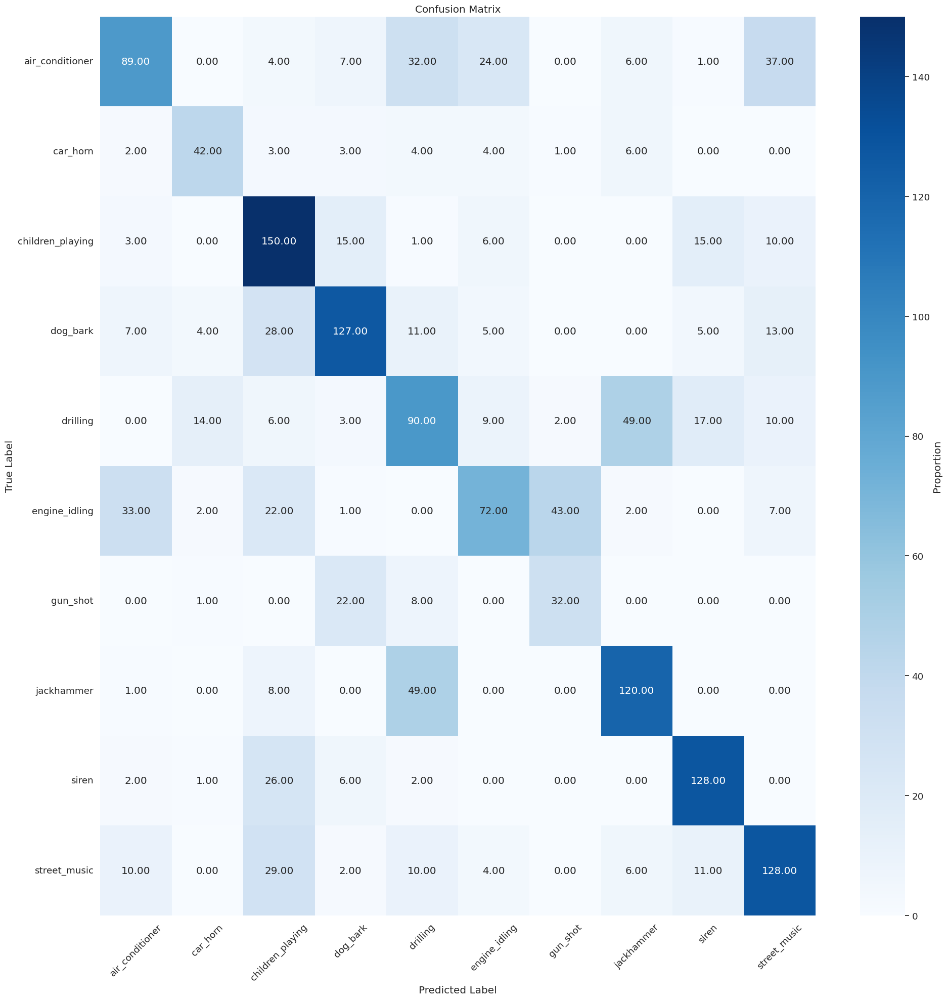

In [38]:
from torch.utils.data import TensorDataset, DataLoader

print(f"\n=== Feature: mfcc, Layers: 1, Hidden size: 256 ===")
X_test_np = np.stack([x['mfcc'] for x in test_features])
X_test_np = np.transpose(X_test_np, (0, 2, 1))
X_test = torch.tensor(X_test_np, dtype=torch.float32)

y_test = torch.tensor(test_labels_idx, dtype=torch.long)
test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size = 60, shuffle = False)  

model = SoundClassifierLSTM(
        input_size = X_test.shape[2],
        hidden_size = 256,
        num_layers = 1
        ).to(device)
model_filename = f"saved_models/lstm_model_mfcc_L1_H256.pth"
model.load_state_dict(torch.load(model_filename))

model.eval()
test_loss = 0
correct = 0
total = 0
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
avg_test_loss = test_loss / total
test_accuracy = 100. * correct / total
print(f"\nTest Loss: {avg_test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.2f}%")       
f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1 Score: {f1:.4f}")

cm = confusion_matrix(y_true, y_pred)
labels = list(class_to_index.keys())
plt.figure(figsize=(20, 20))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=labels, yticklabels=labels,
            cbar_kws={'label': 'Proportion'})

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


=== Feature: energy, Layers: 4, Hidden size: 128 ===

Test Loss: 1.7675
Test Accuracy: 34.24%
F1 Score: 0.3174


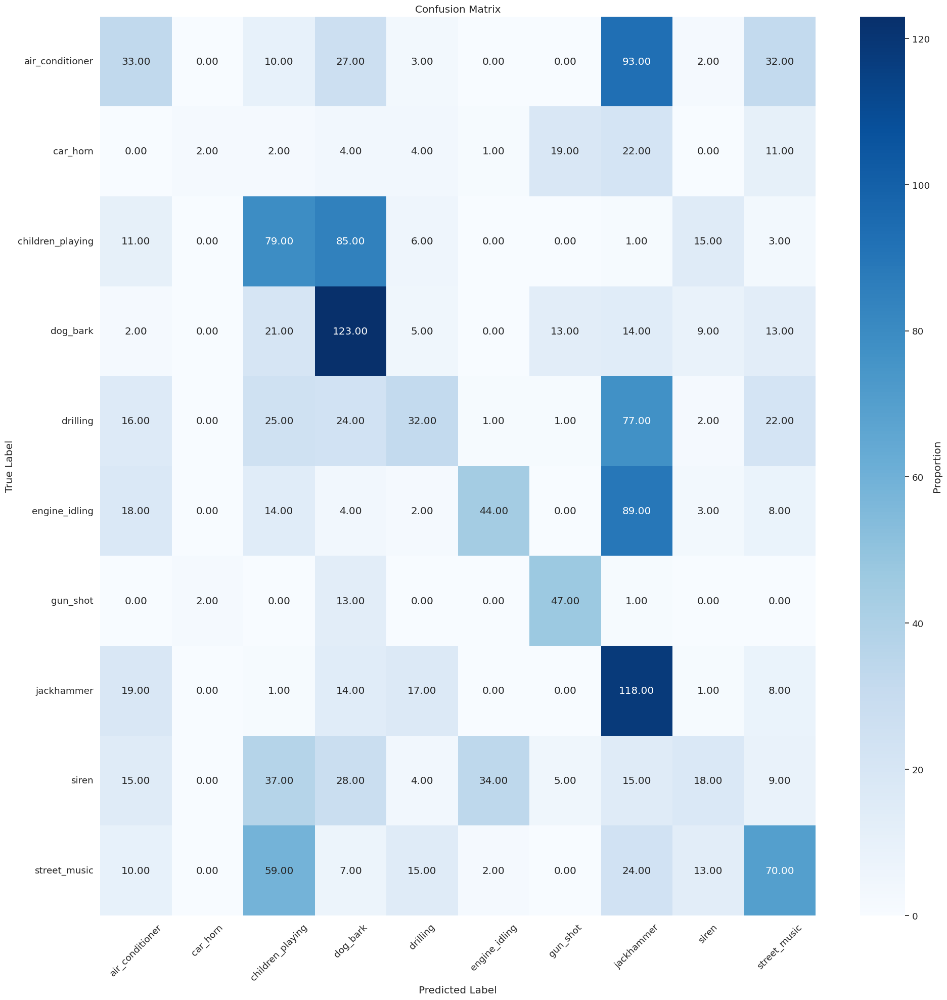

In [41]:
from torch.utils.data import TensorDataset, DataLoader

print(f"\n=== Feature: energy, Layers: 4, Hidden size: 128 ===")
X_test_np = np.stack([x['energy'] for x in test_features])
X_test_np = np.transpose(X_test_np, (0, 2, 1))
X_test = torch.tensor(X_test_np, dtype=torch.float32)

y_test = torch.tensor(test_labels_idx, dtype=torch.long)
test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size = 60, shuffle = False)  

model = SoundClassifierLSTM(
        input_size = X_test.shape[2],
        hidden_size = 128,
        num_layers = 4
        ).to(device)
model_filename = f"saved_models/lstm_model_energy_L4_H128.pth"
model.load_state_dict(torch.load(model_filename))

model.eval()
test_loss = 0
correct = 0
total = 0
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
avg_test_loss = test_loss / total
test_accuracy = 100. * correct / total
print(f"\nTest Loss: {avg_test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.2f}%")       
f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1 Score: {f1:.4f}")

cm = confusion_matrix(y_true, y_pred)
labels = list(class_to_index.keys())
plt.figure(figsize=(20, 20))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=labels, yticklabels=labels,
            cbar_kws={'label': 'Proportion'})

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### 2.2 Transformer Model

In [15]:
import torch
import torch.nn as nn
import math

class PositionalEncoding(nn.Module):
    def __init__(self, d_model: int, dropout: float, seq_len: int = 5000):
        super().__init__()
        self.d_model = d_model
        self.seq_len = seq_len
        self.dropout = nn.Dropout(dropout)

        pe = torch.zeros(seq_len, d_model)
        position = torch.arange(0, seq_len, dtype=torch.float).unsqueeze(1) #unsqueeze for broadcasting
        div_term = 10000.0 ** (torch.arange(2, d_model + 2, 2).float() / (d_model))
        pe[:, 0::2] = torch.sin(position / div_term)
        pe[:, 1::2] = torch.cos(position / div_term)
        pe = pe.unsqueeze(0)  # (1, seq_len, d_model) we do that for broadcasting
        self.register_buffer("pe", pe)

    def forward(self, x):
        x = x + (self.pe[:, : x.shape[1], :]).requires_grad_(False) # positional embedding is fixed no gradient required
        return self.dropout(x)


class LayerNormalization(nn.Module):
    def __init__(self, eps: float = 10**-6) -> None:
        super().__init__()
        self.eps = eps

    def forward(self, x):
        # x: (batch, seq_len, hidden_size)
        mean = x.mean(dim=-1, keepdim=True)
        std = x.std(dim=-1, keepdim=True)
        return (x - mean) / (std + self.eps)


class FeedForwardBlock(nn.Module):
    def __init__(self, d_model: int, d_ff: int, dropout: float):
        super().__init__()
        self.linear_1 = nn.Linear(d_model, d_ff)  # W1 and B1
        self.dropout = nn.Dropout(dropout)
        self.linear_2 = nn.Linear(d_ff, d_model)  # W2 and B2

    def forward(self, x):
        return self.linear_2(self.dropout(torch.relu(self.linear_1(x))))


class MultiHeadAttentionBlock(nn.Module):
    def __init__(self, d_model: int, h: int, dropout: float):
        super().__init__()
        self.d_model = d_model
        self.h = h
        assert d_model % h == 0, "d_model is not divisible by h"

        self.d_k = d_model // h
        self.w_q = nn.Linear(d_model, d_model, bias=False) 
        self.w_k = nn.Linear(d_model, d_model, bias=False) 
        self.w_v = nn.Linear(d_model, d_model, bias=False) 
        self.w_o = nn.Linear(d_model, d_model, bias=False) 

        self.dropout = nn.Dropout(dropout)

    @staticmethod
    def attention(query, key, value, dropout: nn.Dropout):
        d_k = query.shape[-1]

        attention_scores = (query @ key.transpose(-2, -1)) / math.sqrt(d_k)

        attention_scores = attention_scores.softmax(dim=-1)
        if dropout is not None:
            attention_scores = dropout(attention_scores)

        return (attention_scores @ value)

    def forward(self, q, k, v):
        query = self.w_q(q)
        key = self.w_k(k)
        value = self.w_v(v)

        # query, key, value: [batch_size, num_heads, seq_len, d_k]
        query = query.view(query.shape[0], query.shape[1], self.h, self.d_k).transpose(1, 2)
        key = key.view(key.shape[0], key.shape[1], self.h, self.d_k).transpose(1, 2)
        value = value.view(value.shape[0], value.shape[1], self.h, self.d_k).transpose(1, 2)

        x = MultiHeadAttentionBlock.attention(
            query, key, value, self.dropout
        )

        x = x.transpose(1, 2).contiguous().view(x.shape[0], -1, self.h * self.d_k) # x: [batch_size, seq_len, d_k * num_heads]
        return self.w_o(x)


class ResidualConnection(nn.Module):
    def __init__(self, dropout: float):
        super().__init__()
        self.dropout = nn.Dropout(dropout)
        self.norm = LayerNormalization()

    def forward(self, x, sublayer):
        return x + self.dropout(self.norm(sublayer(x)))


class EncoderBlock(nn.Module):
    def __init__(
        self,
        self_attention_block: MultiHeadAttentionBlock,
        feed_froward_block: FeedForwardBlock,
        dropout: float,
    ):
        super().__init__()
        self.self_attention_block = self_attention_block
        self.feed_forward_block = feed_froward_block
        self.residual_connection = nn.ModuleList(
            [ResidualConnection(dropout) for _ in range(2)]
        )

    def forward(self, x):
        x = self.residual_connection[0](
            x, lambda x: self.self_attention_block(x, x, x)
        )
        x = self.residual_connection[1](x, self.feed_forward_block)
        return x


class Encoder(nn.Module):
    def __init__(self, layers: nn.ModuleList):
        super().__init__()
        self.layers = layers
        self.norm = LayerNormalization()

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return self.norm(x)

In [16]:
import torch
import torch.nn as nn

class TransformerClassifier(nn.Module):
    def __init__(
        self, input_dim, model_dim, num_classes, num_heads=4, num_layers=2, dropout=0.1, d_ff = 2048
    ):
        super().__init__()
        self.input_proj = nn.Linear(input_dim, model_dim)
        self.pos_encoder = PositionalEncoding(model_dim, dropout=dropout)

        encoder_blocks = []
        for _ in range(num_layers):
            encoder_self_attention_block = MultiHeadAttentionBlock(
                model_dim, num_heads, dropout
            )
            fead_forward_block = FeedForwardBlock(model_dim, d_ff, dropout=dropout)
            encoder_block = EncoderBlock(
                encoder_self_attention_block, fead_forward_block, dropout
            )
            encoder_blocks.append(encoder_block)
        self.encoder = Encoder(nn.ModuleList(encoder_blocks))

        self.pool = nn.AdaptiveAvgPool1d(1)
        self.classifier = nn.Linear(model_dim, num_classes)

    def forward(self, x):
        # x: [batch_size, seq_len, input_dim]
        x = self.input_proj(x)  # [B, T, D]
        x = self.pos_encoder(x)  # [B, T, D]
        x = self.encoder(x)  # [B, T, D]
        x = x.transpose(1, 2)  # [B, D, T]
        x = self.pool(x).squeeze(-1)  # [B, D]
        return self.classifier(x)  # [B, num_classes]

In [17]:

label_to_index = {
    'air_conditioner': 0,
    'car_horn': 1,
    'children_playing': 2,
    'dog_bark': 3,
    'drilling': 4,
    'engine_idling': 5,
    'gun_shot': 6,
    'jackhammer': 7,
    'siren': 8,
    'street_music': 9
}

class DataFeatureSplitter():
    def __init__(self, data, labels, label_to_index):
        self.data = data
        self.labels = labels
        self._convert_labels_to_index(label_to_index)

    def feature_splitter(self, feature_name):
        n = len(self.data)
        X, y = [], []
        for i in range(n):
            X.append(self.data[i][feature_name])
            y.append(self.labels[i])
        return np.array(X), np.array(y)

    def _convert_labels_to_index(self, label_to_index):
        index_labels = []
        for i in range(len(self.labels)):
            index_labels.append(label_to_index[self.labels[i]])
        self.labels = np.array(index_labels)

train_splitter = DataFeatureSplitter(train_features, train_labels, label_to_index)
X_train_mfcc, y_train_mfcc = train_splitter.feature_splitter('mfcc')
X_train_log_mel, y_train_log_mel = train_splitter.feature_splitter('log_mel')
X_train_energy, y_train_energy = train_splitter.feature_splitter('energy')

val_splitter = DataFeatureSplitter(val_features, val_labels, label_to_index)
X_val_mfcc, y_val_mfcc = val_splitter.feature_splitter('mfcc')
X_val_log_mel, y_val_log_mel = val_splitter.feature_splitter('log_mel')
X_val_energy, y_val_energy = val_splitter.feature_splitter('energy')

test_splitter = DataFeatureSplitter(test_features, test_labels, label_to_index)
X_test_mfcc, y_test_mfcc = test_splitter.feature_splitter('mfcc')
X_test_log_mel, y_test_log_mel = test_splitter.feature_splitter('log_mel')
X_test_energy, y_test_energy = test_splitter.feature_splitter('energy')

In [18]:
X_train_mfcc = np.transpose(X_train_mfcc, (0, 2, 1))
X_val_mfcc = np.transpose(X_val_mfcc, (0, 2, 1))
X_test_mfcc = np.transpose(X_test_mfcc, (0, 2, 1))

X_train_log_mel = np.transpose(X_train_log_mel, (0, 2, 1))
X_val_log_mel = np.transpose(X_val_log_mel, (0, 2, 1))
X_test_log_mel = np.transpose(X_test_log_mel, (0, 2, 1))

X_train_energy = np.transpose(X_train_energy, (0, 2, 1))
X_val_energy = np.transpose(X_val_energy, (0, 2, 1))
X_test_energy = np.transpose(X_test_energy, (0, 2, 1))

In [19]:
from torch.utils.data import Dataset, DataLoader

class SoundDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def train(model, loader, optimizer, criterion):
        model.train()
        running_loss = 0
        correct = 0
        total = 0

        for X, y in loader:
            X, y = X.to(device), y.to(device)

            optimizer.zero_grad()
            outputs = model(X)
            loss = criterion(outputs, y)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * X.size(0)
            _, predicted = outputs.max(1)
            correct += predicted.eq(y).sum().item()
            total += y.size(0)

        return running_loss / total, correct / total

def evaluate(model, loader):
    model.eval()
    correct = 0
    total = 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for X, y in loader:
            X, y = X.to(device), y.to(device)
            outputs = model(X)
            _, predicted = outputs.max(1)

            correct += predicted.eq(y).sum().item()
            total += y.size(0)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(y.cpu().numpy())

    accuracy = correct / total
    return accuracy, all_preds, all_labels

In [21]:
import torch.nn as nn
import torch.optim as optim
from itertools import product

num_epochs = 15

hyperparameter_space = {
    "learning_rate": [1e-3],
    "dropout": [0.3, 0.1],
    "number_of_heads": [4, 8],
    "number_of_layers": [3, 6],
    "d_ff":[2048],
    'model_dim': [128, 256]
}

keys = list(hyperparameter_space.keys())
values = list(hyperparameter_space.values())


feature_sets = {
    "mfcc": {
        "train": (X_train_mfcc, y_train_mfcc),
        "val": (X_val_mfcc, y_val_mfcc),
        "test": (X_test_mfcc, y_test_mfcc),
        "feature_dim": 20,
    },
    "energy": {
        "train": (X_train_energy, y_train_energy),
        "val": (X_val_energy, y_val_energy),
        "test": (X_test_energy, y_test_energy),
        "feature_dim": 1,
    },
    "log_mel": {
        "train": (X_train_log_mel, y_train_log_mel),
        "val": (X_val_log_mel, y_val_log_mel),
        "test": (X_test_log_mel, y_test_log_mel),
        "feature_dim": 64,
    },
}

results = {
    "mfcc": {"best_model": None, "best_val_acc": 0, "best_config": None, "test_loader": None},
    "energy": {"best_model": None, "best_val_acc": 0, "best_config": None, "test_loader": None},
    "log_mel": {"best_model": None, "best_val_acc": 0, "best_config": None, "test_loader": None},
}


for feature_name, splits in feature_sets.items():
    print(f"\n=== Using feature set: {feature_name.upper()} ===")
    print(
        f"{'Trial':<5} {'LR':<8} {'Dropout':<8} {'Heads':<6} {'Layers':<7} {'TrainLoss':<10} {'TrainAcc':<10} {'ValAcc':<10}"
    )
    print("-" * 70)

    X_train, y_train = splits["train"]
    X_val, y_val = splits["val"]
    X_test, y_test = splits["test"]

    feature_dim = splits["feature_dim"]
    train_dataset = SoundDataset(X_train, y_train)
    val_dataset = SoundDataset(X_val, y_val)
    test_dataset = SoundDataset(X_test, y_test)

    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=64)
    test_loader = DataLoader(test_dataset, batch_size=64)
    results[feature_name]['test_loader'] = test_loader

    for i, combo in enumerate(product(*values)):
        config = dict(zip(keys, combo))
        model = TransformerClassifier(
            input_dim=feature_dim,
            model_dim=config['model_dim'],
            num_classes=10,
            num_heads=config["number_of_heads"],
            num_layers=config["number_of_layers"],
            dropout=config["dropout"],
            d_ff=config['d_ff']
        ).to(device)

        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=config["learning_rate"])

        for epoch in range(num_epochs):
            train_loss, train_acc = train(model, train_loader, optimizer, criterion)
            val_acc, _, _ = evaluate(model, val_loader)

        if val_acc > results[feature_name]["best_val_acc"]:
            results[feature_name]["best_model"] = model
            results[feature_name]["best_val_acc"] = val_acc
            results[feature_name]["best_config"] = config
        print(
            f"{i+1:<5} {config['learning_rate']:<8} {config['dropout']:<8} {config['number_of_heads']:<6} {config['number_of_layers']:<7} {train_loss:<10.4f} {train_acc:<10.4f} {val_acc:<10.4f}"
        )


=== Using feature set: MFCC ===
Trial LR       Dropout  Heads  Layers  TrainLoss  TrainAcc   ValAcc    
----------------------------------------------------------------------
1     0.001    0.3      4      3       0.1397     0.9649     0.6332    
2     0.001    0.3      4      3       0.3865     0.8881     0.6174    
3     0.001    0.3      4      6       0.2443     0.9336     0.6314    
4     0.001    0.3      4      6       0.4712     0.8627     0.6350    
5     0.001    0.3      8      3       0.1178     0.9696     0.6119    
6     0.001    0.3      8      3       0.2274     0.9380     0.6624    
7     0.001    0.3      8      6       0.1964     0.9450     0.6569    
8     0.001    0.3      8      6       0.3695     0.8925     0.6533    
9     0.001    0.1      4      3       0.0985     0.9733     0.6527    
10    0.001    0.1      4      3       0.1464     0.9599     0.6283    
11    0.001    0.1      4      6       0.0954     0.9776     0.6740    
12    0.001    0.1      4      6


FINAL TEST RESULTS FOR EACH FEATURE SET

Feature Set: MFCC
Test Accuracy: 0.6461
F1 Score (macro): 0.6520
Best Hyperparameter Configuration:
learning_rate       : 0.001
dropout             : 0.1
number_of_heads     : 4
number_of_layers    : 6
d_ff                : 2048
model_dim           : 128


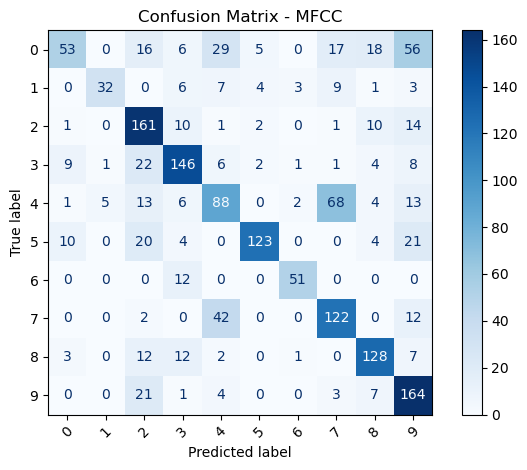


Feature Set: ENERGY
Test Accuracy: 0.3563
F1 Score (macro): 0.3161
Best Hyperparameter Configuration:
learning_rate       : 0.001
dropout             : 0.1
number_of_heads     : 4
number_of_layers    : 3
d_ff                : 2048
model_dim           : 128


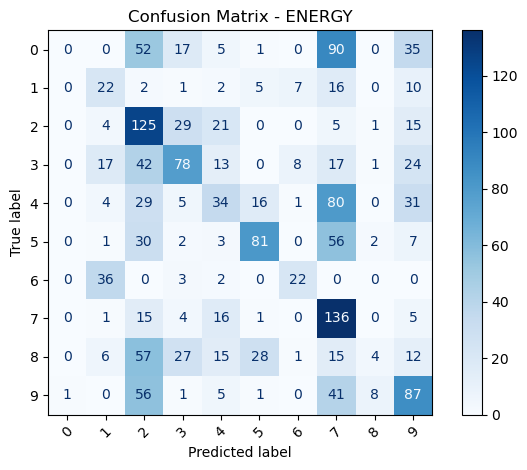


Feature Set: LOG_MEL
Test Accuracy: 0.6642
F1 Score (macro): 0.6919
Best Hyperparameter Configuration:
learning_rate       : 0.001
dropout             : 0.1
number_of_heads     : 8
number_of_layers    : 3
d_ff                : 2048
model_dim           : 256


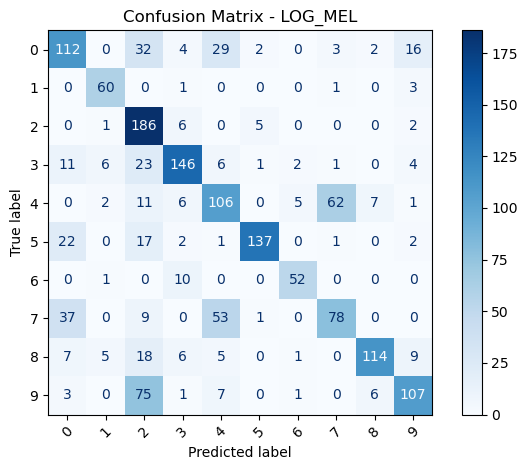

In [23]:
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

print("\n" + "=" * 60)
print("FINAL TEST RESULTS FOR EACH FEATURE SET")
print("=" * 60)

for feature_name, result in results.items():
    print(f"\nFeature Set: {feature_name.upper()}")

    best_model = result['best_model']
    test_loader = result['test_loader']
    best_config = result['best_config']

    if best_model is None or test_loader is None:
        print("No model or test loader found. Skipping...")
        continue

    # Evaluate on test set
    test_acc, test_preds, test_labels = evaluate(best_model, test_loader)
    f1 = f1_score(test_labels, test_preds, average="macro")

    print(f"Test Accuracy: {test_acc:.4f}")
    print(f"F1 Score (macro): {f1:.4f}")
    print("Best Hyperparameter Configuration:")
    for key, value in best_config.items():
        print(f"{key:<20}: {value}")

    # Confusion Matrix
    cm = confusion_matrix(test_labels, test_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap="Blues", xticks_rotation=45)
    plt.title(f"Confusion Matrix - {feature_name.upper()}")
    plt.tight_layout()
    plt.show()

## 3. Comparison

| Model              | Feature | Test Accuracy | F1 Score | Confusing Class  |
|-------------------|---------|---------------|----------|------------------|
| **RNN (Using nn.RNN)** | Energy  | 0.4934        | 0.5071   | Jackhammer       |
|                   | MEL     | 0.66          | 0.6964   | Air conditioner  |
|                   | MFCCS   | 0.5941        | 0.6002   | Air conditioner  |
| **Transformer**   | Energy  | 0.3563        | 0.3161   | Drilling         |
|                   | MEL     | 0.6642        | 0.6919   | Jack hammer      |
|                   | MFCCS   | 0.6461        | 0.6520   | Air conditioner  |
| **CNN-LSTM**      | Energy  | 0.516         | 0.52     | Air conditioner  |
|                   | MEL     | 0.7695        | 0.77     | Air conditioner  |
|                   | MFCCS   | 0.6939        | 0.71     | Drilling         |


## 4. Bonus

### 4.1 Configurations

In [66]:
# tuning configurations
tune_config = {
    'batch_size': 32,
    'num_epochs': 40,
    'tuning_epochs': 15
}

In [67]:
# label encoding
label_encoder = LabelEncoder()
all_labels = np.concatenate([train_labels, val_labels, test_labels])
label_encoder.fit(all_labels)
num_classes = len(label_encoder.classes_)

### 4.2 CNN-LSTM Model

In [68]:
# model for the 2d features
class CNNLSTM2D(nn.Module):
    def __init__(self, num_classes=10, input_height=64, lstm_hidden=256, lstm_layers=2):
        super().__init__()
        # extractor layers
        self.cnn = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=(2, 2))
        )
        
        output_height = input_height // 8
        self.lstm_input_size = 128 * output_height
        
        # LSTM 
        self.lstm = nn.LSTM(
            input_size=self.lstm_input_size,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            bidirectional=True
        )
        
        # fc
        self.fc = nn.Sequential(
            nn.Linear(lstm_hidden * 2, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.cnn(x)
        x = x.permute(0, 3, 1, 2)
        B, T, C, H = x.size()
        x = x.reshape(B, T, C*H)
        x, _ = self.lstm(x)
        x = x[:, -1, :]
        return self.fc(x)


In [69]:
# for 1d features --> energy
class CNNLSTM1D(nn.Module):
    def __init__(self, num_classes=10, lstm_hidden=256, lstm_layers=2):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(1, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.MaxPool1d(2),
            
            nn.Conv1d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.MaxPool1d(2),
            
            nn.Conv1d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(2)
        )
        
        # LSTM 
        self.lstm = nn.LSTM(
            input_size=128,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            bidirectional=True
        )
        
        # fc
        self.fc = nn.Sequential(
            nn.Linear(lstm_hidden * 2, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.cnn(x)
        x = x.permute(0, 2, 1)
        x, _ = self.lstm(x)
        x = x[:, -1, :]
        return self.fc(x)

### 4.3 Training & Evaluation Functions

In [70]:
# dataset classes for creating dataset for each feature 
class FeatureDataset(Dataset):
    def __init__(self, features, labels, feature_type='log_mel'):
        self.features = features
        self.labels = labels
        self.feature_type = feature_type
        
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        if self.feature_type == 'log_mel':
            feat = self.features[idx]['log_mel']
            return torch.tensor(feat).unsqueeze(0).float(), label_encoder.transform([self.labels[idx]])[0]
        elif self.feature_type == 'energy':
            feat = self.features[idx]['energy'].squeeze()
            return torch.tensor(feat).float(), label_encoder.transform([self.labels[idx]])[0]
        elif self.feature_type == 'mfcc':
            feat = self.features[idx]['mfcc']
            return torch.tensor(feat).unsqueeze(0).float(), label_encoder.transform([self.labels[idx]])[0]

# creating datasets
train_log_mel = FeatureDataset(train_features, train_labels, 'log_mel')
val_log_mel = FeatureDataset(val_features, val_labels, 'log_mel')
test_log_mel = FeatureDataset(test_features, test_labels, 'log_mel')

train_energy = FeatureDataset(train_features, train_labels, 'energy')
val_energy = FeatureDataset(val_features, val_labels, 'energy')
test_energy = FeatureDataset(test_features, test_labels, 'energy')

train_mfcc = FeatureDataset(train_features, train_labels, 'mfcc')
val_mfcc = FeatureDataset(val_features, val_labels, 'mfcc')
test_mfcc = FeatureDataset(test_features, test_labels, 'mfcc')

In [71]:
def collate_2d(batch):
    inputs, labels = zip(*batch)
    inputs = torch.stack(inputs)
    labels = torch.tensor(labels)
    return inputs, labels

def collate_1d(batch):
    inputs, labels = zip(*batch)
    max_len = max(x.size(0) for x in inputs)
    padded = [F.pad(x, (0, max_len - x.size(0)), "constant", 0) for x in inputs]
    inputs = torch.stack(padded).unsqueeze(1)  # adding channel dimension
    labels = torch.tensor(labels)
    return inputs, labels

# dataloader
BATCH_SIZE = tune_config['batch_size']

# Mel
train_loader_log_mel = DataLoader(train_log_mel, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_2d)
val_loader_log_mel = DataLoader(val_log_mel, batch_size=BATCH_SIZE, collate_fn=collate_2d)
test_loader_log_mel = DataLoader(test_log_mel, batch_size=BATCH_SIZE, collate_fn=collate_2d)

# MFCC
train_loader_mfcc = DataLoader(train_mfcc, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_2d)
val_loader_mfcc = DataLoader(val_mfcc, batch_size=BATCH_SIZE, collate_fn=collate_2d)
test_loader_mfcc = DataLoader(test_mfcc, batch_size=BATCH_SIZE, collate_fn=collate_2d)

# Energy
train_loader_energy = DataLoader(train_energy, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_1d)
val_loader_energy = DataLoader(val_energy, batch_size=BATCH_SIZE, collate_fn=collate_1d)
test_loader_energy = DataLoader(test_energy, batch_size=BATCH_SIZE, collate_fn=collate_1d)

In [72]:
# training loop
def train_model(model, train_loader, val_loader, epochs=50, lr=0.001):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=3)
    
    best_acc = 0.0
    best_model = None
    start_time = time.time()
    
    # Print header
    print(f"{'Epoch':^6} | {'Train Loss':^10} | {'Train Acc':^10} | {'Val Loss':^10} | {'Val Acc':^10} | {'Time (s)':^8}")
    print("-" * 70)
    
    for epoch in range(epochs):
        epoch_start = time.time()
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            _, predicted = outputs.max(1)
            train_correct += predicted.eq(labels).sum().item()
            train_total += labels.size(0)
            train_loss += loss.item() * inputs.size(0)
        
        train_loss = train_loss / len(train_loader.dataset)
        train_acc = 100. * train_correct / train_total
        
        # validation
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, predicted = outputs.max(1)
                val_correct += predicted.eq(labels).sum().item()
                val_total += labels.size(0)
        
        val_loss = val_loss / len(val_loader.dataset)
        val_acc = 100. * val_correct / val_total
        
        epoch_time = time.time() - epoch_start
        
        # best model
        if val_acc > best_acc:
            best_acc = val_acc
            best_model = model.state_dict()
        
        scheduler.step(val_acc)

        if (epoch + 1) % 5 == 0 or epoch == 0 or epoch == epochs - 1:
            print(f"{epoch+1:^6d} | {train_loss:^10.4f} | {train_acc:^10.2f}% | "
                  f"{val_loss:^10.4f} | {val_acc:^10.2f}% | {epoch_time:^8.1f}")
    
    total_time = time.time() - start_time
    print(f"\nTraining Complete! Best Val Acc: {best_acc:.2f}% | Total Time: {total_time/60:.1f} min")
    model.load_state_dict(best_model)
    return model, best_acc

In [73]:
def plot_confusion_matrix(y_true, y_pred, classes, title='Confusion Matrix'):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()
    return cm  

def evaluate_model(model, test_loader, feature_name, classes):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.eval()
    
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    test_loss = 0.0
    criterion = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item() * inputs.size(0)
            
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    test_loss = test_loss / len(test_loader.dataset)
    accuracy = 100. * correct / total
    print(f"\n{feature_name} Test results:")
    print(f"Loss: {test_loss:.4f} | Accuracy: {accuracy:.2f}%")
    
    print("\nClassification report:")
    print(classification_report(all_labels, all_preds, target_names=classes))
    
    
    cm = plot_confusion_matrix(all_labels, all_preds, classes, 
                               title=f'Confusion matrix - {feature_name}')
    
    # finding the most confusing class pair
    cm_no_diag = cm.copy()
    np.fill_diagonal(cm_no_diag, 0)  
    
    if np.max(cm_no_diag) > 0:
        # Find the largest off-diagonal value
        max_idx = np.argmax(cm_no_diag)
        true_idx, pred_idx = np.unravel_index(max_idx, cm.shape)
        true_class = classes[true_idx]
        pred_class = classes[pred_idx]
        count = cm_no_diag[true_idx, pred_idx]
        
        print(f"\nMost confusing pair: True class '{true_class}' "
              f"misclassified as '{pred_class}' ({count} times)")
    else:
        print("\nno confusing")
    
    return accuracy, all_preds, all_labels, cm

In [74]:
# hyperparameter tuning
def tune_hyperparameters(model_class, train_loader, val_loader, feature_name):
    best_acc = 0
    best_params = None
    best_model = None
    trial_results = []
    
    # hyperparameter grid
    param_grid = {
        'lr': [0.001, 0.0005, 0.0001],
        'lstm_hidden': [128, 256,512],
        'lstm_layers': [1, 2,3],
    }
    
    # special parameters for 2d models
    if model_class == CNNLSTM2D:
        input_height = 64 if feature_name == 'Log-Mel' else 20
        param_grid['input_height'] = [input_height]
    else:
        param_grid['input_height'] = ['N/A']
    
    print(f"\n{'_'*50}")
    print(f"Grid Search for {feature_name} Model:")
    print(f"Testing {len(param_grid['lr']) * len(param_grid['lstm_hidden']) * len(param_grid['lstm_layers'])} combinations")
    print(f"{'_'*50}\n")
    
    trial_num = 1
    for lr in param_grid['lr']:
        for lstm_hidden in param_grid['lstm_hidden']:
            for lstm_layers in param_grid['lstm_layers']:
                params = {
                    'lr': lr,
                    'lstm_hidden': lstm_hidden,
                    'lstm_layers': lstm_layers,
                    'input_height': param_grid['input_height'][0]
                }
                
                print(f"\nTrial {trial_num}:")
                print(f"  Learning Rate: {params['lr']:.6f}")
                print(f"  LSTM Hidden: {params['lstm_hidden']}")
                print(f"  LSTM Layers: {params['lstm_layers']}")
                print(f"  Input Height: {params['input_height']}")
                
                # creating model
                model_params = {k: v for k, v in params.items() if k not in ['lr'] and v != 'N/A'}
                model = model_class(num_classes=num_classes, **model_params)
                
                # train with current parameters
                start_time = time.time()
                model, val_acc = train_model(
                    model, 
                    train_loader, 
                    val_loader, 
                    epochs=tune_config['tuning_epochs'], 
                    lr=params['lr']
                )
                trial_time = time.time() - start_time
                
                # storing results
                trial_results.append({
                    'trial': trial_num,
                    'lr': params['lr'],
                    'lstm_hidden': params['lstm_hidden'],
                    'lstm_layers': params['lstm_layers'],
                    'input_height': params['input_height'],
                    'val_acc': val_acc,
                    'time': trial_time
                })
                
                # updating best model
                if val_acc > best_acc:
                    best_acc = val_acc
                    best_params = params
                    best_model = model
                    print(f" New best, Val Acc: {val_acc:.2f}%")
                
                trial_num += 1
    
    # results table
    print(f"\n{feature_name} Tuning Results:")
    table_data = []
    for res in trial_results:
        table_data.append([
            res['trial'],
            f"{res['lr']:.6f}",
            res['lstm_hidden'],
            res['lstm_layers'],
            res['input_height'],
            f"{res['val_acc']:.2f}%",
            f"{res['time']/60:.1f} min"
        ])
    
    headers = ["Trial", "LR", "LSTM Hidden", "LSTM Layers", "Input Height", "Val Acc", "Time"]
    print(tabulate(table_data, headers=headers, tablefmt="grid"))
    
    # best model
    best_trial = max(trial_results, key=lambda x: x['val_acc'])
    print(f"\n Best {feature_name} configuration:")
    print(f"  Trial: {best_trial['trial']}")
    print(f"  Learning Rate: {best_trial['lr']:.6f}")
    print(f"  LSTM Hidden: {best_trial['lstm_hidden']}")
    print(f"  LSTM Layers: {best_trial['lstm_layers']}")
    print(f"  Input Height: {best_trial['input_height']}")
    print(f"  Validation Accuracy: {best_trial['val_acc']:.2f}%")
    
    return best_model, best_params

### 4.4 Tuning & Results

In [75]:
# tune and train Mel model
log_mel_model, log_mel_params = tune_hyperparameters(
    CNNLSTM2D,
    train_loader_log_mel,
    val_loader_log_mel,
    feature_name='Log-Mel'
)


__________________________________________________
Grid Search for Log-Mel Model:
Testing 27 combinations
__________________________________________________


Trial 1:
  Learning Rate: 0.001000
  LSTM Hidden: 128
  LSTM Layers: 1
  Input Height: 64
Epoch  | Train Loss | Train Acc  |  Val Loss  |  Val Acc   | Time (s)
----------------------------------------------------------------------
  1    |   1.6158   |   40.29   % |   1.3599   |   45.26   % |   3.0   
  5    |   0.5510   |   82.37   % |   1.2399   |   63.02   % |   3.0   
  10   |   0.2065   |   93.38   % |   1.5433   |   69.34   % |   2.9   
  15   |   0.0600   |   98.68   % |   1.3327   |   70.56   % |   2.9   

Training Complete! Best Val Acc: 70.62% | Total Time: 0.7 min
 New best, Val Acc: 70.62%

Trial 2:
  Learning Rate: 0.001000
  LSTM Hidden: 128
  LSTM Layers: 2
  Input Height: 64
Epoch  | Train Loss | Train Acc  |  Val Loss  |  Val Acc   | Time (s)
----------------------------------------------------------------------


Evaluating best Mel model:

Log-Mel Test results:
Loss: 1.2133 | Accuracy: 76.95%

Classification report:
                  precision    recall  f1-score   support

 air_conditioner       0.85      0.50      0.63       200
        car_horn       0.84      0.95      0.89        65
children_playing       0.80      0.80      0.80       200
        dog_bark       0.74      0.77      0.75       200
        drilling       0.70      0.70      0.70       200
   engine_idling       0.86      0.74      0.79       182
        gun_shot       0.98      0.92      0.95        63
      jackhammer       0.70      0.83      0.76       178
           siren       0.82      0.79      0.80       165
    street_music       0.69      0.94      0.79       200

        accuracy                           0.77      1653
       macro avg       0.80      0.79      0.79      1653
    weighted avg       0.78      0.77      0.77      1653



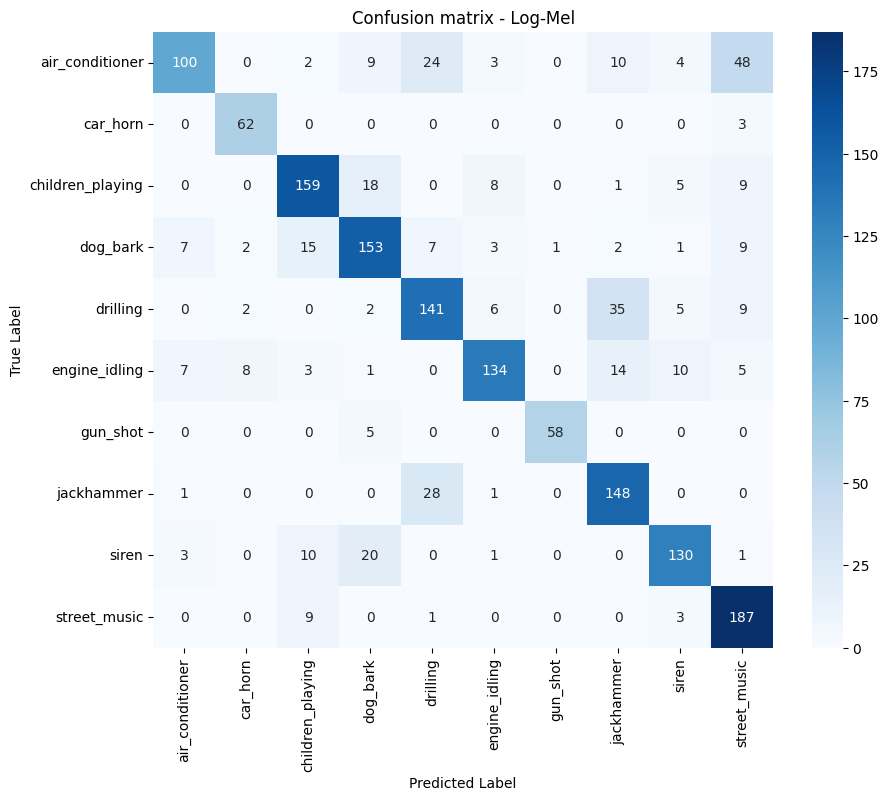


Most confusing pair: True class 'air_conditioner' misclassified as 'street_music' (48 times)

Confusion matrix analysis:
Total misclassifications: 381


In [76]:
# evaluating mel 
print("\nEvaluating best Mel model:")
log_mel_acc, _, _, log_mel_cm = evaluate_model(
    log_mel_model, 
    test_loader_log_mel, 
    "Log-Mel",
    label_encoder.classes_  
)

print("\nConfusion matrix analysis:")
print(f"Total misclassifications: {np.sum(log_mel_cm) - np.trace(log_mel_cm)}")

In [50]:
# tune and train energy features
energy_model, energy_params = tune_hyperparameters(
    CNNLSTM1D,
    train_loader_energy,
    val_loader_energy,
    feature_name='Energy'
)


__________________________________________________
Grid Search for Energy Model:
Testing 27 combinations
__________________________________________________


Trial 1:
  Learning Rate: 0.001000
  LSTM Hidden: 128
  LSTM Layers: 1
  Input Height: N/A
Epoch  | Train Loss | Train Acc  |  Val Loss  |  Val Acc   | Time (s)
----------------------------------------------------------------------
  1    |   1.9957   |   24.66   % |   1.8354   |   33.70   % |   1.3   
  5    |   1.6219   |   38.14   % |   1.6540   |   39.48   % |   1.3   
  10   |   1.4164   |   47.45   % |   5.0723   |   14.23   % |   1.3   
  15   |   1.2855   |   52.59   % |   4.0371   |   20.80   % |   1.3   

Training Complete! Best Val Acc: 43.00% | Total Time: 0.3 min
 New best, Val Acc: 43.00%

Trial 2:
  Learning Rate: 0.001000
  LSTM Hidden: 128
  LSTM Layers: 2
  Input Height: N/A
Epoch  | Train Loss | Train Acc  |  Val Loss  |  Val Acc   | Time (s)
---------------------------------------------------------------------


Evaluating best Energy model:

Energy Test results:
Loss: 1.5233 | Accuracy: 51.60%

Classification report:
                  precision    recall  f1-score   support

 air_conditioner       0.39      0.23      0.29       200
        car_horn       0.46      0.34      0.39        65
children_playing       0.47      0.61      0.53       200
        dog_bark       0.61      0.63      0.62       200
        drilling       0.52      0.68      0.59       200
   engine_idling       0.61      0.39      0.47       182
        gun_shot       0.86      0.78      0.82        63
      jackhammer       0.55      0.62      0.58       178
           siren       0.34      0.30      0.32       165
    street_music       0.51      0.59      0.55       200

        accuracy                           0.52      1653
       macro avg       0.53      0.52      0.52      1653
    weighted avg       0.51      0.52      0.51      1653



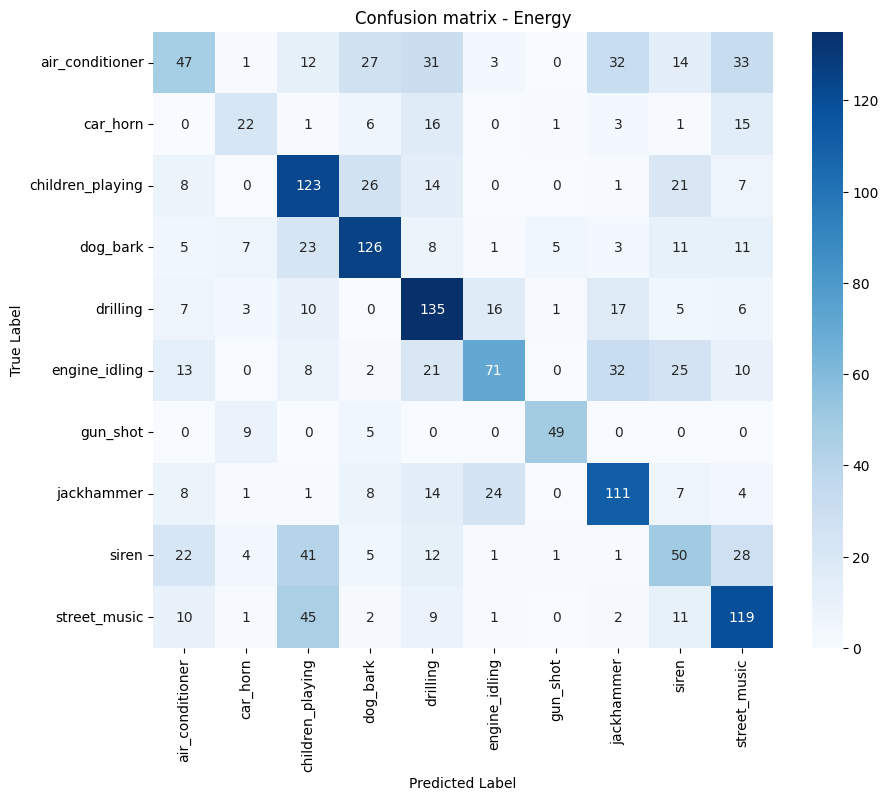


Most confusing pair: True class 'street_music' misclassified as 'children_playing' (45 times)

Confusion matrix analysis:
Total misclassifications: 800


In [51]:
print("\nEvaluating best Energy model:")
energy_acc, _, _,energy_cm = evaluate_model(energy_model, test_loader_energy, "Energy",label_encoder.classes_ )
print("\nConfusion matrix analysis:")
print(f"Total misclassifications: {np.sum(energy_cm) - np.trace(energy_cm)}")

In [57]:
# tune and train MFCC model
mfcc_model, mfcc_params = tune_hyperparameters(
    CNNLSTM2D,
    train_loader_mfcc,
    val_loader_mfcc,
    feature_name='MFCC'
)



__________________________________________________
Grid Search for MFCC Model:
Testing 27 combinations
__________________________________________________


Trial 1:
  Learning Rate: 0.001000
  LSTM Hidden: 128
  LSTM Layers: 1
  Input Height: 20
Epoch  | Train Loss | Train Acc  |  Val Loss  |  Val Acc   | Time (s)
----------------------------------------------------------------------
  1    |   1.6374   |   40.37   % |   1.4975   |   48.30   % |   3.1   
  5    |   0.5847   |   80.94   % |   1.3548   |   62.04   % |   3.0   
  10   |   0.2934   |   90.19   % |   1.5647   |   62.65   % |   3.0   

Training Complete! Best Val Acc: 64.66% | Total Time: 0.5 min
 New best, Val Acc: 64.66%

Trial 2:
  Learning Rate: 0.001000
  LSTM Hidden: 128
  LSTM Layers: 2
  Input Height: 20
Epoch  | Train Loss | Train Acc  |  Val Loss  |  Val Acc   | Time (s)
----------------------------------------------------------------------
  1    |   1.6805   |   39.76   % |   1.5803   |   44.83   % |   3.2   
  


Evaluating best MFCC model:

MFCC Test results:
Loss: 1.2939 | Accuracy: 69.39%

Classification report:
                  precision    recall  f1-score   support

 air_conditioner       0.74      0.63      0.68       200
        car_horn       0.64      0.75      0.70        65
children_playing       0.79      0.71      0.75       200
        dog_bark       0.82      0.69      0.75       200
        drilling       0.62      0.47      0.54       200
   engine_idling       0.85      0.60      0.71       182
        gun_shot       0.95      0.86      0.90        63
      jackhammer       0.52      0.83      0.64       178
           siren       0.68      0.77      0.72       165
    street_music       0.63      0.79      0.70       200

        accuracy                           0.69      1653
       macro avg       0.72      0.71      0.71      1653
    weighted avg       0.72      0.69      0.69      1653



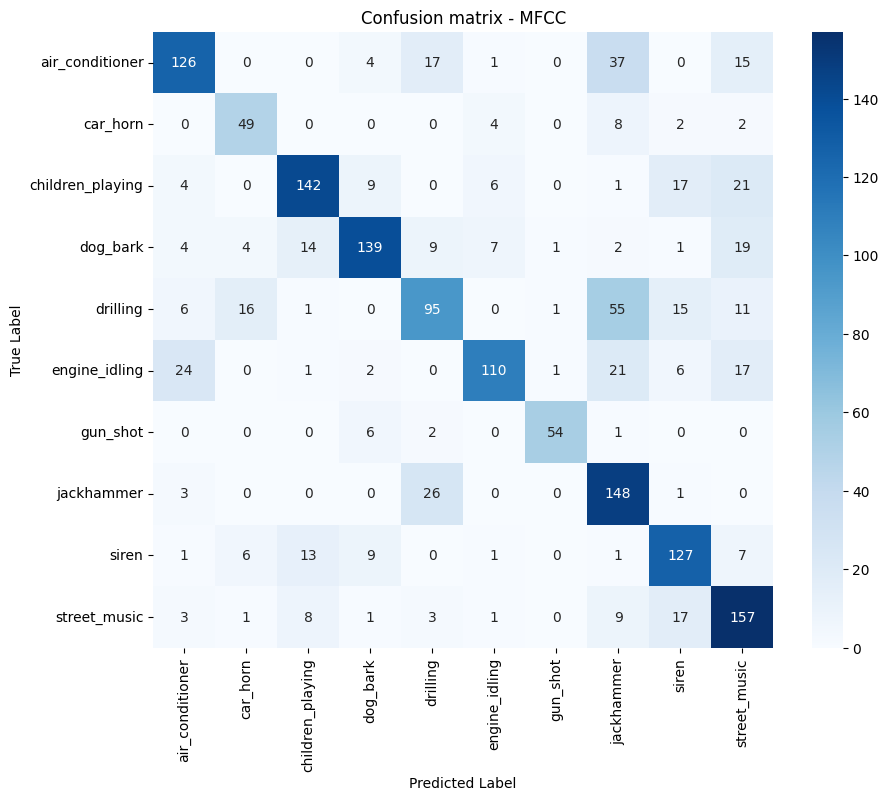


Most confusing pair: True class 'drilling' misclassified as 'jackhammer' (55 times)

Confusion matrix analysis:
Total misclassifications: 506


In [58]:
print("\nEvaluating best MFCC model:")
mfcc_acc, _, _,mfcc_cm = evaluate_model(mfcc_model, test_loader_mfcc, "MFCC",label_encoder.classes_)

print("\nConfusion matrix analysis:")
print(f"Total misclassifications: {np.sum(mfcc_cm) - np.trace(mfcc_cm)}")

In [59]:
# comparison between features
print("\n" + "-"*50)
print("----- Final Results -----")
print("-"*50)
final_table = [
    ["Log-Mel", f"{log_mel_acc:.2f}%"],
    ["Energy", f"{energy_acc:.2f}%"],
    ["MFCC", f"{mfcc_acc:.2f}%"]
]
print(tabulate(final_table, headers=["Feature Type", "Test Accuracy"], tablefmt="grid"))


--------------------------------------------------
----- Final Results -----
--------------------------------------------------
+----------------+-----------------+
| Feature Type   | Test Accuracy   |
+================+=================+
| Log-Mel        | 70.11%          |
+----------------+-----------------+
| Energy         | 51.60%          |
+----------------+-----------------+
| MFCC           | 69.39%          |
+----------------+-----------------+
